# **Start**

In [1]:
# from google.colab import drive
# drive.mount('/content/drive')

In [6]:
!pip uninstall -y scikit-learn
!pip install scikit-learn==1.5.2
!pip install bayesian-optimization
!pip install optuna
!pip install catboost
!pip install gpboost
!pip install shap
!pip install ngboost
!pip install dask[dataframe]
!pip install torch seaborn
!pip install lightgbm
!pip install xgboost
!pip install lime
!pip install interpret
!pip install ipywidgets

Found existing installation: scikit-learn 1.6.1
Uninstalling scikit-learn-1.6.1:
  Successfully uninstalled scikit-learn-1.6.1
  Using cached scikit_learn-1.5.2-cp312-cp312-win_amd64.whl.metadata (13 kB)
Using cached scikit_learn-1.5.2-cp312-cp312-win_amd64.whl (11.0 MB)


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ngboost 0.5.5 requires scikit-learn<2.0,>=1.6, but you have scikit-learn 1.5.2 which is incompatible.


  Using cached scikit_learn-1.6.1-cp312-cp312-win_amd64.whl.metadata (15 kB)
Using cached scikit_learn-1.6.1-cp312-cp312-win_amd64.whl (11.1 MB)
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.5.2
    Uninstalling scikit-learn-1.5.2:
      Successfully uninstalled scikit-learn-1.5.2


In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import randint
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from gpboost import GPBoostRegressor
from ngboost import NGBRegressor
import optuna
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingGridSearchCV
from interpret import show
from interpret.blackbox import LimeTabular, ShapKernel
from optuna.samplers import RandomSampler
import random
import time
from optuna.samplers import BaseSampler
from optuna.samplers import GridSampler
from optuna.samplers import TPESampler
from optuna.samplers import PartialFixedSampler
from optuna.samplers import CmaEsSampler
from optuna.samplers import QMCSampler
from optuna.samplers import NSGAIIISampler
from optuna.samplers import NSGAIISampler
from optuna.samplers import BruteForceSampler
from optuna.samplers import GPSampler
from interpret import set_visualize_provider
from interpret.provider import InlineProvider
from interpret.glassbox import ExplainableBoostingRegressor
from interpret import show

import warnings
warnings.filterwarnings('ignore')

In [9]:
train_data_path = r"C:\Users\dell\Desktop\datascience\projects\train1.csv"
test_data_path = r"C:\Users\dell\Desktop\datascience\projects\test1.csv"
train_data = pd.read_csv(train_data_path)
test_data = pd.read_csv(test_data_path)
print("Training data loaded successfully.")
print("Test data loaded successfully.")

Training data loaded successfully.
Test data loaded successfully.


In [12]:
print("\nShape of training data:", train_data.shape)
print("First 10 rows of training data:\n", train_data.head(5))
print("\nShape of test data:", test_data.shape)
print("First 10 rows of test data:\n", test_data.head(5))


Shape of training data: (47, 15)
First 10 rows of training data:
      pH   TDS    EC    TH   ca    mg  CO3  HCO3   NA    K  CHLORIDE  SULPHATE  \
0  7.90   552   865   452  272   180  0.2   4.5  260   44       375       681   
1  7.52  1985  2256  1054  529   525  0.0  15.0  272   47       728       324   
2  7.65  1865  2032   636  371   265  0.0   9.0  373   25       713       503   
3  7.25  4855  7856  2050  795  1255  0.0  12.5  335  106        81       676   
4  7.96  2855  3696   865  310   555  0.3   4.6  184  106       698       324   

   NITRATE  FLUORIDE  Pre monsoon EWQI   
0       60      0.40              70.52  
1       10      0.65             138.78  
2       54      0.85             113.07  
3       17      0.69             266.32  
4       25      1.20             158.05  

Shape of test data: (47, 15)
First 10 rows of test data:
      pH   TDS    EC    TH     ca      mg  CO3  HCO3   NA    K  CHLORIDE  \
0  8.38   625   975   320  120.0   200.0  0.0   5.8  280   3

In [14]:
X_train = train_data.iloc[:, :-1]
y_train = train_data.iloc[:, -1]
X_test = test_data.iloc[:, :-1]
y_test = test_data.iloc[:, -1]
x_test= X_test
print("\nShape of X_train:", X_train.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_test:", y_test.shape)


Shape of X_train: (47, 14)
Shape of y_train: (47,)
Shape of X_test: (47, 14)
Shape of y_test: (47,)


In [16]:
# Apply z-score normalization
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Print the first five rows of the normalized data
print("\nFirst five rows of normalized X_train:")
print(X_train[:5])

print("\nFirst five rows of normalized X_test:")
print(X_test[:5])


First five rows of normalized X_train:
[[ 0.3797749  -1.15230942 -0.94309903 -0.47923131 -0.09229732 -0.56852482
  -0.03922784 -1.18768739 -0.02713192 -0.87884263 -0.2770724   1.15873613
   1.41276153 -1.25316406]
 [-0.78765707 -0.2953837  -0.52059702  0.45803078  1.31357822  0.10564733
  -0.50015494  1.61405127  0.07159325 -0.77136925  1.29937074 -0.45273785
  -1.61366471 -0.53733141]
 [-0.38827245 -0.36714301 -0.58863473 -0.19275917  0.44926563 -0.40242444
  -0.50015494  0.01305775  0.90253007 -1.55950739  1.23238307  0.35525611
   1.04959038  0.03533472]
 [-1.61714822  1.42085972  1.18034563  2.00871688  2.76868675  1.53215652
  -0.50015494  0.94697063  0.58990037  1.34227396 -1.59003071  1.13616647
  -1.18996504 -0.42279818]
 [ 0.56410627  0.22487128 -0.08321177  0.16377408  0.11557533  0.16427099
   0.19123571 -1.16100417 -0.6523913   1.34227396  1.1653954  -0.45273785
  -0.70573684  1.03750043]]

First five rows of normalized X_test:
[[ 1.85442582 -1.10865585 -0.90968766 -0.6847

In [18]:
# Define the model classes
model_classes = {
    'Random Forest': RandomForestRegressor,
    'Gradient Boosting': GradientBoostingRegressor,
    'XGBoost': XGBRegressor,
    'LightGBM': LGBMRegressor,
    'GPBoost': GPBoostRegressor,
    'CatBoost': CatBoostRegressor,
    'NGBoost': NGBRegressor
}

feature_names = ['pH', 'TDS', 'EC', 'TH', 'Ca', 'Mg','CO3 ','HCO3','NA ', 'K', 'CHLORIDE','SULPHATE','NITRATE','FLUORIDE']


In [20]:
def plot_best_scores(best_scores_ran):
    # Extract unique model names and their best scores
    unique_models = set(model for model, _ in best_scores_ran.keys())
    best_rmse_scores = {}
    best_corr_coef_scores = {}

    for model in unique_models:
        # Find the best RMSE and correlation coefficient for each model
        best_rmse = float('inf')
        best_corr_coef = float('-inf')
        best_rmse_pruner = ""
        best_corr_coef_pruner = ""

        for (model_name, pruner_name), scores in best_scores_ran.items():
            if model_name == model:
                if scores['test_rmse'] < best_rmse:
                    best_rmse = scores['test_rmse']
                    best_rmse_pruner = pruner_name
                if scores['test_corr_coef'] > best_corr_coef:
                    best_corr_coef = scores['test_corr_coef']
                    best_corr_coef_pruner = pruner_name

        best_rmse_scores[model] = (best_rmse, best_rmse_pruner)
        best_corr_coef_scores[model] = (best_corr_coef, best_corr_coef_pruner)

    # Prepare data for plotting
    model_names_rmse = [f"{model} ({pruner})" for model, (rmse, pruner) in best_rmse_scores.items()]
    rmse_values = [rmse for rmse, _ in best_rmse_scores.values()]

    model_names_corr = [f"{model} ({pruner})" for model, (corr, pruner) in best_corr_coef_scores.items()]
    corr_values = [corr for corr, _ in best_corr_coef_scores.values()]

    # Plot RMSE
    plt.figure(figsize=(12, 6))
    bars_rmse = plt.bar(model_names_rmse, rmse_values, color='skyblue')

    # Highlight the best model
    best_rmse_index = np.argmin(rmse_values)
    bars_rmse[best_rmse_index].set_color('orange')

    # Annotate the bars with the RMSE scores
    for i, bar in enumerate(bars_rmse):
        plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() - 0.05,
                 f'{rmse_values[i]:.5f}', ha='center', va='bottom', color='black')

    # Add labels and title for the RMSE bar chart
    plt.xlabel('Model (Pruner)')
    plt.ylabel('Test RMSE')
    plt.title('Best Test RMSE for Each Model')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    # Plot Correlation Coefficient
    plt.figure(figsize=(12, 6))
    bars_corr = plt.bar(model_names_corr, corr_values, color='lightgreen')

    # Highlight the best model
    best_corr_index = np.argmax(corr_values)
    bars_corr[best_corr_index].set_color('orange')

    # Annotate the bars with the correlation coefficient scores
    for i, bar in enumerate(bars_corr):
        plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() - 0.05,
                 f'{corr_values[i]:.5f}', ha='center', va='bottom', color='black')

    # Add labels and title for the correlation coefficient bar chart
    plt.xlabel('Model (Pruner)')
    plt.ylabel('Correlation Coefficient')
    plt.title('Best Correlation Coefficient for Each Model')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

In [22]:
def plot_best_scores_without_pruners(best_scores_ran):
    # Extract unique model names and their best scores
    unique_models = set(best_scores_ran.keys())
    best_rmse_scores = {}
    best_corr_coef_scores = {}

    for model in unique_models:
        # Find the best RMSE and correlation coefficient for each model
        scores = best_scores_ran[model]
        best_rmse_scores[model] = scores['test_rmse']
        best_corr_coef_scores[model] = scores['test_corr_coef']

    # Prepare data for plotting
    model_names_rmse = list(best_rmse_scores.keys())
    rmse_values = list(best_rmse_scores.values())

    model_names_corr = list(best_corr_coef_scores.keys())
    corr_values = list(best_corr_coef_scores.values())

    # Plot RMSE
    plt.figure(figsize=(12, 6))
    bars_rmse = plt.bar(model_names_rmse, rmse_values, color='skyblue')

    # Highlight the best model
    best_rmse_index = np.argmin(rmse_values)
    bars_rmse[best_rmse_index].set_color('orange')

    # Annotate the bars with the RMSE scores
    for i, bar in enumerate(bars_rmse):
        plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() - 0.05,
                 f'{rmse_values[i]:.5f}', ha='center', va='bottom', color='black')

    # Add labels and title for the RMSE bar chart
    plt.xlabel('Model')
    plt.ylabel('Test RMSE')
    plt.title('Best Test RMSE for Each Model')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    # Plot Correlation Coefficient
    plt.figure(figsize=(12, 6))
    bars_corr = plt.bar(model_names_corr, corr_values, color='lightgreen')

    # Highlight the best model
    best_corr_index = np.argmax(corr_values)
    bars_corr[best_corr_index].set_color('orange')

    # Annotate the bars with the correlation coefficient scores
    for i, bar in enumerate(bars_corr):
        plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() - 0.05,
                 f'{corr_values[i]:.5f}', ha='center', va='bottom', color='black')

    # Add labels and title for the correlation coefficient bar chart
    plt.xlabel('Model')
    plt.ylabel('Correlation Coefficient')
    plt.title('Best Correlation Coefficient for Each Model')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()



In [24]:
def generate_interpretml_explanations_summary_pruners(
    results_dict, X_train, y_train, X_test, feature_names, instance_indices=None
):
    if instance_indices is None:
        instance_indices = range(len(X_test))
    elif isinstance(instance_indices, int):
        instance_indices = [instance_indices]

    valid_indices = [idx for idx in instance_indices if 0 <= idx < len(X_test)]
    if not valid_indices:
        print("No valid instance indices provided.")
        return

    if isinstance(X_test, pd.DataFrame):
        instances_to_explain = X_test.iloc[valid_indices]
    else:
        instances_to_explain = X_test[valid_indices]

    best_model_pruners = {}
    for model_key, model_info in results_dict.items():
        if isinstance(model_key, tuple):
            model_name, pruner_name = model_key
        else:
            model_name = model_key
            pruner_name = None

        best_score = model_info.get('best_score')
        if best_score is None:
            print(f"No 'best_score' found for {model_key}. Skipping this combination.")
            continue

        if model_name not in best_model_pruners:
            best_model_pruners[model_name] = {
                'pruner_name': pruner_name,
                'model_info': model_info,
                'best_score': best_score
            }
        else:
            current_best_score = best_model_pruners[model_name]['best_score']
            if best_score < current_best_score:
                best_model_pruners[model_name] = {
                    'pruner_name': pruner_name,
                    'model_info': model_info,
                    'best_score': best_score
                }

    for model_name, info in best_model_pruners.items():
        pruner_name = info['pruner_name']
        model_info = info['model_info']
        best_params = model_info['best_params']
        model_class = model_classes.get(model_name)

        if model_class is None:
            print(f"Model {model_name} is not supported or not available.")
            continue

        if model_name == 'CatBoost':
            best_params['verbose'] = 0

        model = model_class(**best_params)
        model.fit(X_train, y_train)

        def predict_fn(data):
            return model.predict(data)

        if isinstance(X_train, pd.DataFrame):
            data_for_explainer = X_train.values
        else:
            data_for_explainer = X_train

        if isinstance(instances_to_explain, pd.DataFrame):
            data_for_explanation = instances_to_explain.values
        else:
            data_for_explanation = instances_to_explain

        # Generate LIME explanations
        lime_explainer = LimeTabular(
            predict_fn,
            data=data_for_explainer,
            feature_names=feature_names,
            random_state=1,
            mode='regression'
        )
        lime_explanation = lime_explainer.explain_local(data_for_explanation)

        feature_importances_lime = {}
        num_instances = len(valid_indices)

        for idx in range(num_instances):
            explanation = lime_explanation.data(idx)
            for feature_name, feature_score in zip(explanation['names'], explanation['scores']):
                feature_importances_lime[feature_name] = feature_importances_lime.get(feature_name, 0) + abs(feature_score)

        feature_importances_lime = {k: v / num_instances for k, v in feature_importances_lime.items()}
        feature_importances_lime = {k: round(v, 3) for k, v in feature_importances_lime.items()}

        # Generate SHAP explanations using ShapKernel
        try:
            shap_explainer = ShapKernel(predict_fn, data_for_explainer, feature_names=feature_names)
            shap_explanation = shap_explainer.explain_local(data_for_explanation)

            feature_importances_shap = {}
            for idx in range(num_instances):
                explanation = shap_explanation.data(idx)
                for feature_name, feature_score in zip(explanation['names'], explanation['scores']):
                    feature_importances_shap[feature_name] = feature_importances_shap.get(feature_name, 0) + abs(feature_score)

            feature_importances_shap = {k: v / num_instances for k, v in feature_importances_shap.items()}
            feature_importances_shap = {k: round(v, 3) for k, v in feature_importances_shap.items()}
        except Exception as e:
            print(f"Could not compute SHAP values for model {model_name}: {e}")
            continue

        # Plot LIME and SHAP feature importances side by side
        fig, axes = plt.subplots(1, 2, figsize=(14, 6))

        # Plot LIME feature importances
        lime_importances_df = pd.DataFrame.from_dict(
            feature_importances_lime, orient='index', columns=['importance']
        )
        lime_importances_df.sort_values(by='importance', ascending=False, inplace=True)
        lime_importances_df.plot(kind='bar', legend=False, color='skyblue', ax=axes[0])
        axes[0].set_title(f"LIME Feature Importances for {model_name}")
        axes[0].set_ylabel("Average Absolute Importance Score")
        axes[0].set_xlabel("Features")
        axes[0].tick_params(axis='x', rotation=45)

        for p in axes[0].patches:
            height = p.get_height()
            axes[0].annotate(f'{height:.3f}',
                             (p.get_x() + p.get_width() / 2., height),
                             ha='center', va='bottom', fontsize=8)

        # Plot SHAP feature importances
        shap_importances_df = pd.DataFrame.from_dict(
            feature_importances_shap, orient='index', columns=['importance']
        )
        shap_importances_df.sort_values(by='importance', ascending=False, inplace=True)
        shap_importances_df.plot(kind='bar', legend=False, color='orange', ax=axes[1])
        axes[1].set_title(f"SHAP Feature Importances for {model_name}")
        axes[1].set_ylabel("Average Absolute SHAP Value")
        axes[1].set_xlabel("Features")
        axes[1].tick_params(axis='x', rotation=45)

        for p in axes[1].patches:
            height = p.get_height()
            axes[1].annotate(f'{height:.3f}',
                             (p.get_x() + p.get_width() / 2., height),
                             ha='center', va='bottom', fontsize=8)

        plt.tight_layout()
        plt.show()

In [26]:
def generate_interpretml_explanations_summary(
    results_dict, X_train, y_train, X_test, feature_names, instance_indices=None
):
    if instance_indices is None:
        instance_indices = range(len(X_test))
    elif isinstance(instance_indices, int):
        instance_indices = [instance_indices]

    valid_indices = []
    for idx in instance_indices:
        if 0 <= idx < len(X_test):
            valid_indices.append(idx)
        else:
            print(f"Instance index {idx} is out of bounds. Skipping.")

    if not valid_indices:
        print("No valid instance indices provided.")
        return

    if isinstance(X_test, pd.DataFrame):
        instances_to_explain = X_test.iloc[valid_indices]
    else:
        instances_to_explain = X_test[valid_indices]

    for model_name, model_info in results_dict.items():
        best_params = model_info['best_params']
        model_class = model_classes.get(model_name)

        if model_class is None:
            print(f"Model {model_name} is not supported or not available.")
            continue

        if model_name == 'CatBoost':
            best_params['verbose'] = 0

        model = model_class(**best_params)
        model.fit(X_train, y_train)

        def predict_fn(data):
            return model.predict(data)

        if isinstance(X_train, pd.DataFrame):
            data_for_explainer = X_train.values
        else:
            data_for_explainer = X_train

        if isinstance(instances_to_explain, pd.DataFrame):
            data_for_explanation = instances_to_explain.values
        else:
            data_for_explanation = instances_to_explain

        # Generate LIME explanations
        lime_explainer = LimeTabular(
            predict_fn,
            data=data_for_explainer,
            feature_names=feature_names,
            random_state=1,
            mode='regression'
        )

        lime_explanation = lime_explainer.explain_local(data_for_explanation)

        feature_importances_lime = {}
        num_instances = len(valid_indices)

        for idx in range(num_instances):
            explanation = lime_explanation.data(idx)
            for feature_name, feature_score in zip(explanation['names'], explanation['scores']):
                feature_importances_lime[feature_name] = feature_importances_lime.get(feature_name, 0) + abs(feature_score)

        feature_importances_lime = {k: round(v / num_instances, 3) for k, v in feature_importances_lime.items()}

        # Generate SHAP explanations using ShapKernel
        try:
            shap_explainer = ShapKernel(predict_fn, data_for_explainer,feature_names =feature_names)
            shap_explanation = shap_explainer.explain_local(data_for_explanation)

            feature_importances_shap = {}
            for idx in range(num_instances):
                explanation = shap_explanation.data(idx)
                for feature_name, feature_score in zip(explanation['names'], explanation['scores']):
                    feature_importances_shap[feature_name] = feature_importances_shap.get(feature_name, 0) + abs(feature_score)

            feature_importances_shap = {k: round(v / num_instances, 3) for k, v in feature_importances_shap.items()}
        except Exception as e:
            print(f"Could not compute SHAP values for model {model_name}: {e}")
            continue

        fig, axes = plt.subplots(1, 2, figsize=(14, 6))

        lime_importances_df = pd.DataFrame.from_dict(
            feature_importances_lime, orient='index', columns=['importance']
        )
        lime_importances_df.sort_values(by='importance', ascending=False, inplace=True)
        lime_importances_df.plot(kind='bar', legend=False, color='skyblue', ax=axes[0])
        axes[0].set_title(f"LIME Feature Importances for {model_name}")
        axes[0].set_ylabel("Average Absolute Importance Score")
        axes[0].set_xlabel("Features")
        axes[0].tick_params(axis='x', rotation=45)

        for p in axes[0].patches:
            height = p.get_height()
            axes[0].annotate(f'{height:.3f}',
                             (p.get_x() + p.get_width() / 2., height),
                             ha='center', va='bottom', fontsize=8)

        shap_importances_df = pd.DataFrame.from_dict(
            feature_importances_shap, orient='index', columns=['importance']
        )
        shap_importances_df.sort_values(by='importance', ascending=False, inplace=True)
        shap_importances_df.plot(kind='bar', legend=False, color='orange', ax=axes[1])
        axes[1].set_title(f"SHAP Feature Importances for {model_name}")
        axes[1].set_ylabel("Average Absolute SHAP Value")
        axes[1].set_xlabel("Features")
        axes[1].tick_params(axis='x', rotation=45)

        for p in axes[1].patches:
            height = p.get_height()
            axes[1].annotate(f'{height:.3f}',
                             (p.get_x() + p.get_width() / 2., height),
                             ha='center', va='bottom', fontsize=8)

        plt.tight_layout()
        plt.show()

# **Base sampler using optuna**

In [88]:
# Suppress Optuna's verbose output
optuna.logging.set_verbosity(optuna.logging.WARNING)

# Define a custom sampler class that inherits from BaseSampler
class CustomSampler(BaseSampler):
    def __init__(self, seed=None):
        self.seed = seed
        if seed is not None:
            random.seed(seed)
            np.random.seed(seed)

    def infer_relative_search_space(self, study, trial):
        return {}

    def sample_relative(self, study, trial, search_space):
        return {}

    def sample_independent(self, study, trial, param_name, param_distribution):
        if isinstance(param_distribution, optuna.distributions.CategoricalDistribution):
            return random.choice(param_distribution.choices)
        elif isinstance(param_distribution, optuna.distributions.FloatDistribution):
            return random.uniform(param_distribution.low, param_distribution.high)
        elif isinstance(param_distribution, optuna.distributions.IntDistribution):
            return random.randint(param_distribution.low, param_distribution.high)
        else:
            raise NotImplementedError(f"Unsupported distribution: {param_distribution}")

def hyperparameter_tuning_optuna(X_train, y_train, X_test, y_test):
    def objective(trial, model_name, model_class, param_space):
        # Suggest hyperparameters
        params = {key: trial.suggest_categorical(key, values) if isinstance(values, list) else trial.suggest_float(key, *values) for key, values in param_space.items()}

        # Create a new instance of the model
        model = model_class()
        model.set_params(**params)

        # Ensure the input arrays are writable
        X_train_copy = np.array(X_train, copy=True)
        y_train_copy = np.array(y_train, copy=True)
        X_test_copy = np.array(X_test, copy=True)
        y_test_copy = np.array(y_test, copy=True)

        # Train model
        model.fit(X_train_copy, y_train_copy)

        # Predict
        y_pred = model.predict(X_test_copy)

        # Calculate MSE
        mse = mean_squared_error(y_test_copy, y_pred)

        return mse

    models = {
        'Random Forest': (RandomForestRegressor, {
            'n_estimators': [100, 200, 500],
            'max_depth': [None, 5, 10, 15],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'max_features': ['sqrt', 'log2', None]
        }),
        'Gradient Boosting': (GradientBoostingRegressor, {
            'n_estimators': [100, 200, 500],
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 10],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'max_features': ['sqrt', 'log2']
        }),
        'XGBoost': (XGBRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'min_child_weight': [1, 3, 5],
            'gamma': [0, 0.1, 0.5, 1],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9]
        }),
        'LightGBM': (LGBMRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'num_leaves': [15, 31, 63],
            'min_child_samples': [1, 5, 10],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9],
            'verbose': [-1]
        }),
        'GPBoost': (GPBoostRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'num_leaves': [15, 31, 63],
            'min_child_samples': [1, 5, 10],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9],
            'alpha': [0.1, 0.5, 1.0],
            'lambda': [0.1, 0.5, 1.0],
            'verbose': [-1]
        }),
        'CatBoost': (CatBoostRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'iterations': [100, 200, 300, 500],
            'depth': [3, 5, 7],
            'l2_leaf_reg': [1, 3, 5],
            'border_count': [32, 64, 128],
            'verbose': [0]
        }),
        'NGBoost': (NGBRegressor, {
            'n_estimators': [100, 200],
            'learning_rate': [0.01, 0.1],
            'natural_gradient': [True, False],
            'minibatch_frac': [0.5, 0.7],
            'verbose': [0]
        })
    }

    pruners = [
        optuna.pruners.MedianPruner(),
        optuna.pruners.NopPruner(),
        optuna.pruners.PatientPruner(optuna.pruners.MedianPruner(), patience=3),
        optuna.pruners.PercentilePruner(25.0),
        optuna.pruners.SuccessiveHalvingPruner(),
        optuna.pruners.HyperbandPruner(),
        optuna.pruners.ThresholdPruner(lower=0.1),
        optuna.pruners.WilcoxonPruner()
    ]

    best_scores = {}
    for model_name, (model_class, param_space) in models.items():
        for pruner in pruners:
            pruner_name = pruner.__class__.__name__
            print(f"Running Optuna for {model_name} with {pruner_name}...")
            try:
                # Use the custom sampler and pruner in the study creation
                sampler = CustomSampler()
                study = optuna.create_study(direction='minimize', sampler=sampler, pruner=pruner)
                study.optimize(lambda trial: objective(trial, model_name, model_class, param_space), n_trials=50)

                best_params = study.best_params
                best_model = model_class().set_params(**best_params)
                best_model.fit(X_train, y_train)
                y_pred = best_model.predict(X_test)

                # Calculate MSE
                mse = mean_squared_error(y_test, y_pred)

                # Calculate RMSE
                rmse = np.sqrt(mse)

                # Calculate correlation coefficient
                numerator = np.sum((y_test - np.mean(y_test)) * (y_pred - np.mean(y_pred)))
                denominator = np.sqrt(np.sum((y_test - np.mean(y_test))**2) * np.sum((y_pred - np.mean(y_pred))**2))
                corr_coef = numerator / denominator if denominator != 0 else 0.0

                best_scores[(model_name, pruner_name)] = {
                    'best_score': mse,
                    'best_params': best_params,
                    'test_mse': mse,
                    'test_rmse': rmse,
                    'test_corr_coef': corr_coef,
                    'pruner': pruner_name
                }
                print(f"Best MSE for {model_name} with {pruner_name}: {mse} with params: {best_params}")
                print(f"Best RMSE for {model_name} with {pruner_name}: {rmse}")
                print(f"Correlation Coefficient for {model_name} with {pruner_name}: {corr_coef}")
            except Exception as e:
                print(f"Failed to run Optuna for {model_name} with {pruner_name}. Error: {e}")

    # Find the model with the best test score
    if best_scores:
        best_model_name, best_pruner_name = min(best_scores, key=lambda k: best_scores[k]['test_mse'])
        best_model_info = best_scores[(best_model_name, best_pruner_name)]
        print(f"\nBest model on test data: {best_model_name} with {best_pruner_name}")
        print(f"Test MSE: {best_model_info['test_mse']}")
        print(f"Test RMSE: {best_model_info['test_rmse']}")
        print(f"Correlation Coefficient: {best_model_info['test_corr_coef']}")
        print(f"Best Parameters: {best_model_info['best_params']}")
        print(f"Pruner Used: {best_model_info['pruner']}")
    else:
        print("No valid model configurations found.")

    return best_scores

best_scores_basesampler = hyperparameter_tuning_optuna(X_train, y_train, X_test, y_test)

Running Optuna for Random Forest with MedianPruner...
Best MSE for Random Forest with MedianPruner: 528.7777555889253 with params: {'n_estimators': 500, 'max_depth': None, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': None}
Best RMSE for Random Forest with MedianPruner: 22.99516809220853
Correlation Coefficient for Random Forest with MedianPruner: 0.950517901542975
Running Optuna for Random Forest with NopPruner...
Best MSE for Random Forest with NopPruner: 472.8005052583304 with params: {'n_estimators': 500, 'max_depth': None, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}
Best RMSE for Random Forest with NopPruner: 21.743976298237875
Correlation Coefficient for Random Forest with NopPruner: 0.958508773690011
Running Optuna for Random Forest with PatientPruner...
Best MSE for Random Forest with PatientPruner: 490.0297728579833 with params: {'n_estimators': 500, 'max_depth': None, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None

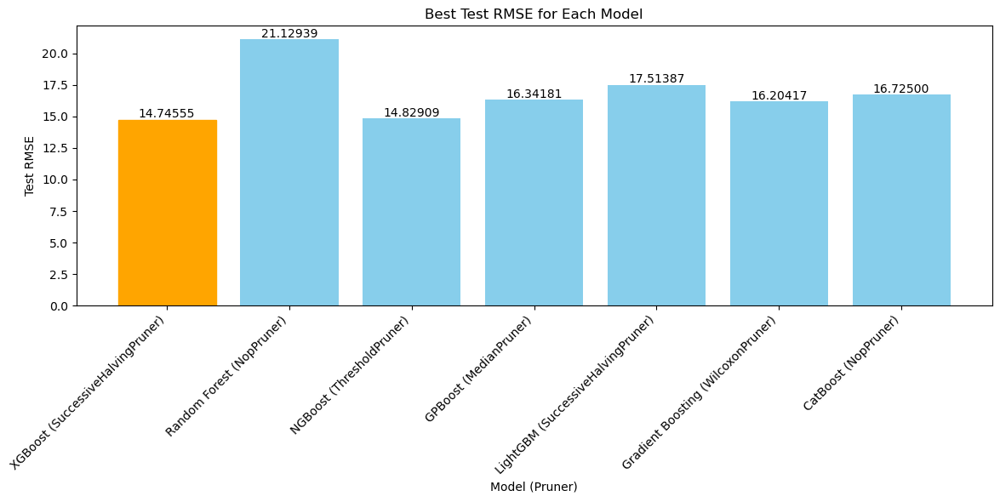

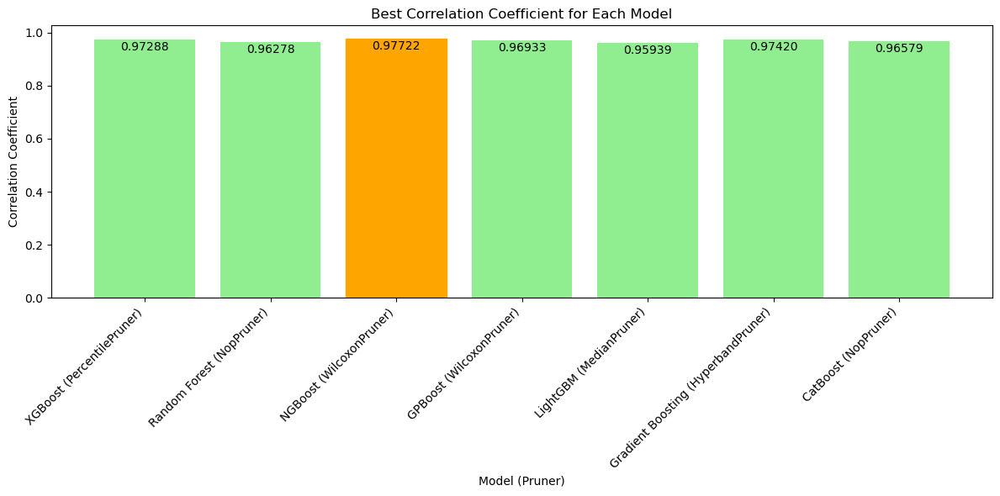

In [71]:
plot_best_scores(best_scores_basesampler)

  0%|          | 0/47 [00:00<?, ?it/s]

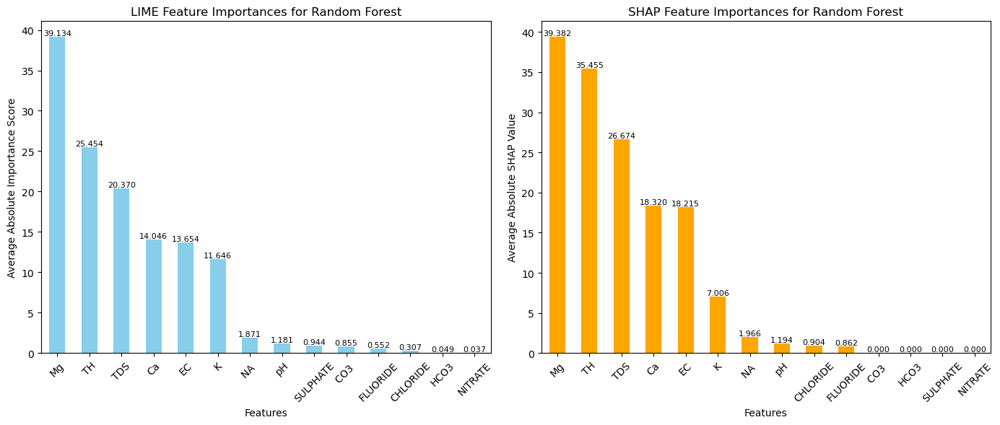

  0%|          | 0/47 [00:00<?, ?it/s]

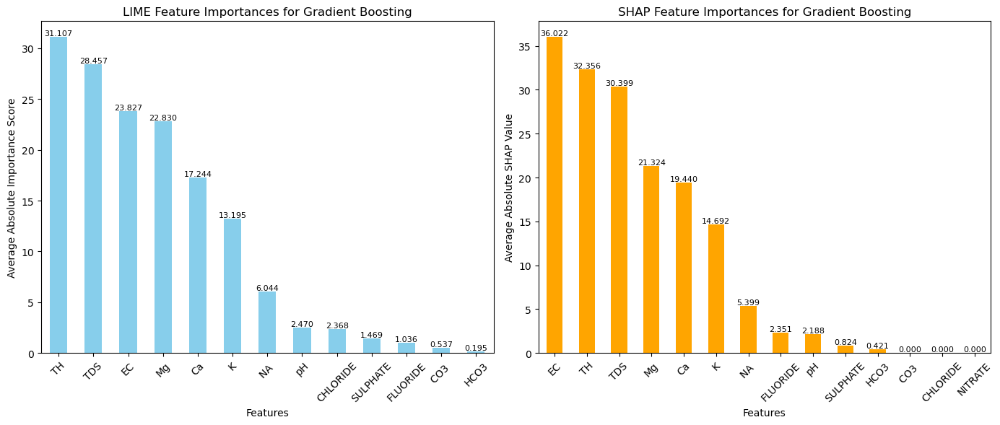

  0%|          | 0/47 [00:00<?, ?it/s]

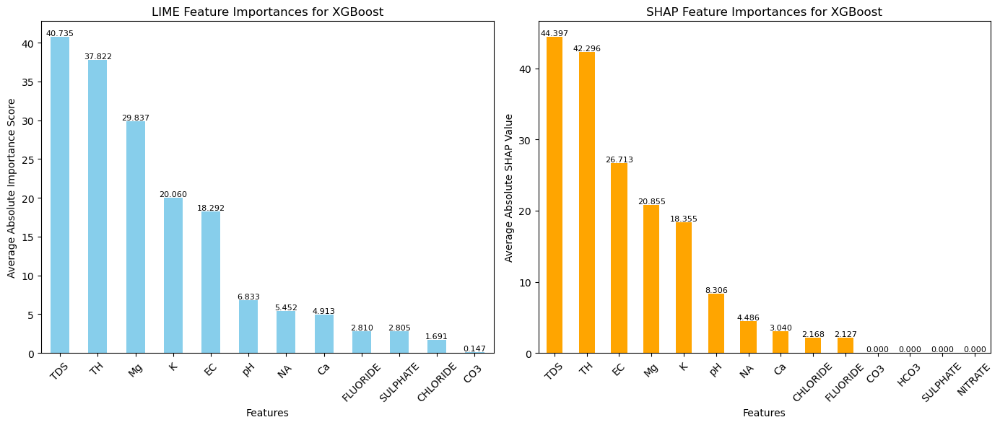

  0%|          | 0/47 [00:00<?, ?it/s]

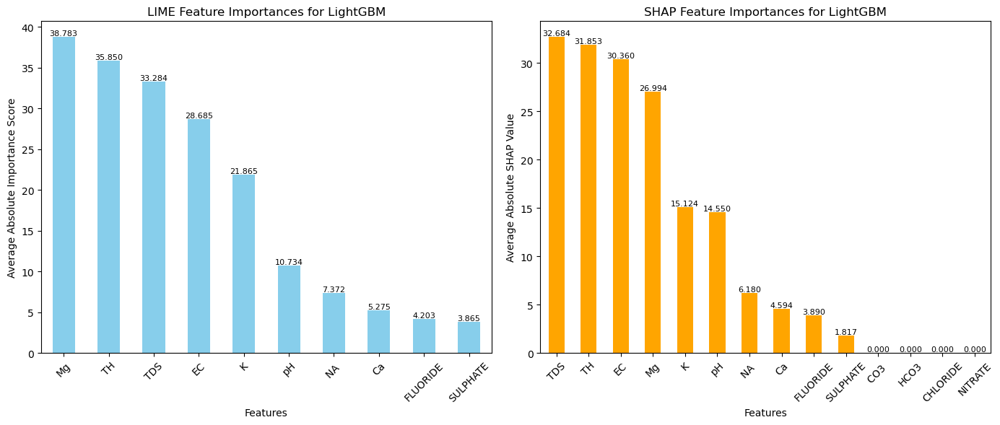

[GPBoost] [Warning] lambda_l2 is set with reg_lambda=0.0, will be overridden by lambda=1.0. Current value: lambda_l2=1.0


  0%|          | 0/47 [00:00<?, ?it/s]

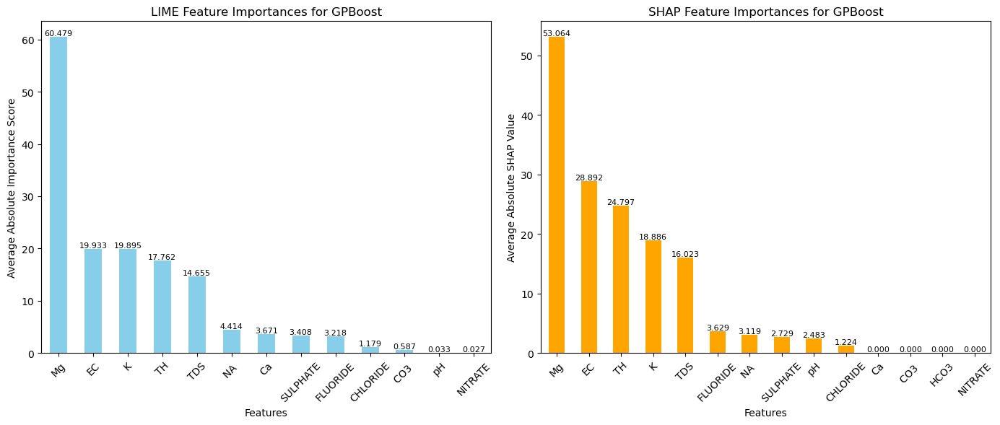

  0%|          | 0/47 [00:00<?, ?it/s]

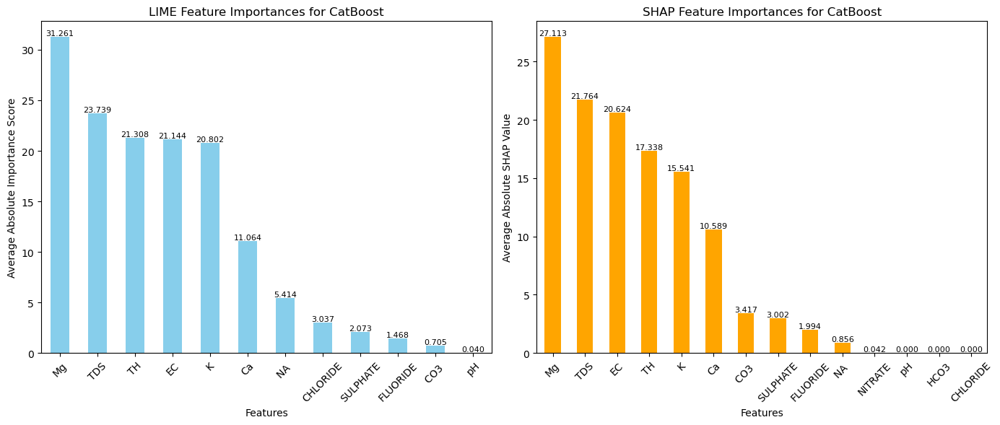

  0%|          | 0/47 [00:00<?, ?it/s]

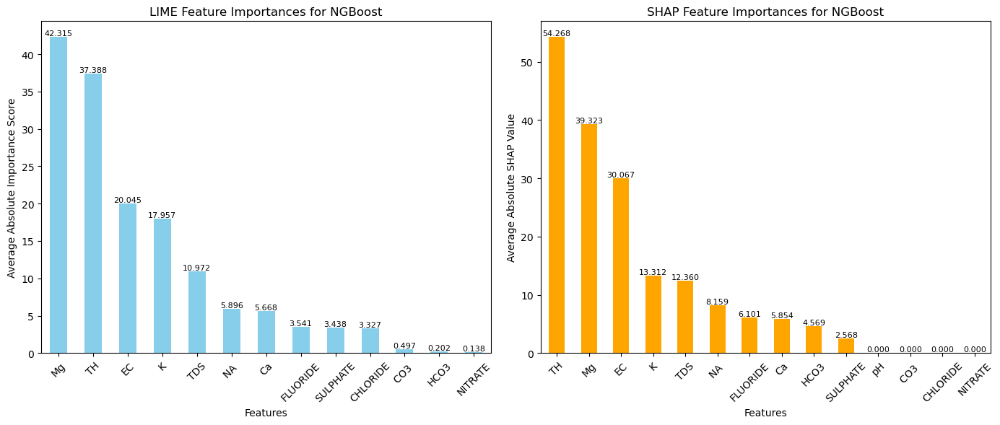

In [73]:
generate_interpretml_explanations_summary_pruners(best_scores_basesampler, X_train, y_train, x_test, feature_names)

# **GridSampler using optuna**

In [89]:
# Suppress Optuna's verbose output
optuna.logging.set_verbosity(optuna.logging.WARNING)

def hyperparameter_tuning_grid(X_train, y_train, X_test, y_test):
    def objective(trial, model_name, model_class, param_space):
        # Suggest hyperparameters
        params = {key: trial.suggest_categorical(key, values) for key, values in param_space.items()}

        # Create a new instance of the model
        model = model_class()
        model.set_params(**params)

        # Ensure the input arrays are writable
        X_train_copy = np.array(X_train, copy=True)
        y_train_copy = np.array(y_train, copy=True)
        X_test_copy = np.array(X_test, copy=True)
        y_test_copy = np.array(y_test, copy=True)

        # Train model
        model.fit(X_train_copy, y_train_copy)

        # Predict
        y_pred = model.predict(X_test_copy)

        # Calculate MSE
        mse = mean_squared_error(y_test_copy, y_pred)

        return mse

    models = {
        'Random Forest': (RandomForestRegressor, {
            'n_estimators': [100, 200, 500],
            'max_depth': [None, 5, 10, 15],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'max_features': ['sqrt', 'log2', None]
        }),
        'Gradient Boosting': (GradientBoostingRegressor, {
            'n_estimators': [100, 200, 500],
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 10],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'max_features': ['sqrt', 'log2']
        }),
        'XGBoost': (XGBRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'min_child_weight': [1, 3, 5],
            'gamma': [0, 0.1, 0.5, 1],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9]
        }),
        'LightGBM': (LGBMRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'num_leaves': [15, 31, 63],
            'min_child_samples': [1, 5, 10],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9],
            'verbose': [-1]
        }),
        'GPBoost': (GPBoostRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'num_leaves': [15, 31, 63],
            'min_child_samples': [1, 5, 10],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9],
            'alpha': [0.1, 0.5, 1.0],
            'lambda': [0.1, 0.5, 1.0],
            'verbose': [-1]
        }),
        'CatBoost': (CatBoostRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'iterations': [100, 200, 300, 500],
            'depth': [3, 5, 7],
            'l2_leaf_reg': [1, 3, 5],
            'border_count': [32, 64, 128],
            'verbose': [0]
        }),
        'NGBoost': (NGBRegressor, {
            'n_estimators': [100, 200],
            'learning_rate': [0.01, 0.1],
            'natural_gradient': [True, False],
            'minibatch_frac': [0.5, 0.7],
            'verbose': [0]
        })
    }

    pruners = [
        optuna.pruners.MedianPruner(),
        optuna.pruners.NopPruner(),
        optuna.pruners.PatientPruner(optuna.pruners.MedianPruner(), patience=3),
        optuna.pruners.PercentilePruner(25.0),
        optuna.pruners.SuccessiveHalvingPruner(),
        optuna.pruners.HyperbandPruner(),
        optuna.pruners.ThresholdPruner(lower=0.1),
        optuna.pruners.WilcoxonPruner()
    ]

    best_scores = {}
    for model_name, (model_class, param_space) in models.items():
        for pruner in pruners:
            pruner_name = pruner.__class__.__name__
            print(f"Running Optuna for {model_name} with {pruner_name}...")
            try:
                # Use the GridSampler and pruner in the study creation
                sampler = GridSampler(param_space)
                study = optuna.create_study(direction='minimize', sampler=sampler, pruner=pruner)
                study.optimize(lambda trial: objective(trial, model_name, model_class, param_space), n_trials=50)

                best_params = study.best_params
                best_model = model_class().set_params(**best_params)
                best_model.fit(X_train, y_train)
                y_pred = best_model.predict(X_test)

                # Calculate MSE
                mse = mean_squared_error(y_test, y_pred)

                # Calculate RMSE
                rmse = np.sqrt(mse)

                # Calculate correlation coefficient
                numerator = np.sum((y_test - np.mean(y_test)) * (y_pred - np.mean(y_pred)))
                denominator = np.sqrt(np.sum((y_test - np.mean(y_test))**2) * np.sum((y_pred - np.mean(y_pred))**2))
                corr_coef = numerator / denominator if denominator != 0 else 0.0

                best_scores[(model_name, pruner_name)] = {
                    'best_score': mse,
                    'best_params': best_params,
                    'test_mse': mse,
                    'test_rmse': rmse,
                    'test_corr_coef': corr_coef,
                    'pruner': pruner_name
                }
                print(f"Best MSE for {model_name} with {pruner_name}: {mse} with params: {best_params}")
                print(f"Best RMSE for {model_name} with {pruner_name}: {rmse}")
                print(f"Correlation Coefficient for {model_name} with {pruner_name}: {corr_coef}")
            except Exception as e:
                print(f"Failed to run Optuna for {model_name} with {pruner_name}. Error: {e}")

    # Find the model with the best test score
    if best_scores:
        best_model_name, best_pruner_name = min(best_scores, key=lambda k: best_scores[k]['test_mse'])
        best_model_info = best_scores[(best_model_name, best_pruner_name)]
        print(f"\nBest model on test data: {best_model_name} with {best_pruner_name}")
        print(f"Test MSE: {best_model_info['test_mse']}")
        print(f"Test RMSE: {best_model_info['test_rmse']}")
        print(f"Correlation Coefficient: {best_model_info['test_corr_coef']}")
        print(f"Best Parameters: {best_model_info['best_params']}")
        print(f"Pruner Used: {best_model_info['pruner']}")
    else:
        print("No valid model configurations found.")

    return best_scores

# Example usage
best_scores_grid_sampler = hyperparameter_tuning_grid(X_train, y_train, X_test, y_test)

Running Optuna for Random Forest with MedianPruner...
Best MSE for Random Forest with MedianPruner: 491.9705848031415 with params: {'n_estimators': 200, 'max_depth': 5, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}
Best RMSE for Random Forest with MedianPruner: 22.180409933162675
Correlation Coefficient for Random Forest with MedianPruner: 0.9589335413793886
Running Optuna for Random Forest with NopPruner...
Best MSE for Random Forest with NopPruner: 480.2297803962052 with params: {'n_estimators': 500, 'max_depth': 10, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}
Best RMSE for Random Forest with NopPruner: 21.91414566886433
Correlation Coefficient for Random Forest with NopPruner: 0.9583827090184721
Running Optuna for Random Forest with PatientPruner...
Best MSE for Random Forest with PatientPruner: 491.51312960675233 with params: {'n_estimators': 200, 'max_depth': None, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}


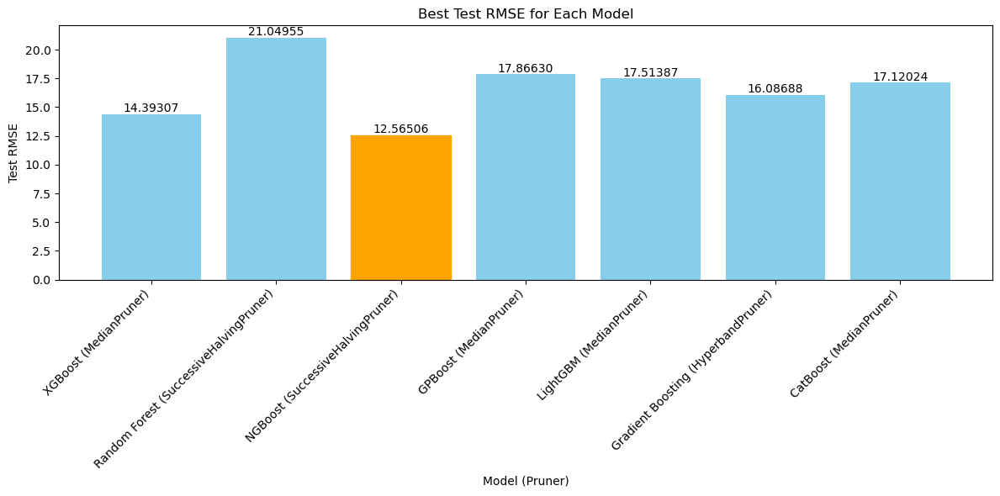

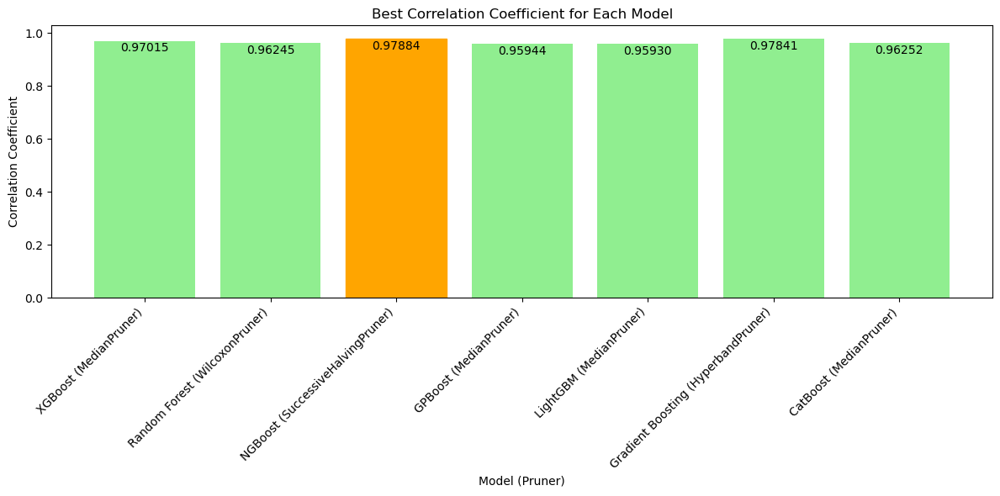

In [77]:
plot_best_scores(best_scores_grid_sampler)

  0%|          | 0/47 [00:00<?, ?it/s]

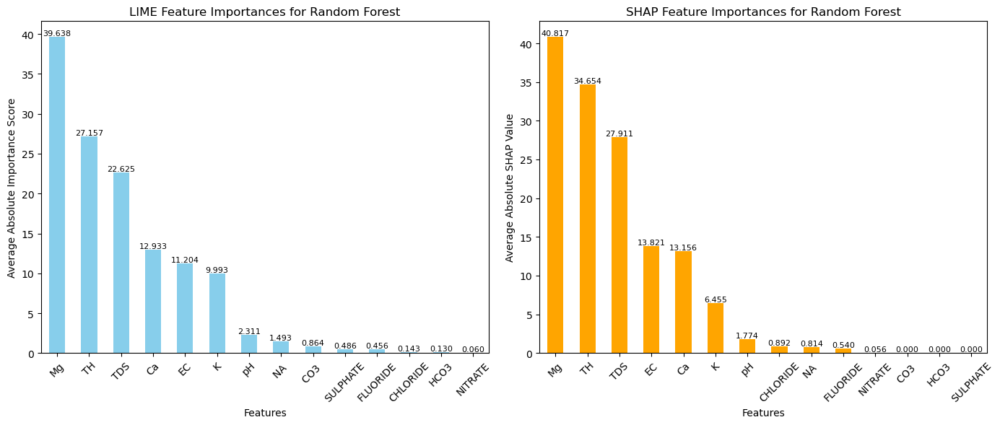

  0%|          | 0/47 [00:00<?, ?it/s]

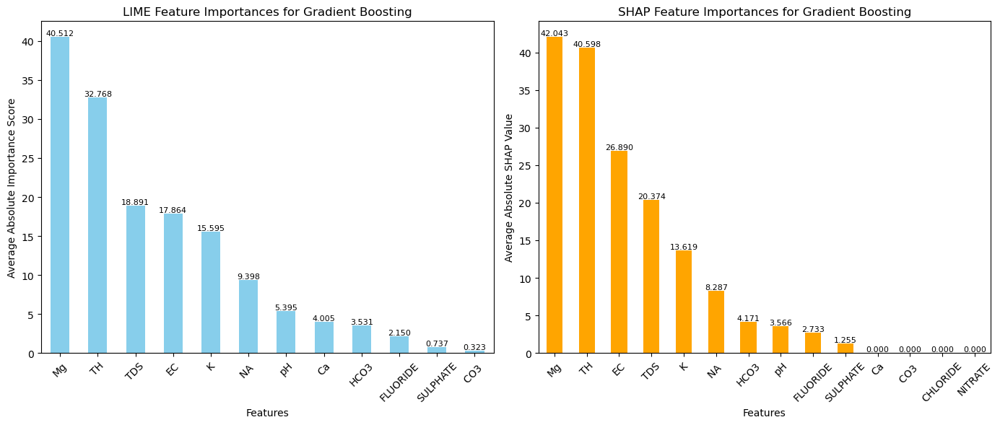

  0%|          | 0/47 [00:00<?, ?it/s]

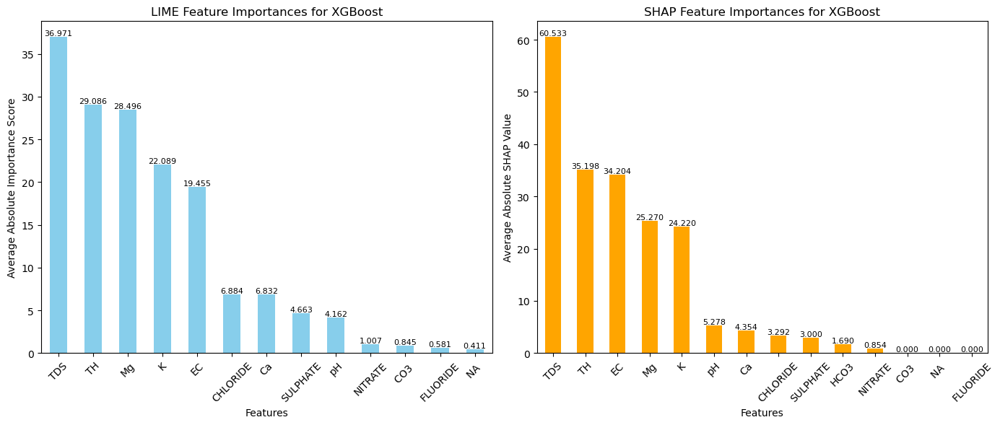

  0%|          | 0/47 [00:00<?, ?it/s]

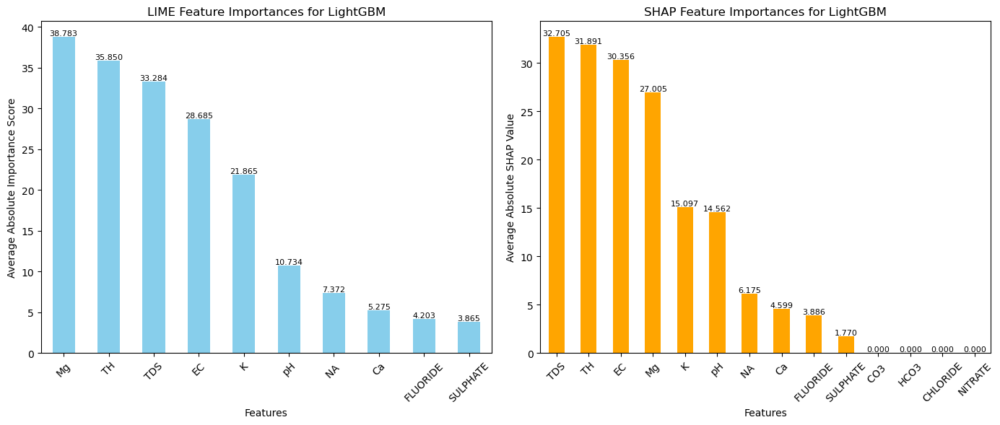

[GPBoost] [Warning] lambda_l2 is set with reg_lambda=0.0, will be overridden by lambda=0.5. Current value: lambda_l2=0.5


  0%|          | 0/47 [00:00<?, ?it/s]

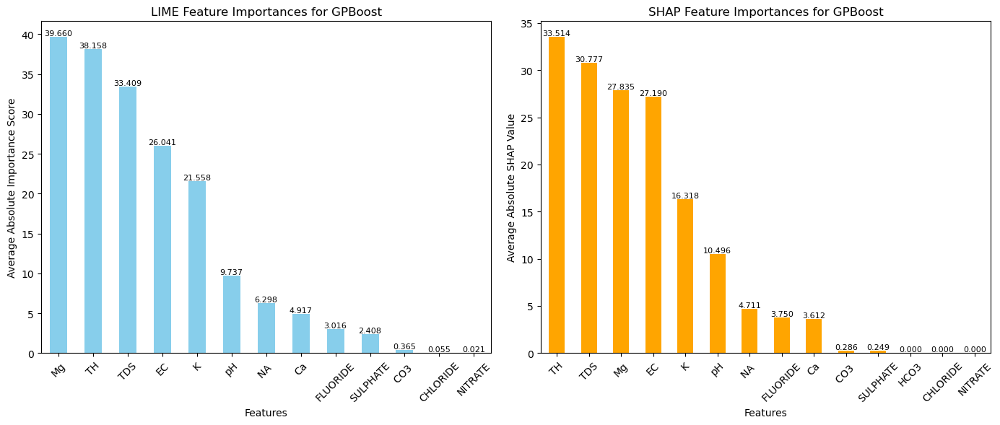

  0%|          | 0/47 [00:00<?, ?it/s]

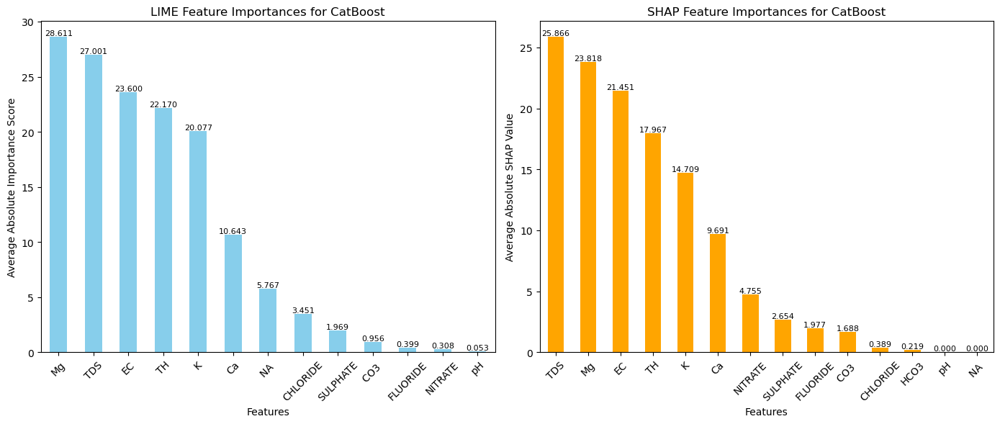

  0%|          | 0/47 [00:00<?, ?it/s]

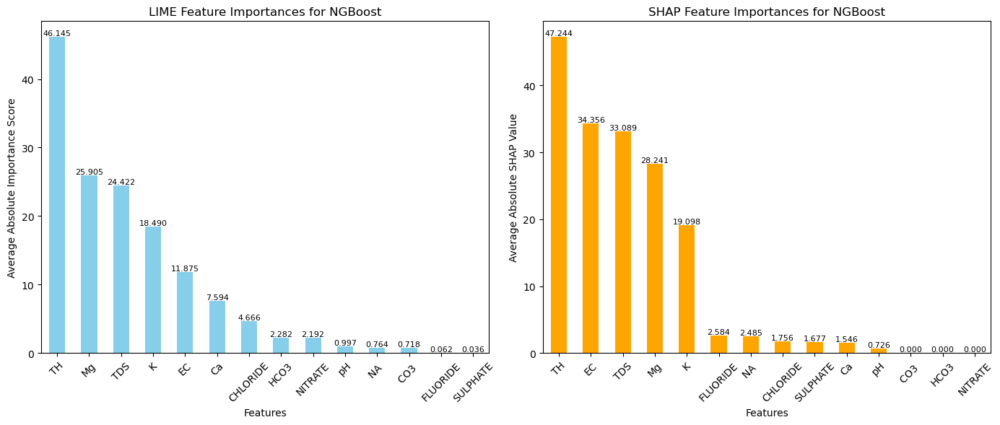

In [78]:
generate_interpretml_explanations_summary_pruners(best_scores_grid_sampler, X_train, y_train, x_test, feature_names)

# **RandomSampler using optuna**

In [ ]:
# Suppress Optuna's verbose output
optuna.logging.set_verbosity(optuna.logging.WARNING)

def hyperparameter_tuning_ran(X_train, y_train, X_test, y_test):
    def objective(trial, model_name, model_class, param_space):
        # Suggest hyperparameters
        params = {key: trial.suggest_categorical(key, values) if isinstance(values, list) else trial.suggest_float(key, *values) for key, values in param_space.items()}

        # Create a new instance of the model
        model = model_class()
        model.set_params(**params)

        # Ensure the input arrays are writable
        X_train_copy = np.array(X_train, copy=True)
        y_train_copy = np.array(y_train, copy=True)
        X_test_copy = np.array(X_test, copy=True)
        y_test_copy = np.array(y_test, copy=True)

        # Train model
        model.fit(X_train_copy, y_train_copy)

        # Predict
        y_pred = model.predict(X_test_copy)

        # Calculate MSE
        mse = mean_squared_error(y_test_copy, y_pred)

        return mse

    models = {
        'Random Forest': (RandomForestRegressor, {
            'n_estimators': [100, 200, 500],
            'max_depth': [None, 5, 10, 15],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'max_features': ['sqrt', 'log2', None]
        }),
        'Gradient Boosting': (GradientBoostingRegressor, {
            'n_estimators': [100, 200, 500],
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 10],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'max_features': ['sqrt', 'log2']
        }),
        'XGBoost': (XGBRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'min_child_weight': [1, 3, 5],
            'gamma': [0, 0.1, 0.5, 1],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9]
        }),
        'LightGBM': (LGBMRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'num_leaves': [15, 31, 63],
            'min_child_samples': [1, 5, 10],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9],
            'verbose': [-1]
        }),
        'GPBoost': (GPBoostRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'num_leaves': [15, 31, 63],
            'min_child_samples': [1, 5, 10],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9],
            'alpha': [0.1, 0.5, 1.0],
            'lambda': [0.1, 0.5, 1.0],
            'verbose': [-1]
        }),
        'CatBoost': (CatBoostRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'iterations': [100, 200, 300, 500],
            'depth': [3, 5, 7],
            'l2_leaf_reg': [1, 3, 5],
            'border_count': [32, 64, 128],
            'verbose': [0]
        }),
        'NGBoost': (NGBRegressor, {
            'n_estimators': [100, 200],
            'learning_rate': [0.01, 0.1],
            'natural_gradient': [True, False],
            'minibatch_frac': [0.5, 0.7],
            'verbose': [0]
        })
    }

    pruners = [
        optuna.pruners.MedianPruner(),
        optuna.pruners.NopPruner(),
        optuna.pruners.PatientPruner(optuna.pruners.MedianPruner(), patience=3),
        optuna.pruners.PercentilePruner(25.0),
        optuna.pruners.SuccessiveHalvingPruner(),
        optuna.pruners.HyperbandPruner(),
        optuna.pruners.ThresholdPruner(lower=0.1),
        optuna.pruners.WilcoxonPruner()
    ]

    best_scores = {}
    for model_name, (model_class, param_space) in models.items():
        for pruner in pruners:
            pruner_name = pruner.__class__.__name__
            print(f"Running Optuna for {model_name} with {pruner_name}...")
            try:
                # Use the RandomSampler and pruner in the study creation
                sampler = RandomSampler()
                study = optuna.create_study(direction='minimize', sampler=sampler, pruner=pruner)
                study.optimize(lambda trial: objective(trial, model_name, model_class, param_space), n_trials=50)

                best_params = study.best_params
                best_model = model_class().set_params(**best_params)
                best_model.fit(X_train, y_train)
                y_pred = best_model.predict(X_test)

                # Calculate MSE
                mse = mean_squared_error(y_test, y_pred)

                # Calculate RMSE
                rmse = np.sqrt(mse)

                # Calculate correlation coefficient
                numerator = np.sum((y_test - np.mean(y_test)) * (y_pred - np.mean(y_pred)))
                denominator = np.sqrt(np.sum((y_test - np.mean(y_test))**2) * np.sum((y_pred - np.mean(y_pred))**2))
                corr_coef = numerator / denominator if denominator != 0 else 0.0

                best_scores[(model_name, pruner_name)] = {
                    'best_score': mse,
                    'best_params': best_params,
                    'test_mse': mse,
                    'test_rmse': rmse,
                    'test_corr_coef': corr_coef,
                    'pruner': pruner_name
                }
                print(f"Best MSE for {model_name} with {pruner_name}: {mse} with params: {best_params}")
                print(f"Best RMSE for {model_name} with {pruner_name}: {rmse}")
                print(f"Correlation Coefficient for {model_name} with {pruner_name}: {corr_coef}")
            except Exception as e:
                print(f"Failed to run Optuna for {model_name} with {pruner_name}. Error: {e}")

    # Find the model with the best test score
    if best_scores:
        best_model_name, best_pruner_name = min(best_scores, key=lambda k: best_scores[k]['test_mse'])
        best_model_info = best_scores[(best_model_name, best_pruner_name)]
        print(f"\nBest model on test data: {best_model_name} with {best_pruner_name}")
        print(f"Test MSE: {best_model_info['test_mse']}")
        print(f"Test RMSE: {best_model_info['test_rmse']}")
        print(f"Correlation Coefficient: {best_model_info['test_corr_coef']}")
        print(f"Best Parameters: {best_model_info['best_params']}")
        print(f"Pruner Used: {best_model_info['pruner']}")
    else:
        print("No valid model configurations found.")

    return best_scores

best_scores_random_sampler = hyperparameter_tuning_ran(X_train, y_train, X_test, y_test)

Running Optuna for Random Forest with MedianPruner...
Best MSE for Random Forest with MedianPruner: 459.15141062700934 with params: {'n_estimators': 100, 'max_depth': 10, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': None}
Best RMSE for Random Forest with MedianPruner: 21.427818615692296
Correlation Coefficient for Random Forest with MedianPruner: 0.9633844890001777
Running Optuna for Random Forest with NopPruner...
Best MSE for Random Forest with NopPruner: 548.7556974299482 with params: {'n_estimators': 200, 'max_depth': None, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': None}
Best RMSE for Random Forest with NopPruner: 23.425535157813325
Correlation Coefficient for Random Forest with NopPruner: 0.9523209856519682
Running Optuna for Random Forest with PatientPruner...
Best MSE for Random Forest with PatientPruner: 513.2997876255287 with params: {'n_estimators': 200, 'max_depth': None, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': No

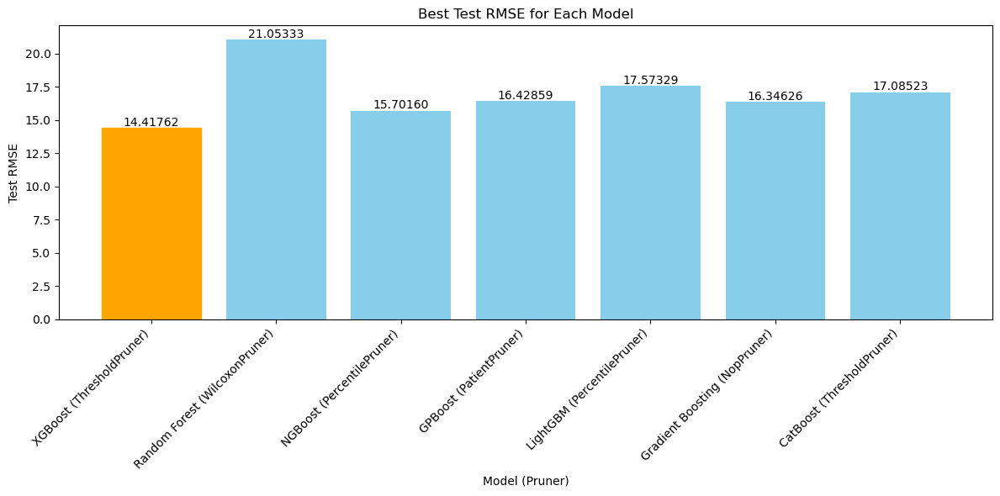

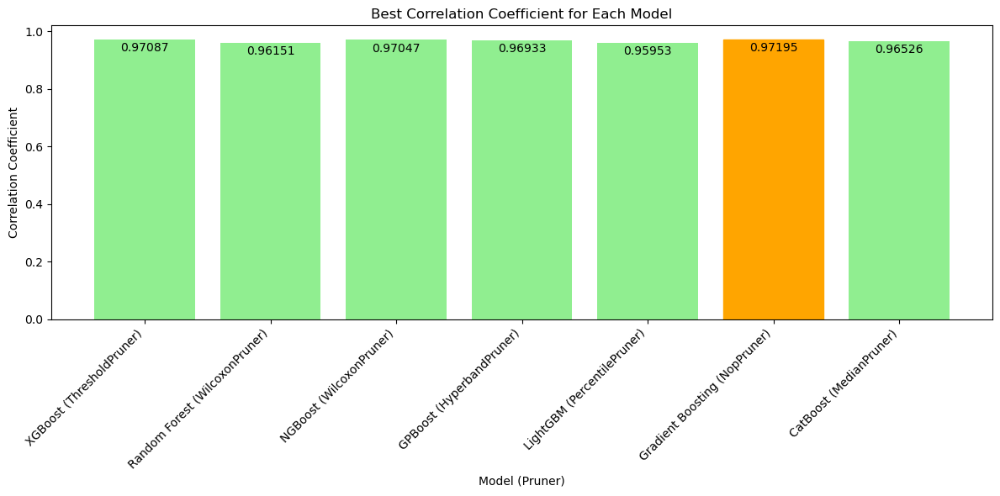

In [85]:
plot_best_scores(best_scores_random_sampler)

  0%|          | 0/47 [00:00<?, ?it/s]

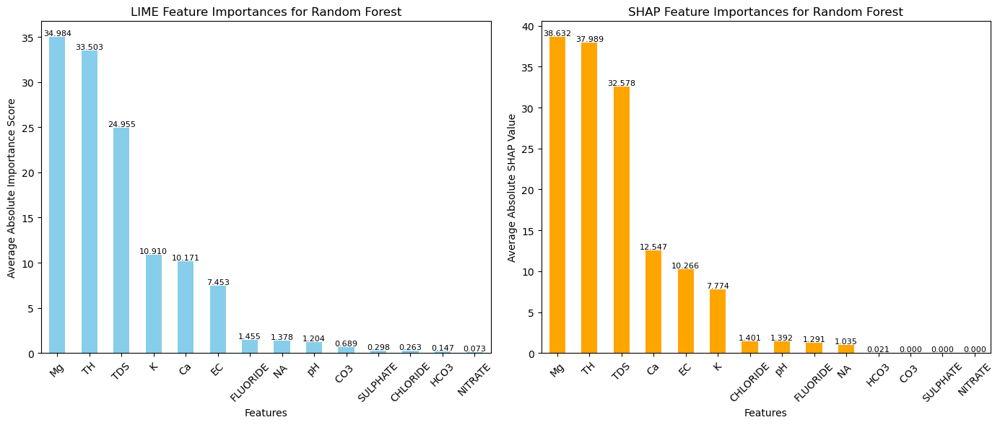

  0%|          | 0/47 [00:00<?, ?it/s]

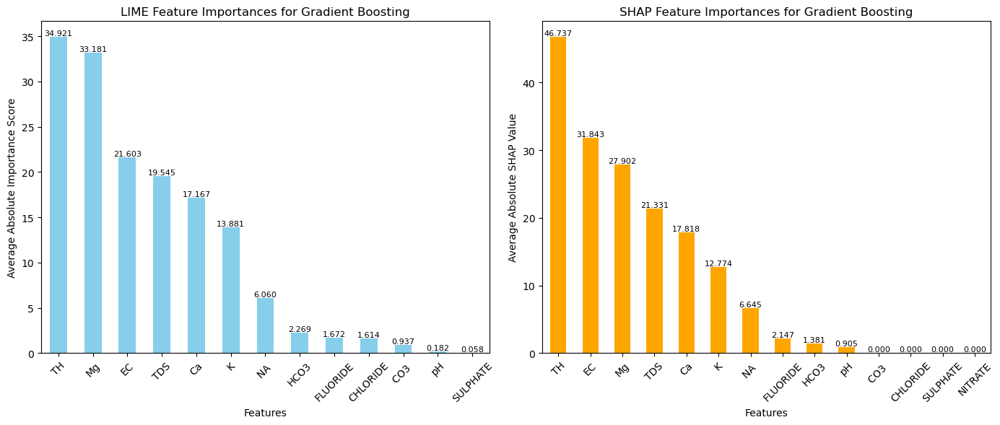

  0%|          | 0/47 [00:00<?, ?it/s]

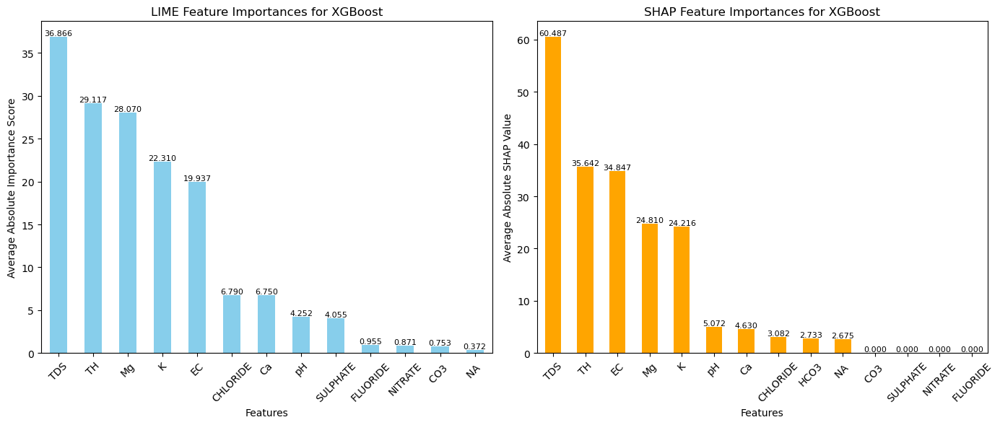

  0%|          | 0/47 [00:00<?, ?it/s]

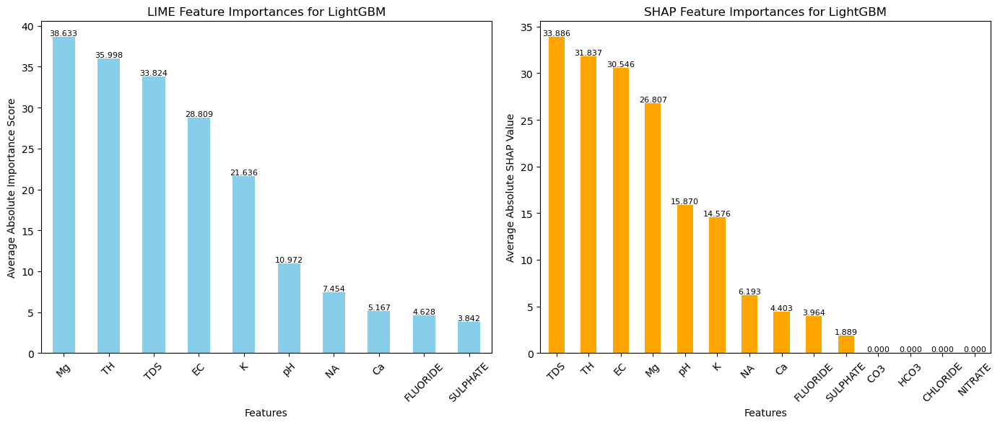

[GPBoost] [Warning] lambda_l2 is set with reg_lambda=0.0, will be overridden by lambda=1.0. Current value: lambda_l2=1.0


  0%|          | 0/47 [00:00<?, ?it/s]

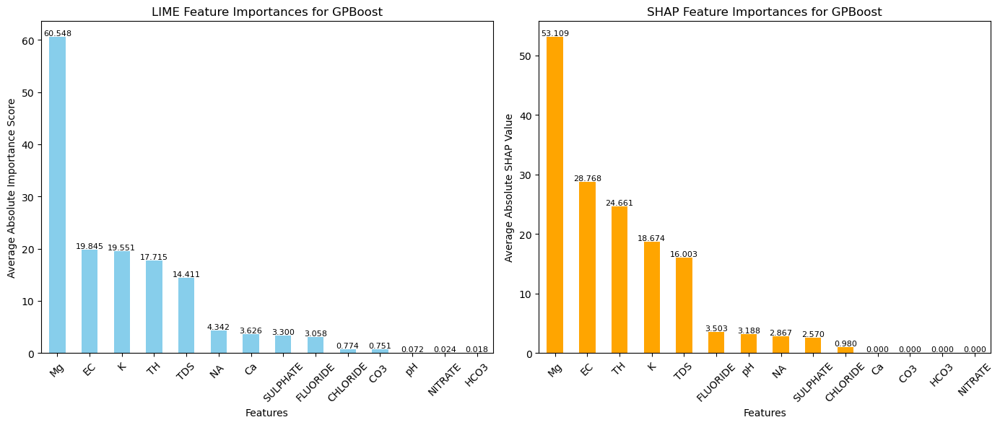

  0%|          | 0/47 [00:00<?, ?it/s]

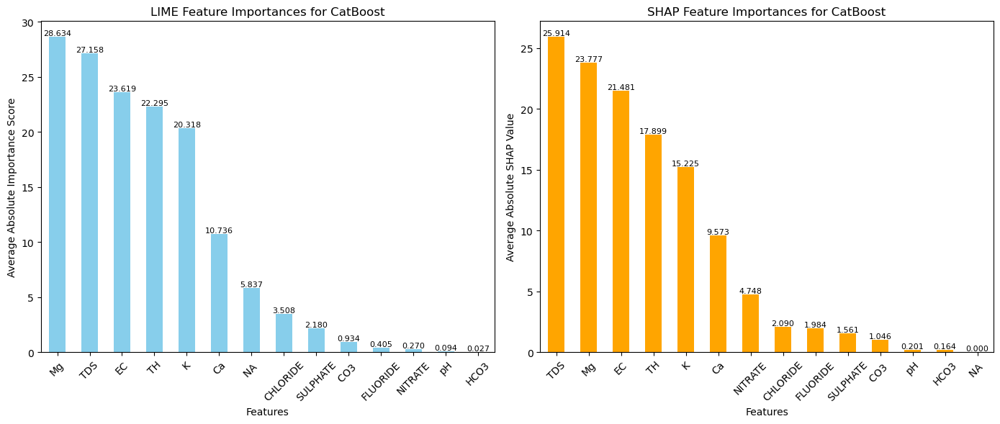

  0%|          | 0/47 [00:00<?, ?it/s]

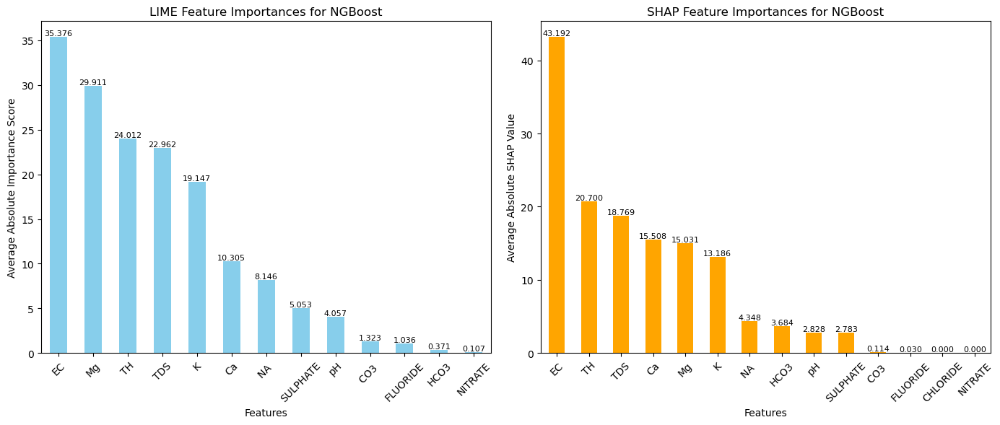

In [87]:
generate_interpretml_explanations_summary_pruners(best_scores_random_sampler, X_train, y_train, x_test, feature_names)

# **TPESampler using optuna**

In [ ]:
# Suppress Optuna's verbose output
optuna.logging.set_verbosity(optuna.logging.WARNING)

def hyperparameter_tuning_tpe(X_train, y_train, X_test, y_test):
    def objective(trial, model_name, model_class, param_space):
        # Suggest hyperparameters
        params = {key: trial.suggest_categorical(key, values) if isinstance(values, list) else trial.suggest_float(key, *values) for key, values in param_space.items()}

        # Create a new instance of the model
        model = model_class()
        model.set_params(**params)

        # Ensure the input arrays are writable
        X_train_copy = np.array(X_train, copy=True)
        y_train_copy = np.array(y_train, copy=True)
        X_test_copy = np.array(X_test, copy=True)
        y_test_copy = np.array(y_test, copy=True)

        # Train model
        model.fit(X_train_copy, y_train_copy)

        # Predict
        y_pred = model.predict(X_test_copy)

        # Calculate MSE
        mse = mean_squared_error(y_test_copy, y_pred)

        return mse

    models = {
        'Random Forest': (RandomForestRegressor, {
            'n_estimators': [100, 200, 500],
            'max_depth': [None, 5, 10, 15],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'max_features': ['sqrt', 'log2', None]
        }),
        'Gradient Boosting': (GradientBoostingRegressor, {
            'n_estimators': [100, 200, 500],
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 10],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'max_features': ['sqrt', 'log2']
        }),
        'XGBoost': (XGBRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'min_child_weight': [1, 3, 5],
            'gamma': [0, 0.1, 0.5, 1],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9]
        }),
        'LightGBM': (LGBMRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'num_leaves': [15, 31, 63],
            'min_child_samples': [1, 5, 10],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9],
            'verbose': [-1]
        }),
        'GPBoost': (GPBoostRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'num_leaves': [15, 31, 63],
            'min_child_samples': [1, 5, 10],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9],
            'alpha': [0.1, 0.5, 1.0],
            'lambda': [0.1, 0.5, 1.0],
            'verbose': [-1]
        }),
        'CatBoost': (CatBoostRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'iterations': [100, 200, 300, 500],
            'depth': [3, 5, 7],
            'l2_leaf_reg': [1, 3, 5],
            'border_count': [32, 64, 128],
            'verbose': [0]
        }),
        'NGBoost': (NGBRegressor, {
            'n_estimators': [100, 200],
            'learning_rate': [0.01, 0.1],
            'natural_gradient': [True, False],
            'minibatch_frac': [0.5, 0.7],
            'verbose': [0]
        })
    }

    pruners = [
        optuna.pruners.MedianPruner(),
        optuna.pruners.NopPruner(),
        optuna.pruners.PatientPruner(optuna.pruners.MedianPruner(), patience=3),
        optuna.pruners.PercentilePruner(25.0),
        optuna.pruners.SuccessiveHalvingPruner(),
        optuna.pruners.HyperbandPruner(),
        optuna.pruners.ThresholdPruner(lower=0.1),
        optuna.pruners.WilcoxonPruner()
    ]

    best_scores = {}
    for model_name, (model_class, param_space) in models.items():
        for pruner in pruners:
            pruner_name = pruner.__class__.__name__
            print(f"Running Optuna for {model_name} with {pruner_name}...")
            try:
                # Use the TPESampler and pruner in the study creation
                sampler = TPESampler()
                study = optuna.create_study(direction='minimize', sampler=sampler, pruner=pruner)
                study.optimize(lambda trial: objective(trial, model_name, model_class, param_space), n_trials=50)

                best_params = study.best_params
                best_model = model_class().set_params(**best_params)
                best_model.fit(X_train, y_train)
                y_pred = best_model.predict(X_test)

                # Calculate MSE
                mse = mean_squared_error(y_test, y_pred)

                # Calculate RMSE
                rmse = np.sqrt(mse)

                # Calculate correlation coefficient
                numerator = np.sum((y_test - np.mean(y_test)) * (y_pred - np.mean(y_pred)))
                denominator = np.sqrt(np.sum((y_test - np.mean(y_test))**2) * np.sum((y_pred - np.mean(y_pred))**2))
                corr_coef = numerator / denominator if denominator != 0 else 0.0

                best_scores[(model_name, pruner_name)] = {
                    'best_score': mse,
                    'best_params': best_params,
                    'test_mse': mse,
                    'test_rmse': rmse,
                    'test_corr_coef': corr_coef,
                    'pruner': pruner_name
                }
                print(f"Best MSE for {model_name} with {pruner_name}: {mse} with params: {best_params}")
                print(f"Best RMSE for {model_name} with {pruner_name}: {rmse}")
                print(f"Correlation Coefficient for {model_name} with {pruner_name}: {corr_coef}")
            except Exception as e:
                print(f"Failed to run Optuna for {model_name} with {pruner_name}. Error: {e}")

    # Find the model with the best test score
    if best_scores:
        best_model_name, best_pruner_name = min(best_scores, key=lambda k: best_scores[k]['test_mse'])
        best_model_info = best_scores[(best_model_name, best_pruner_name)]
        print(f"\nBest model on test data: {best_model_name} with {best_pruner_name}")
        print(f"Test MSE: {best_model_info['test_mse']}")
        print(f"Test RMSE: {best_model_info['test_rmse']}")
        print(f"Correlation Coefficient: {best_model_info['test_corr_coef']}")
        print(f"Best Parameters: {best_model_info['best_params']}")
        print(f"Pruner Used: {best_model_info['pruner']}")
    else:
        print("No valid model configurations found.")

    return best_scores


best_scores_tpe_sampler = hyperparameter_tuning_tpe(X_train, y_train, X_test, y_test)

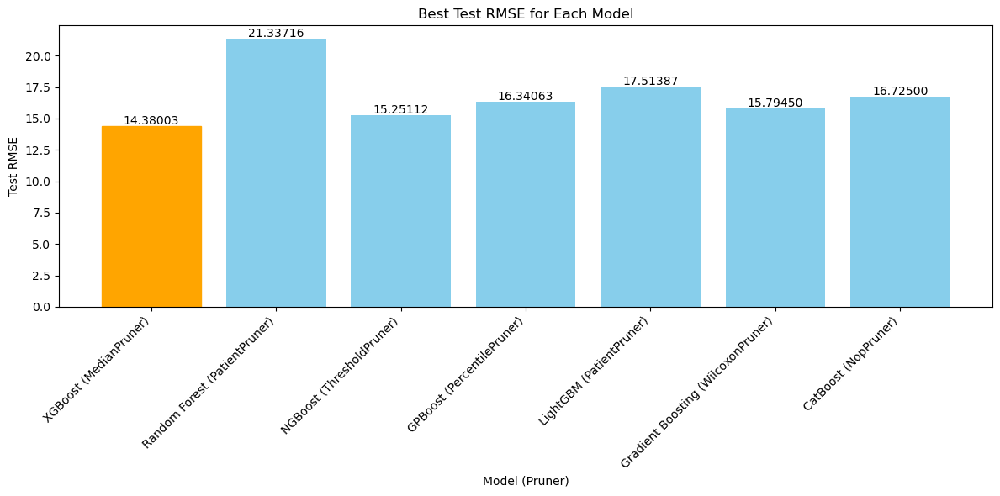

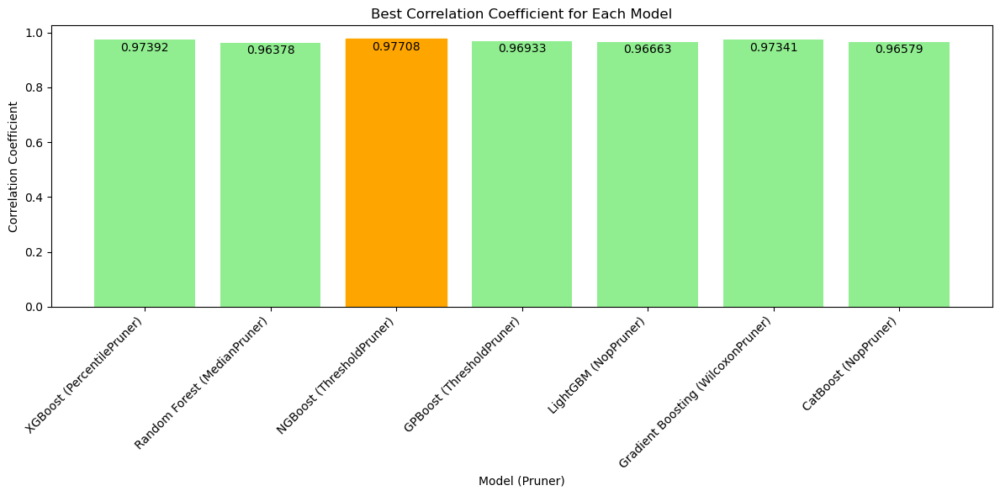

In [92]:
plot_best_scores(best_scores_tpe_sampler)

  0%|          | 0/47 [00:00<?, ?it/s]

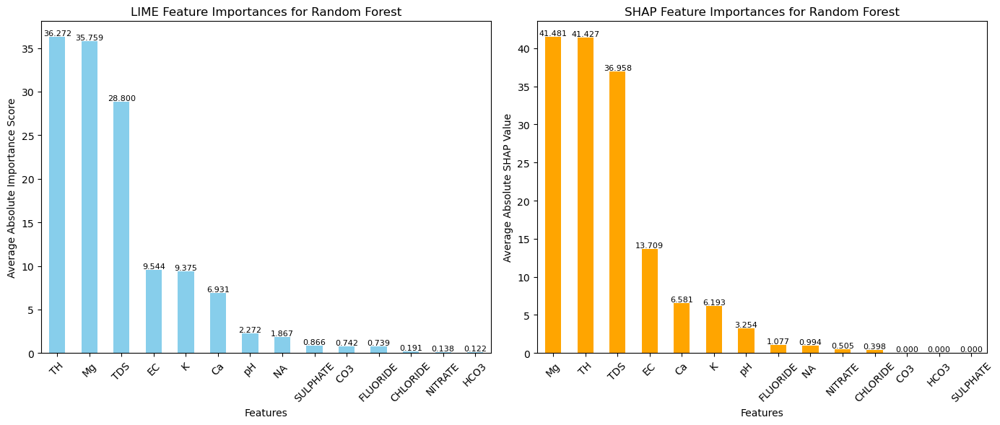

  0%|          | 0/47 [00:00<?, ?it/s]

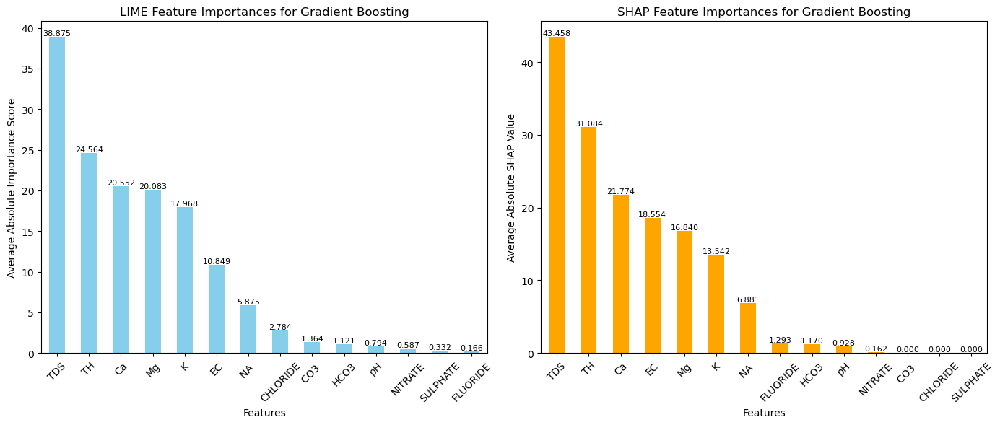

  0%|          | 0/47 [00:00<?, ?it/s]

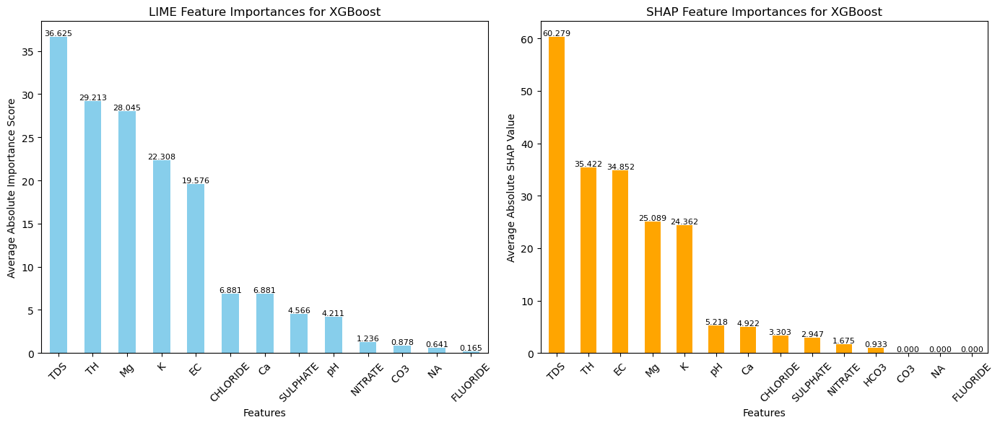

  0%|          | 0/47 [00:00<?, ?it/s]

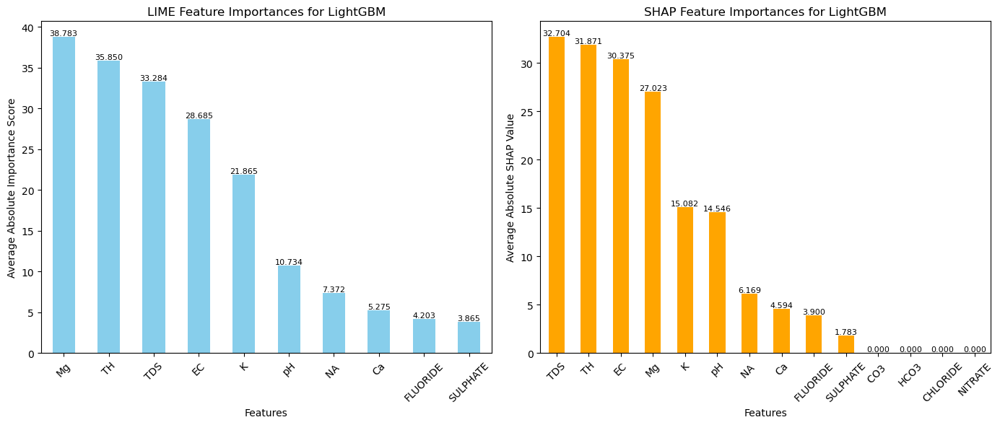

[GPBoost] [Warning] lambda_l2 is set with reg_lambda=0.0, will be overridden by lambda=1.0. Current value: lambda_l2=1.0


  0%|          | 0/47 [00:00<?, ?it/s]

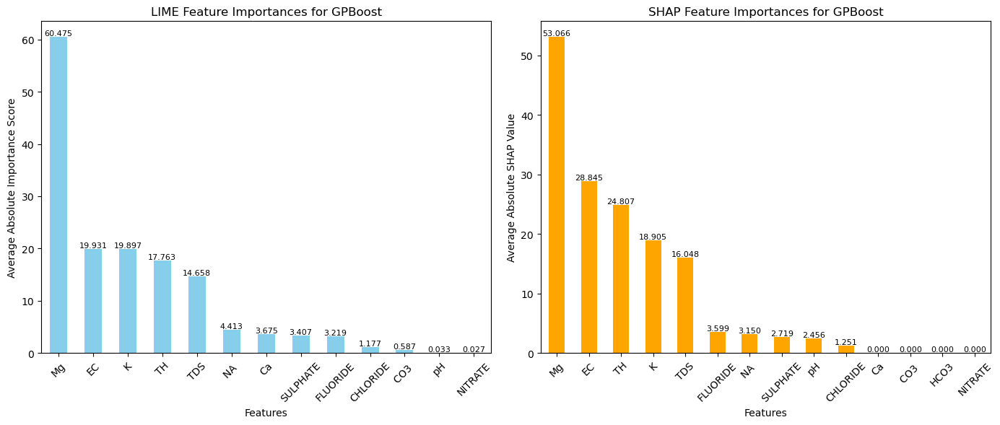

  0%|          | 0/47 [00:00<?, ?it/s]

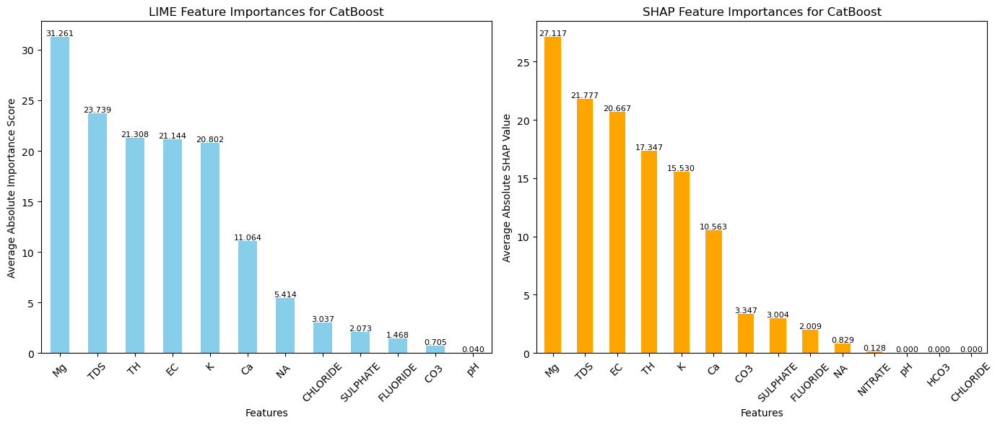

  0%|          | 0/47 [00:00<?, ?it/s]

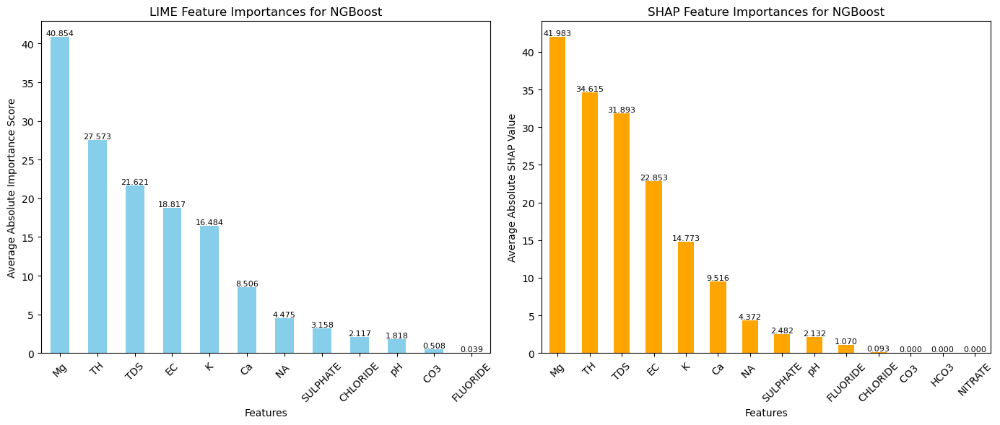

In [96]:
generate_interpretml_explanations_summary_pruners(best_scores_tpe_sampler, X_train, y_train, x_test, feature_names)

# **CmaEsSampler using optuna**

In [ ]:
# Suppress Optuna's verbose output
optuna.logging.set_verbosity(optuna.logging.WARNING)

def hyperparameter_tuning_cmaes(X_train, y_train, X_test, y_test):
    def objective(trial, model_name, model_class, param_space):
        # Suggest hyperparameters
        params = {}
        for key, values in param_space.items():
            if isinstance(values, list):
                params[key] = trial.suggest_categorical(key, values)
            elif isinstance(values, tuple) and all(isinstance(v, int) for v in values):
                params[key] = trial.suggest_int(key, *values)
            else:
                params[key] = trial.suggest_float(key, *values)

        # Create and train the model
        model = model_class().set_params(**params)
        model.fit(X_train, y_train)

        # Predict and calculate MSE
        y_pred = model.predict(X_test)
        mse = mean_squared_error(y_test, y_pred)
        return mse

    models = {
        'Random Forest': (RandomForestRegressor, {
            'n_estimators': [100, 200, 500],
            'max_depth': [None, 5, 10, 15],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'max_features': ['sqrt', 'log2', None]
        }),
        'Gradient Boosting': (GradientBoostingRegressor, {
            'n_estimators': [100, 200, 500],
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 10],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'max_features': ['sqrt', 'log2']
        }),
        'XGBoost': (XGBRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': (3, 7),
            'n_estimators': [100, 200, 300, 500],
            'min_child_weight': [1, 3, 5],
            'gamma': [0, 0.1, 0.5, 1],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9]
        }),
        'LightGBM': (LGBMRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': (3, 7),
            'n_estimators': [100, 200, 300, 500],
            'num_leaves': [15, 31, 63],
            'min_child_samples': [1, 5, 10],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9],
            'verbose': [-1]
        }),
        'GPBoost': (GPBoostRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'num_leaves': [15, 31, 63],
            'min_child_samples': [1, 5, 10],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9],
            'alpha': [0.1, 0.5, 1.0],
            'lambda': [0.1, 0.5, 1.0],
            'verbose': [-1]
        }),
        'CatBoost': (CatBoostRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'iterations': [100, 200, 300, 500],
            'depth': (3, 7),
            'l2_leaf_reg': [1, 3, 5],
            'border_count': [32, 64, 128],
            'verbose': [0]
        }),
        'NGBoost': (NGBRegressor, {
            'n_estimators': [100, 200],
            'learning_rate': [0.01, 0.1],
            'natural_gradient': [True, False],
            'minibatch_frac': [0.5, 0.7],
            'verbose': [0]
        })
    }

    pruners = [
        optuna.pruners.MedianPruner(),
        optuna.pruners.NopPruner(),
        optuna.pruners.PatientPruner(optuna.pruners.MedianPruner(), patience=3),
        optuna.pruners.PercentilePruner(25.0),
        optuna.pruners.SuccessiveHalvingPruner(),
        optuna.pruners.HyperbandPruner(),
        optuna.pruners.ThresholdPruner(lower=0.1),
        optuna.pruners.WilcoxonPruner()
    ]

    best_scores = {}
    for model_name, (model_class, param_space) in models.items():
        for pruner in pruners:
            pruner_name = pruner.__class__.__name__
            print(f"Running Optuna for {model_name} with {pruner_name}...")
            try:
                # Set warn_independent_sampling to False to suppress warnings
                sampler = CmaEsSampler(warn_independent_sampling=False)
                study = optuna.create_study(direction='minimize', sampler=sampler, pruner=pruner)
                study.optimize(lambda trial: objective(trial, model_name, model_class, param_space), n_trials=50)

                best_params = study.best_params
                best_model = model_class().set_params(**best_params)
                best_model.fit(X_train, y_train)
                y_pred = best_model.predict(X_test)

                mse = mean_squared_error(y_test, y_pred)
                rmse = np.sqrt(mse)
                corr_coef = np.corrcoef(y_test, y_pred)[0, 1]

                best_scores[(model_name, pruner_name)] = {
                    'best_score': mse,
                    'best_params': best_params,
                    'test_mse': mse,
                    'test_rmse': rmse,
                    'test_corr_coef': corr_coef,
                    'pruner': pruner_name
                }
                print(f"Best MSE for {model_name} with {pruner_name}: {mse}")
                print(f"Best RMSE for {model_name} with {pruner_name}: {rmse}")
                print(f"Correlation Coefficient for {model_name} with {pruner_name}: {corr_coef}")
            except Exception as e:
                print(f"Failed to run Optuna for {model_name} with {pruner_name}. Error: {e}")

    if best_scores:
        best_model_name, best_pruner_name = min(best_scores, key=lambda k: best_scores[k]['test_mse'])
        best_model_info = best_scores[(best_model_name, best_pruner_name)]
        print(f"\nBest model on test data: {best_model_name} with {best_pruner_name}")
        print(f"Test MSE: {best_model_info['test_mse']}")
        print(f"Test RMSE: {best_model_info['test_rmse']}")
        print(f"Correlation Coefficient: {best_model_info['test_corr_coef']}")
        print(f"Best Parameters: {best_model_info['best_params']}")
        print(f"Pruner Used: {best_model_info['pruner']}")
    else:
        print("No valid model configurations found.")

    return best_scores

best_scores_cmaes_sampler = hyperparameter_tuning_cmaes(X_train, y_train, X_test, y_test)

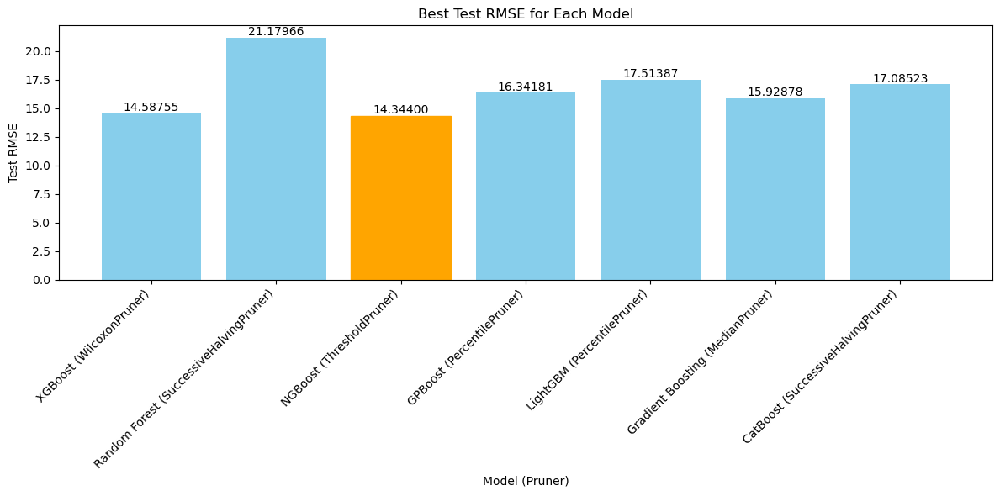

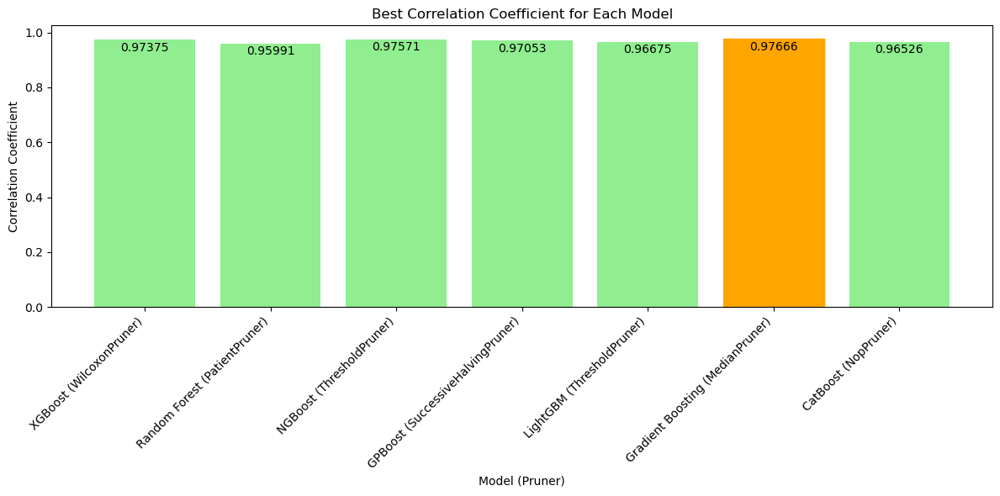

In [100]:
plot_best_scores(best_scores_cmaes_sampler)

  0%|          | 0/47 [00:00<?, ?it/s]

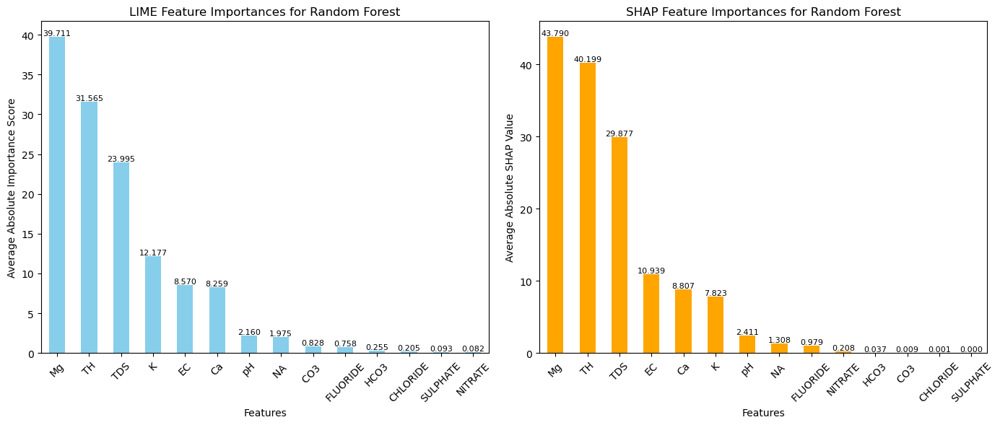

  0%|          | 0/47 [00:00<?, ?it/s]

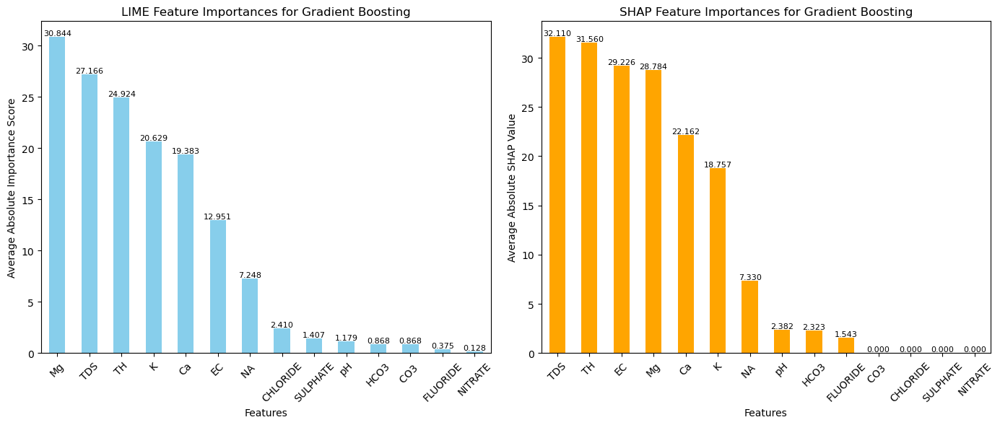

  0%|          | 0/47 [00:00<?, ?it/s]

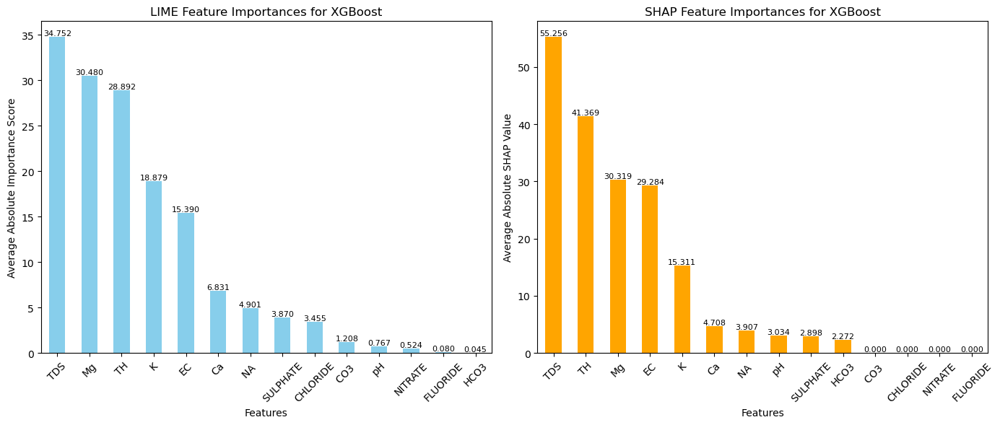

  0%|          | 0/47 [00:00<?, ?it/s]

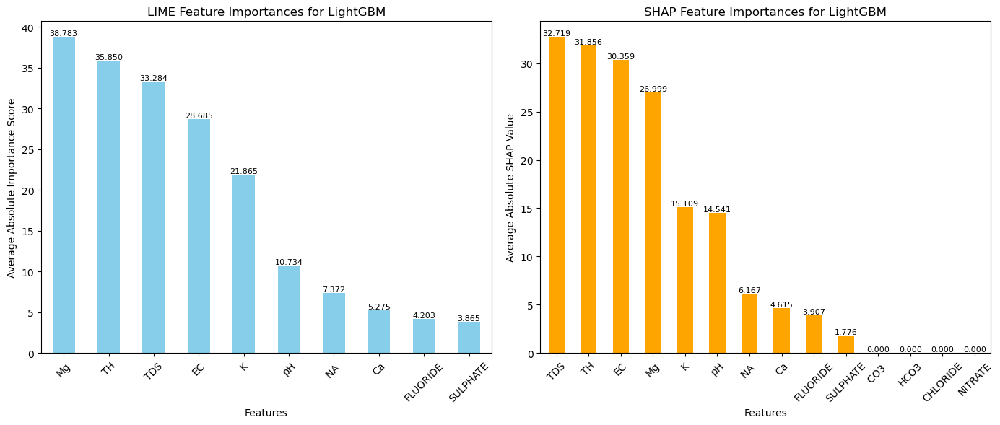

[GPBoost] [Warning] lambda_l2 is set with reg_lambda=0.0, will be overridden by lambda=1.0. Current value: lambda_l2=1.0


  0%|          | 0/47 [00:00<?, ?it/s]

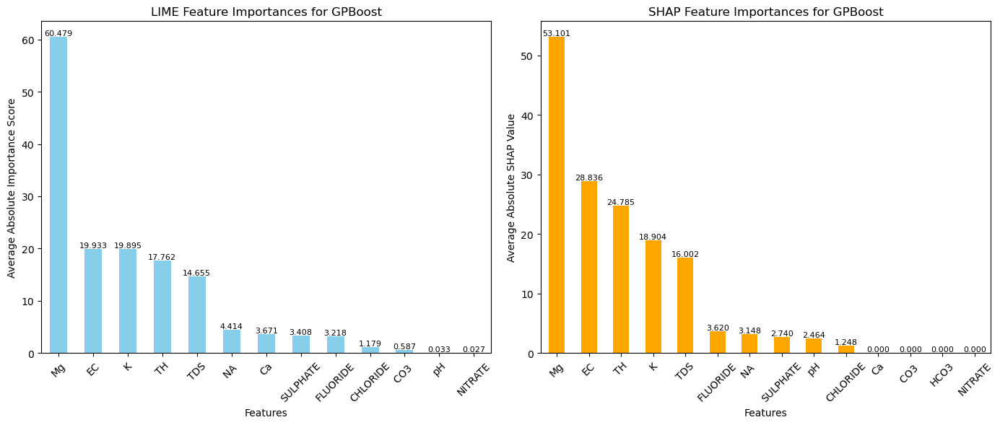

  0%|          | 0/47 [00:00<?, ?it/s]

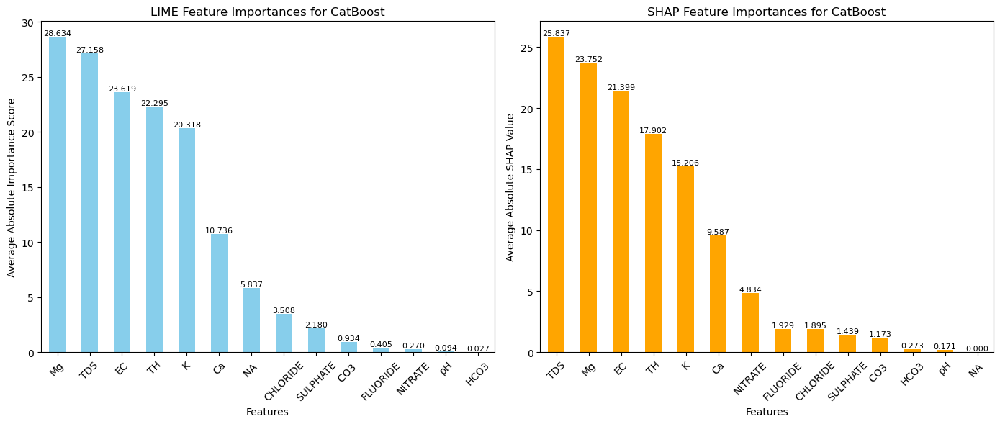

  0%|          | 0/47 [00:00<?, ?it/s]

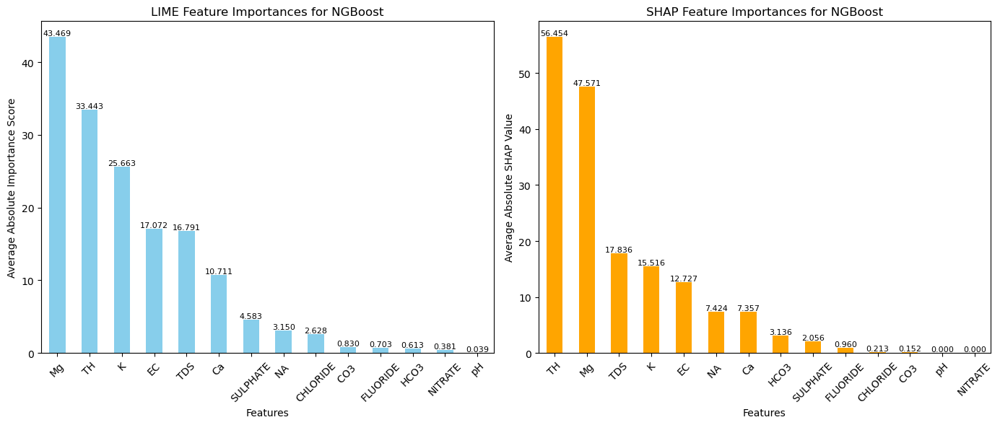

In [101]:
generate_interpretml_explanations_summary_pruners(best_scores_cmaes_sampler, X_train, y_train, x_test, feature_names)

# **GPSampler using optuna**

In [ ]:
# Suppress Optuna's verbose output
optuna.logging.set_verbosity(optuna.logging.WARNING)

def hyperparameter_tuning_gp(X_train, y_train, X_test, y_test):
    def objective(trial, model_name, model_class, param_space):
        # Suggest hyperparameters
        params = {}
        for key, values in param_space.items():
            if isinstance(values, list):
                # Use suggest_categorical for categorical choices
                params[key] = trial.suggest_categorical(key, values)
            elif isinstance(values, tuple) and all(isinstance(v, int) for v in values):
                # Use suggest_int for integer ranges
                params[key] = trial.suggest_int(key, *values)
            else:
                # Use suggest_float for float ranges
                params[key] = trial.suggest_float(key, *values)

        # Create a new instance of the model
        model = model_class()
        model.set_params(**params)

        # Ensure the input arrays are writable
        X_train_copy = np.array(X_train, copy=True)
        y_train_copy = np.array(y_train, copy=True)
        X_test_copy = np.array(X_test, copy=True)
        y_test_copy = np.array(y_test, copy=True)

        # Train model
        model.fit(X_train_copy, y_train_copy)

        # Predict
        y_pred = model.predict(X_test_copy)

        # Calculate MSE
        mse = mean_squared_error(y_test_copy, y_pred)

        return mse

    models = {
        'Random Forest': (RandomForestRegressor, {
            'n_estimators': (100, 500),
            'max_depth': (3, 15),
            'min_samples_split': (2, 10),
            'min_samples_leaf': (1, 4),
            'max_features': ['sqrt', 'log2', None]
        }),
        'Gradient Boosting': (GradientBoostingRegressor, {
            'n_estimators': (100, 500),
            'learning_rate': (0.01, 0.1),
            'max_depth': (3, 10),
            'min_samples_split': (2, 10),
            'min_samples_leaf': (1, 4),
            'max_features': ['sqrt', 'log2']
        }),
        'XGBoost': (XGBRegressor, {
            'learning_rate': (0.01, 0.1),
            'max_depth': (3, 7),
            'n_estimators': (100, 500),
            'min_child_weight': (1, 5),
            'gamma': (0, 1),
            'subsample': (0.5, 0.9),
            'colsample_bytree': (0.5, 0.9)
        }),
        'LightGBM': (LGBMRegressor, {
            'learning_rate': (0.01, 0.1),
            'max_depth': (3, 7),
            'n_estimators': (100, 500),
            'num_leaves': (15, 63),
            'min_child_samples': (1, 10),
            'subsample': (0.5, 0.9),
            'colsample_bytree': (0.5, 0.9),
            'verbose': [-1]
        }),
        'GPBoost': (GPBoostRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'num_leaves': [15, 31, 63],
            'min_child_samples': [1, 5, 10],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9],
            'alpha': [0.1, 0.5, 1.0],
            'lambda': [0.1, 0.5, 1.0],
            'verbose': [-1]
        }),
        'CatBoost': (CatBoostRegressor, {
            'learning_rate': (0.01, 0.1),
            'iterations': (100, 500),
            'depth': (3, 7),
            'l2_leaf_reg': (1, 5),
            'border_count': (32, 128),
            'verbose': [0]
        }),
        'NGBoost': (NGBRegressor, {
            'n_estimators': (100, 200),
            'learning_rate': (0.01, 0.1),
            'natural_gradient': [True, False],
            'minibatch_frac': (0.5, 0.7),
            'verbose': [0]
        })
    }

    pruners = [
        optuna.pruners.MedianPruner(),
        optuna.pruners.NopPruner(),
        optuna.pruners.PatientPruner(optuna.pruners.MedianPruner(), patience=3),
        optuna.pruners.PercentilePruner(25.0),
        optuna.pruners.SuccessiveHalvingPruner(),
        optuna.pruners.HyperbandPruner(),
        optuna.pruners.ThresholdPruner(lower=0.1),
        optuna.pruners.WilcoxonPruner()
    ]

    best_scores = {}
    for model_name, (model_class, param_space) in models.items():
        for pruner in pruners:
            pruner_name = pruner.__class__.__name__
            print(f"Running Optuna for {model_name} with {pruner_name}...")
            try:
                # Use the GPSampler and pruner in the study creation
                sampler = GPSampler()
                study = optuna.create_study(direction='minimize', sampler=sampler, pruner=pruner)
                study.optimize(lambda trial: objective(trial, model_name, model_class, param_space), n_trials=50)

                best_params = study.best_params
                best_model = model_class().set_params(**best_params)
                best_model.fit(X_train, y_train)
                y_pred = best_model.predict(X_test)

                # Calculate MSE
                mse = mean_squared_error(y_test, y_pred)

                # Calculate RMSE
                rmse = np.sqrt(mse)

                # Calculate correlation coefficient
                numerator = np.sum((y_test - np.mean(y_test)) * (y_pred - np.mean(y_pred)))
                denominator = np.sqrt(np.sum((y_test - np.mean(y_test))**2) * np.sum((y_pred - np.mean(y_pred))**2))
                corr_coef = numerator / denominator if denominator != 0 else 0.0

                best_scores[(model_name, pruner_name)] = {
                    'best_score': mse,
                    'best_params': best_params,
                    'test_mse': mse,
                    'test_rmse': rmse,
                    'test_corr_coef': corr_coef,
                    'pruner': pruner_name
                }
                print(f"Best MSE for {model_name} with {pruner_name}: {mse} with params: {best_params}")
                print(f"Best RMSE for {model_name} with {pruner_name}: {rmse}")
                print(f"Correlation Coefficient for {model_name} with {pruner_name}: {corr_coef}")
            except Exception as e:
                print(f"Failed to run Optuna for {model_name} with {pruner_name}. Error: {e}")

    # Find the model with the best test score
    if best_scores:
        best_model_name, best_pruner_name = min(best_scores, key=lambda k: best_scores[k]['test_mse'])
        best_model_info = best_scores[(best_model_name, best_pruner_name)]
        print(f"\nBest model on test data: {best_model_name} with {best_pruner_name}")
        print(f"Test MSE: {best_model_info['test_mse']}")
        print(f"Test RMSE: {best_model_info['test_rmse']}")
        print(f"Correlation Coefficient: {best_model_info['test_corr_coef']}")
        print(f"Best Parameters: {best_model_info['best_params']}")
        print(f"Pruner Used: {best_model_info['pruner']}")
    else:
        print("No valid model configurations found.")

    return best_scores

best_scores_gp_sampler = hyperparameter_tuning_gp(X_train, y_train, X_test, y_test)

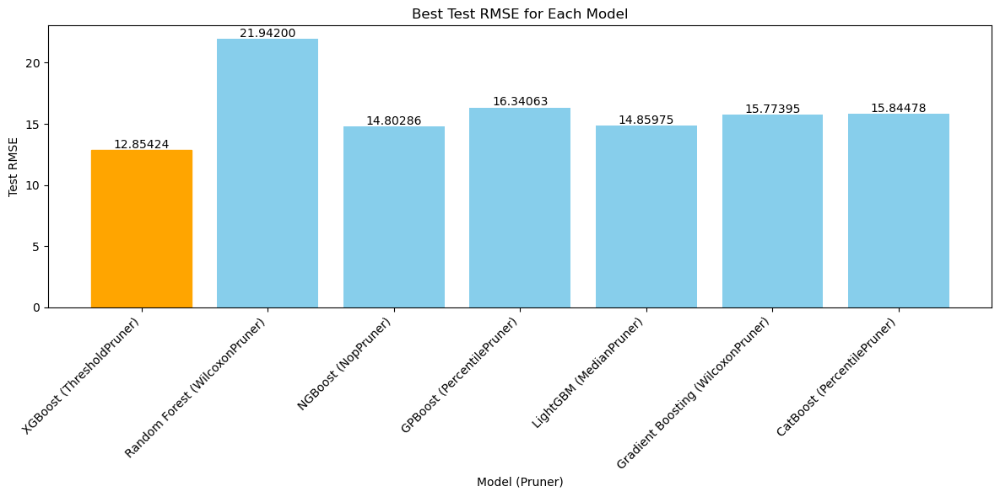

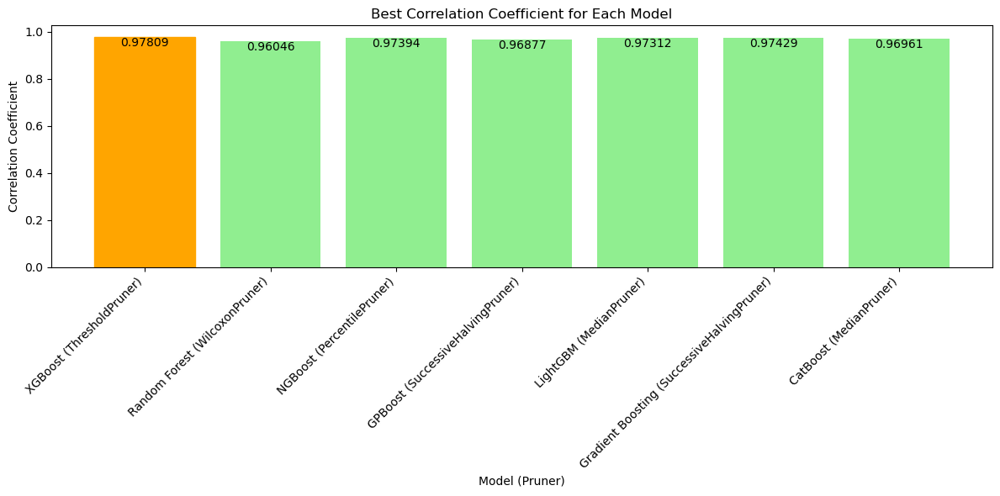

In [103]:
plot_best_scores(best_scores_gp_sampler)

  0%|          | 0/47 [00:00<?, ?it/s]

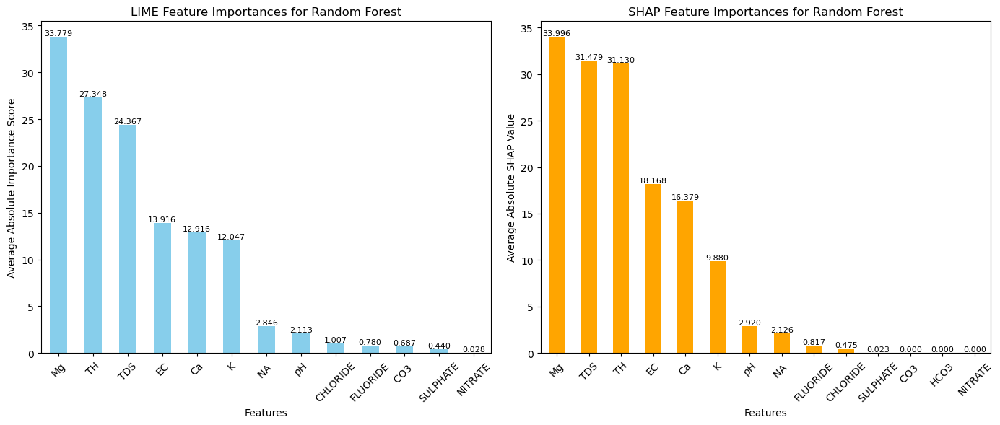

  0%|          | 0/47 [00:00<?, ?it/s]

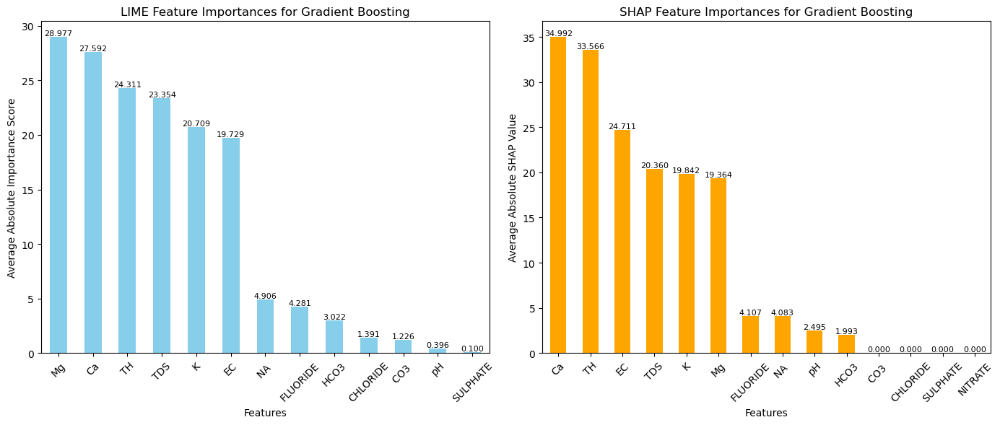

  0%|          | 0/47 [00:00<?, ?it/s]

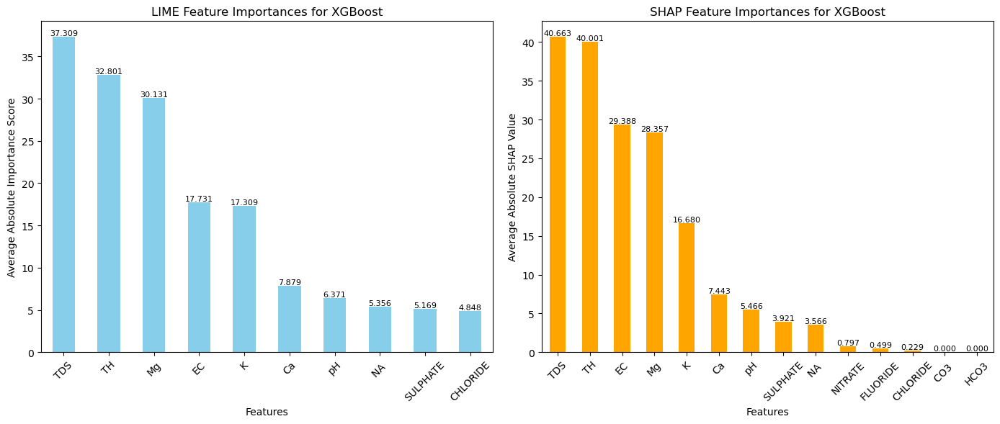

  0%|          | 0/47 [00:00<?, ?it/s]

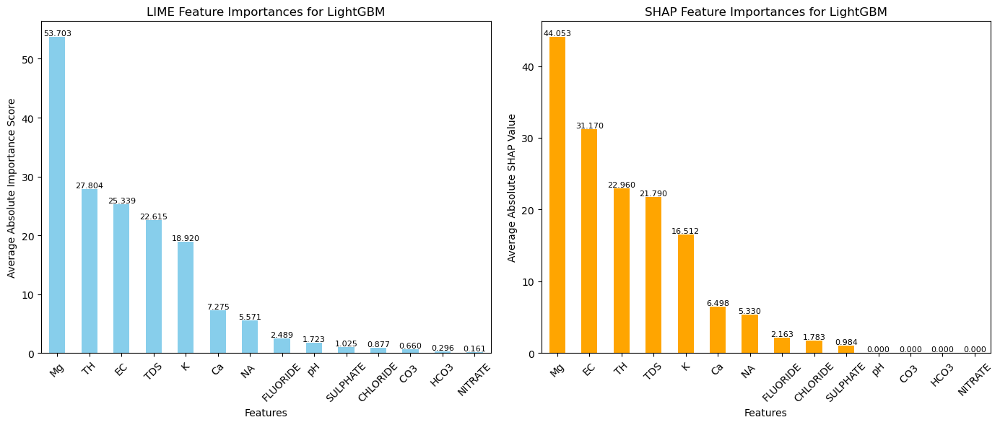

[GPBoost] [Warning] lambda_l2 is set with reg_lambda=0.0, will be overridden by lambda=1.0. Current value: lambda_l2=1.0


  0%|          | 0/47 [00:00<?, ?it/s]

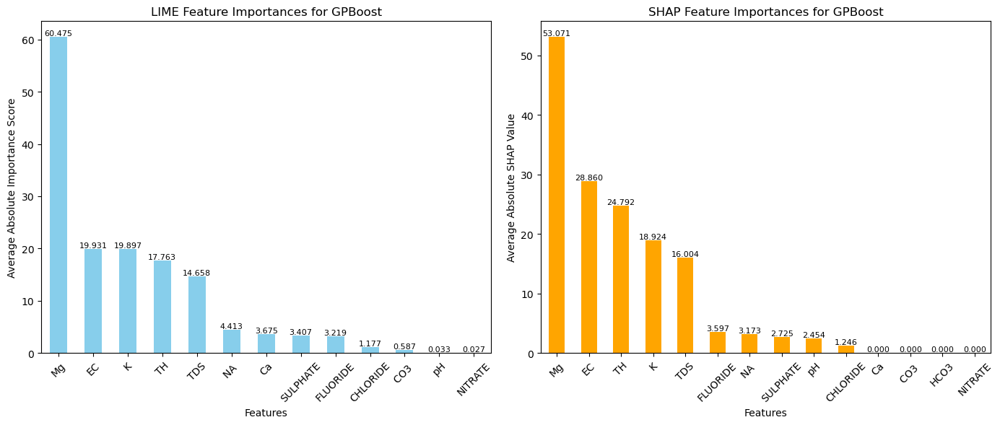

  0%|          | 0/47 [00:00<?, ?it/s]

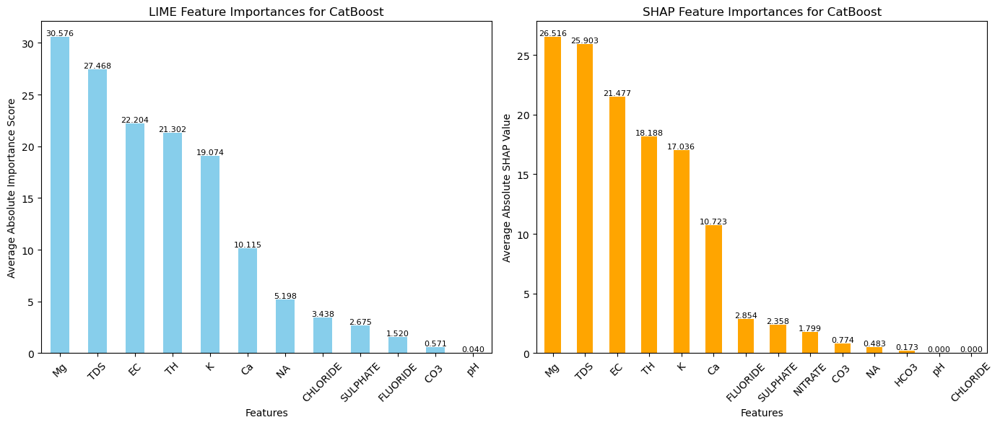

  0%|          | 0/47 [00:00<?, ?it/s]

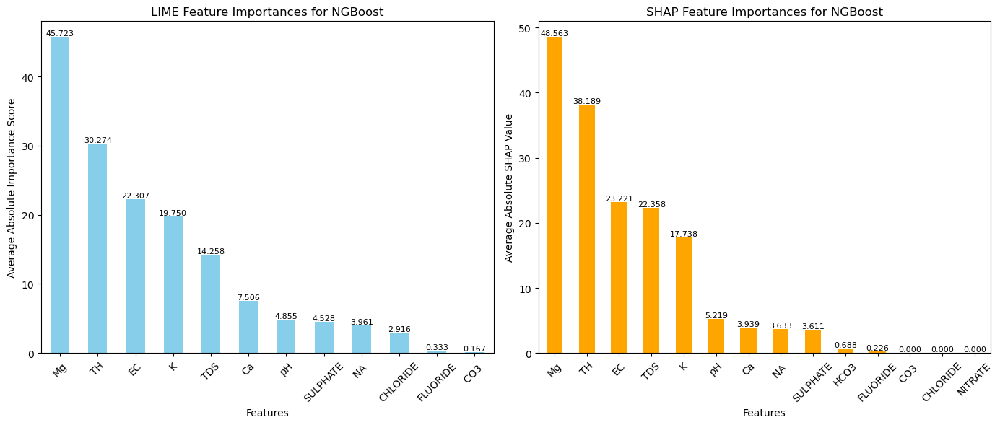

In [104]:
generate_interpretml_explanations_summary_pruners(best_scores_gp_sampler, X_train, y_train, x_test, feature_names)

# **PartialFixedSampler using optuna**

In [ ]:
# Suppress Optuna's verbose output
optuna.logging.set_verbosity(optuna.logging.WARNING)

def hyperparameter_tuning_partial(X_train, y_train, X_test, y_test):
    def objective(trial, model_name, model_class, param_space, fixed_params):
        # Suggest hyperparameters
        params = {}
        for key, values in param_space.items():
            if key in fixed_params:
                params[key] = fixed_params[key]
            else:
                if isinstance(values, list):
                    params[key] = trial.suggest_categorical(key, values)
                else:
                    params[key] = trial.suggest_float(key, *values)

        # Create a new instance of the model
        model = model_class()
        model.set_params(**params)

        # Ensure the input arrays are writable
        X_train_copy = np.array(X_train, copy=True)
        y_train_copy = np.array(y_train, copy=True)
        X_test_copy = np.array(X_test, copy=True)
        y_test_copy = np.array(y_test, copy=True)

        # Train model
        model.fit(X_train_copy, y_train_copy)

        # Predict
        y_pred = model.predict(X_test_copy)

        # Calculate MSE
        mse = mean_squared_error(y_test_copy, y_pred)

        return mse

    models = {
        'Random Forest': (RandomForestRegressor, {
            'n_estimators': [100, 200, 500],
            'max_depth': [None, 5, 10, 15],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'max_features': ['sqrt', 'log2', None]
        }),
        'Gradient Boosting': (GradientBoostingRegressor, {
            'n_estimators': [100, 200, 500],
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 10],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'max_features': ['sqrt', 'log2']
        }),
        'XGBoost': (XGBRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'min_child_weight': [1, 3, 5],
            'gamma': [0, 0.1, 0.5, 1],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9]
        }),
        'LightGBM': (LGBMRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'num_leaves': [15, 31, 63],
            'min_child_samples': [1, 5, 10],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9],
            'verbose': [-1]
        }),
        'GPBoost': (GPBoostRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'num_leaves': [15, 31, 63],
            'min_child_samples': [1, 5, 10],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9],
            'alpha': [0.1, 0.5, 1.0],
            'lambda': [0.1, 0.5, 1.0],
            'verbose': [-1]
        }),
        'CatBoost': (CatBoostRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'iterations': [100, 200, 300, 500],
            'depth': [3, 5, 7],
            'l2_leaf_reg': [1, 3, 5],
            'border_count': [32, 64, 128],
            'verbose': [0]
        }),
        'NGBoost': (NGBRegressor, {
            'n_estimators': [100, 200],
            'learning_rate': [0.01, 0.1],
            'natural_gradient': [True, False],
            'minibatch_frac': [0.5, 0.7],
            'verbose': [0]
        })
    }

    pruners = [
        optuna.pruners.MedianPruner(),
        optuna.pruners.NopPruner(),
        optuna.pruners.PatientPruner(optuna.pruners.MedianPruner(), patience=3),
        optuna.pruners.PercentilePruner(25.0),
        optuna.pruners.SuccessiveHalvingPruner(),
        optuna.pruners.HyperbandPruner(),
        optuna.pruners.ThresholdPruner(lower=0.1),
        optuna.pruners.WilcoxonPruner()
    ]

    # Define fixed parameters
    fixed_params = {
        'n_estimators': 200,  # Example of a fixed parameter
        # Add more fixed parameters as needed
    }

    best_scores = {}
    for model_name, (model_class, param_space) in models.items():
        for pruner in pruners:
            pruner_name = pruner.__class__.__name__
            print(f"Running Optuna for {model_name} with {pruner_name}...")
            try:
                # Use the PartialFixedSampler and pruner in the study creation
                sampler = PartialFixedSampler(fixed_params=fixed_params, base_sampler=TPESampler())
                study = optuna.create_study(direction='minimize', sampler=sampler, pruner=pruner)
                study.optimize(lambda trial: objective(trial, model_name, model_class, param_space, fixed_params), n_trials=50)

                best_params = study.best_params
                best_model = model_class().set_params(**best_params)
                best_model.fit(X_train, y_train)
                y_pred = best_model.predict(X_test)

                # Calculate MSE
                mse = mean_squared_error(y_test, y_pred)

                # Calculate RMSE
                rmse = np.sqrt(mse)

                # Calculate correlation coefficient
                numerator = np.sum((y_test - np.mean(y_test)) * (y_pred - np.mean(y_pred)))
                denominator = np.sqrt(np.sum((y_test - np.mean(y_test))**2) * np.sum((y_pred - np.mean(y_pred))**2))
                corr_coef = numerator / denominator if denominator != 0 else 0.0

                best_scores[(model_name, pruner_name)] = {
                    'best_score': mse,
                    'best_params': best_params,
                    'test_mse': mse,
                    'test_rmse': rmse,
                    'test_corr_coef': corr_coef,
                    'pruner': pruner_name
                }
                print(f"Best MSE for {model_name} with {pruner_name}: {mse} with params: {best_params}")
                print(f"Best RMSE for {model_name} with {pruner_name}: {rmse}")
                print(f"Correlation Coefficient for {model_name} with {pruner_name}: {corr_coef}")
            except Exception as e:
                print(f"Failed to run Optuna for {model_name} with {pruner_name}. Error: {e}")

    # Find the model with the best test score
    if best_scores:
        best_model_name, best_pruner_name = min(best_scores, key=lambda k: best_scores[k]['test_mse'])
        best_model_info = best_scores[(best_model_name, best_pruner_name)]
        print(f"\nBest model on test data: {best_model_name} with {best_pruner_name}")
        print(f"Test MSE: {best_model_info['test_mse']}")
        print(f"Test RMSE: {best_model_info['test_rmse']}")
        print(f"Correlation Coefficient: {best_model_info['test_corr_coef']}")
        print(f"Best Parameters: {best_model_info['best_params']}")
        print(f"Pruner Used: {best_model_info['pruner']}")
    else:
        print("No valid model configurations found.")

    return best_scores

best_scores_partial_fixed_sampler = hyperparameter_tuning_partial(X_train, y_train, X_test, y_test)

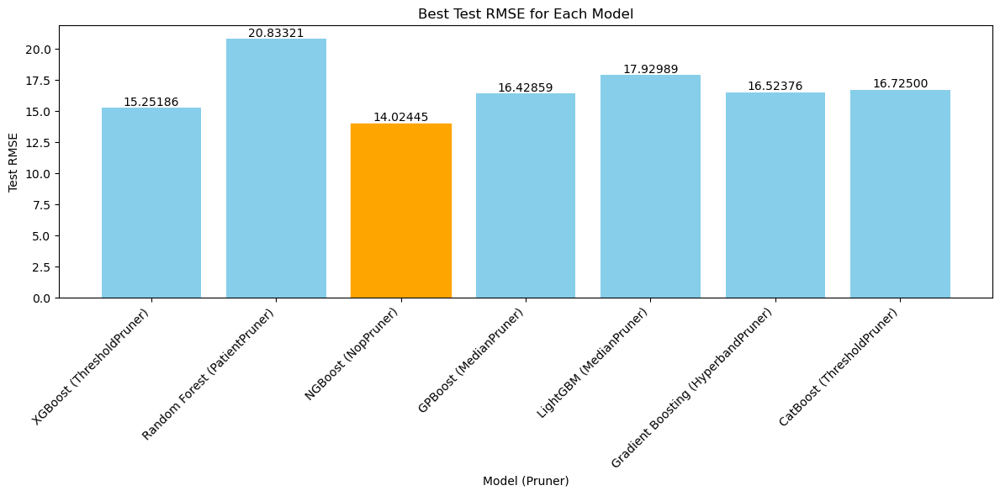

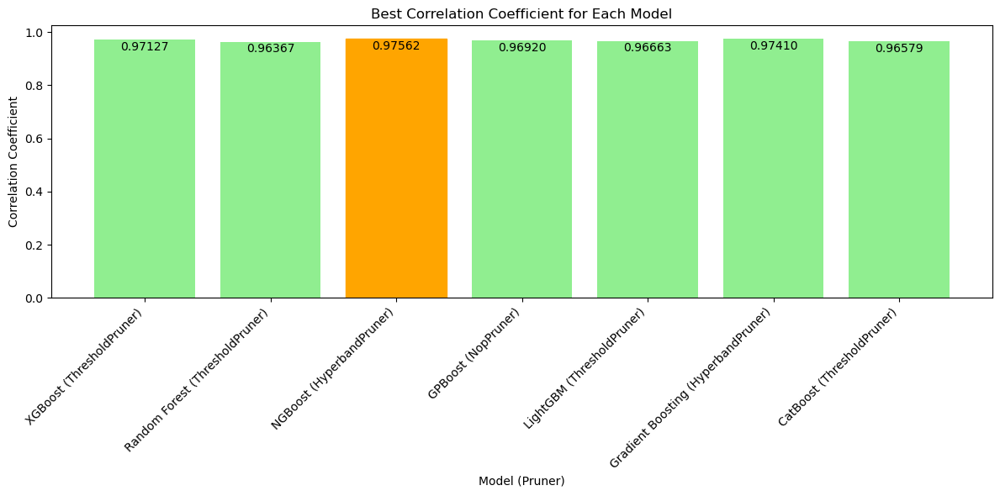

In [129]:
plot_best_scores(best_scores_partial_fixed_sampler)

  0%|          | 0/47 [00:00<?, ?it/s]

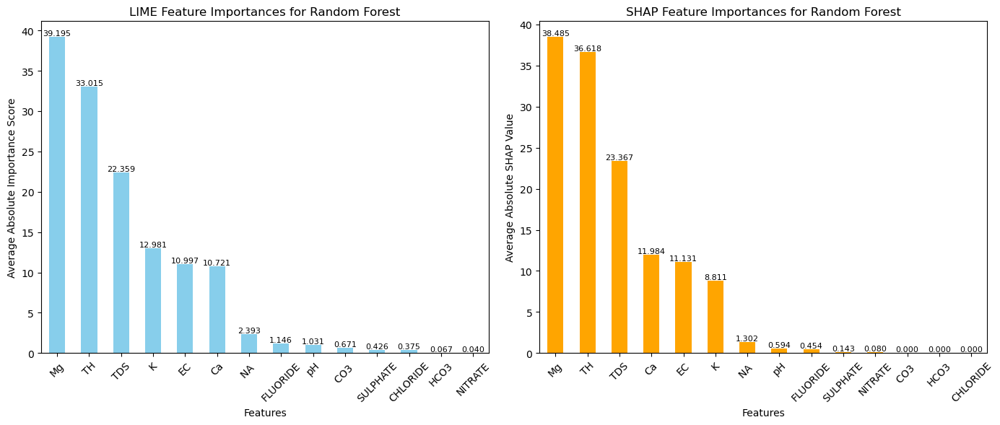

  0%|          | 0/47 [00:00<?, ?it/s]

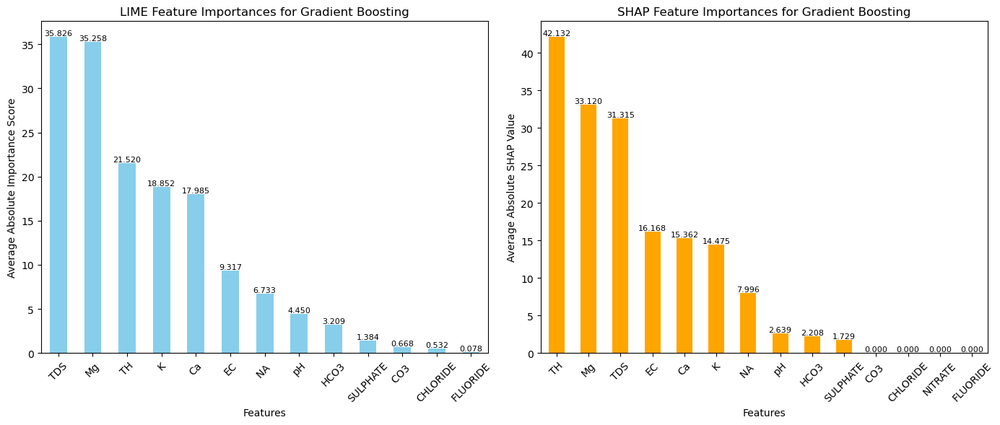

  0%|          | 0/47 [00:00<?, ?it/s]

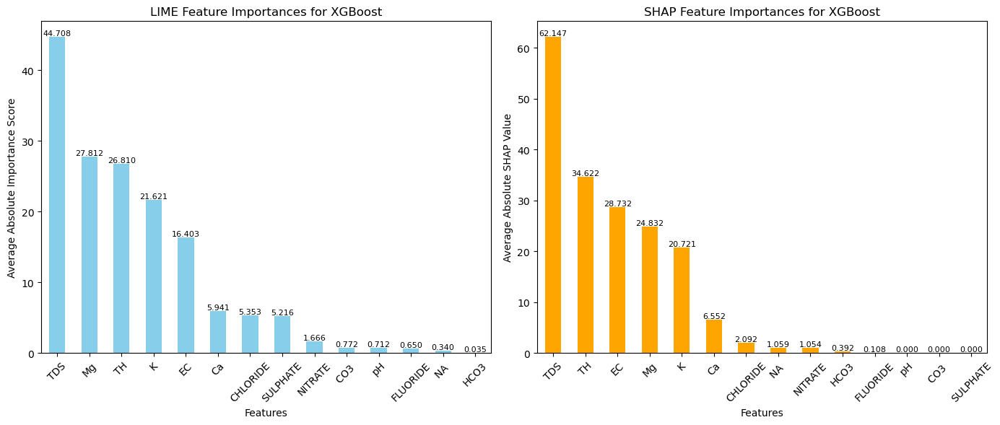

  0%|          | 0/47 [00:00<?, ?it/s]

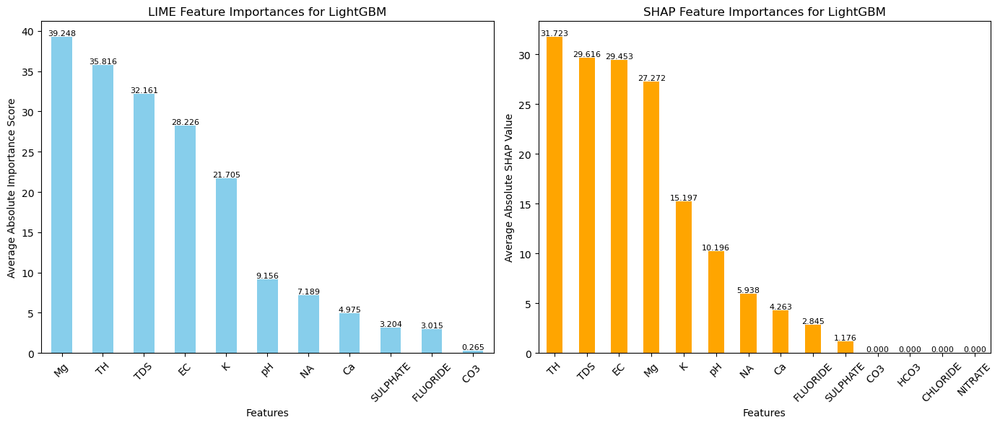

[GPBoost] [Warning] lambda_l2 is set with reg_lambda=0.0, will be overridden by lambda=1.0. Current value: lambda_l2=1.0


  0%|          | 0/47 [00:00<?, ?it/s]

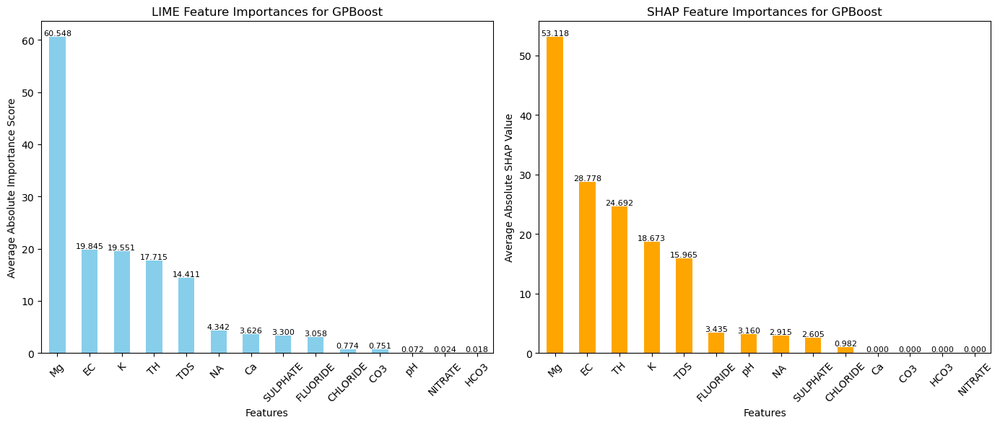

  0%|          | 0/47 [00:00<?, ?it/s]

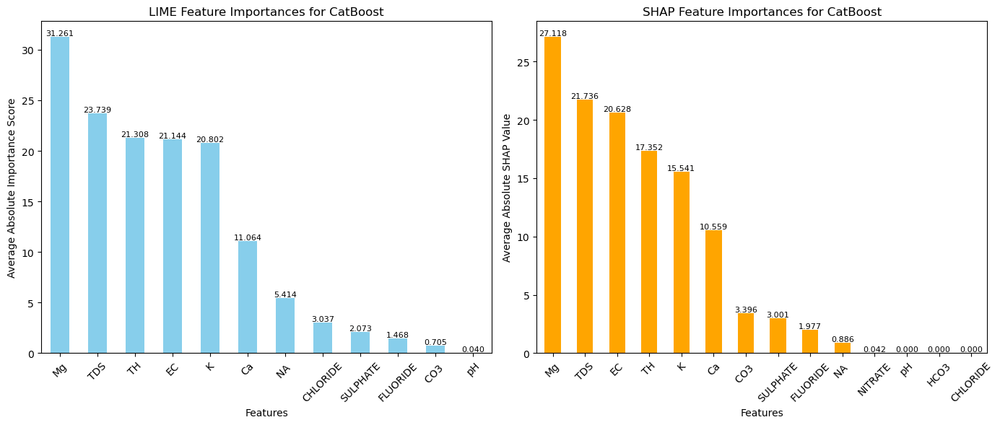

  0%|          | 0/47 [00:00<?, ?it/s]

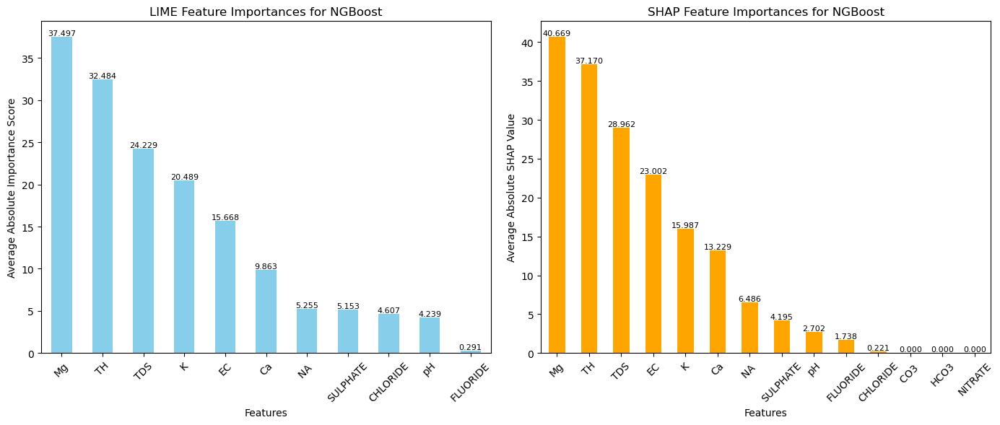

In [130]:
generate_interpretml_explanations_summary_pruners(best_scores_partial_fixed_sampler, X_train, y_train, x_test, feature_names)

# **NSGAIISampler using optuna**

In [ ]:
# Suppress Optuna's verbose output
optuna.logging.set_verbosity(optuna.logging.WARNING)

def hyperparameter_tuning_nsg(X_train, y_train, X_test, y_test):
    def objective(trial, model_name, model_class, param_space):
        # Suggest hyperparameters
        params = {}
        for key, values in param_space.items():
            if isinstance(values, list):
                params[key] = trial.suggest_categorical(key, values)
            elif isinstance(values, tuple) and all(isinstance(v, int) for v in values):
                params[key] = trial.suggest_int(key, *values)
            else:
                params[key] = trial.suggest_float(key, *values)

        # Create a new instance of the model
        model = model_class()
        model.set_params(**params)

        # Ensure the input arrays are writable
        X_train_copy = np.array(X_train, copy=True)
        y_train_copy = np.array(y_train, copy=True)
        X_test_copy = np.array(X_test, copy=True)
        y_test_copy = np.array(y_test, copy=True)

        # Train model
        start_time = time.time()
        model.fit(X_train_copy, y_train_copy)
        training_time = time.time() - start_time

        # Predict
        y_pred = model.predict(X_test_copy)

        # Calculate MSE
        mse = mean_squared_error(y_test_copy, y_pred)

        # Return both objectives: MSE and training time
        return mse, training_time

    models = {
        'Random Forest': (RandomForestRegressor, {
            'n_estimators': (100, 500),
            'max_depth': (3, 15),
            'min_samples_split': (2, 10),
            'min_samples_leaf': (1, 4),
            'max_features': ['sqrt', 'log2', None]
        }),
        'Gradient Boosting': (GradientBoostingRegressor, {
            'n_estimators': (100, 500),
            'learning_rate': (0.01, 0.1),
            'max_depth': (3, 10),
            'min_samples_split': (2, 10),
            'min_samples_leaf': (1, 4),
            'max_features': ['sqrt', 'log2']
        }),
        'XGBoost': (XGBRegressor, {
            'learning_rate': (0.01, 0.1),
            'max_depth': (3, 7),
            'n_estimators': (100, 500),
            'min_child_weight': (1, 5),
            'gamma': (0, 1),
            'subsample': (0.5, 0.9),
            'colsample_bytree': (0.5, 0.9)
        }),
        'LightGBM': (LGBMRegressor, {
            'learning_rate': (0.01, 0.1),
            'max_depth': (3, 7),
            'n_estimators': (100, 500),
            'num_leaves': (15, 63),
            'min_child_samples': (1, 10),
            'subsample': (0.5, 0.9),
            'colsample_bytree': (0.5, 0.9),
            'verbose': [-1]
        }),
        'GPBoost': (GPBoostRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'num_leaves': [15, 31, 63],
            'min_child_samples': [1, 5, 10],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9],
            'alpha': [0.1, 0.5, 1.0],
            'lambda': [0.1, 0.5, 1.0],
            'verbose': [-1]
        }),
        'CatBoost': (CatBoostRegressor, {
            'learning_rate': (0.01, 0.1),
            'iterations': (100, 500),
            'depth': (3, 7),
            'l2_leaf_reg': (1, 5),
            'border_count': (32, 128),
            'verbose': [0]
        }),
        'NGBoost': (NGBRegressor, {
            'n_estimators': (100, 200),
            'learning_rate': (0.01, 0.1),
            'natural_gradient': [True, False],
            'minibatch_frac': (0.5, 0.7),
            'verbose': [0]
        })
    }

    best_scores = {}
    for model_name, (model_class, param_space) in models.items():
        print(f"Running Optuna for {model_name} with NSGAIISampler...")
        try:
            # Use the NSGAIISampler in the study creation
            sampler = NSGAIISampler()
            study = optuna.create_study(directions=['minimize', 'minimize'], sampler=sampler)
            study.optimize(lambda trial: objective(trial, model_name, model_class, param_space), n_trials=50)
            
            # Retrieve the best trial based on Pareto front (first trial in the sorted list)
            best_trial = sorted(study.best_trials, key=lambda t: t.values)[0]
            best_params = best_trial.params
            best_model = model_class().set_params(**best_params)
            best_model.fit(X_train, y_train)
            y_pred = best_model.predict(X_test)

            # Calculate MSE and RMSE
            mse = mean_squared_error(y_test, y_pred)
            rmse = np.sqrt(mse)

            # Calculate Correlation Coefficient
            corr_coef = np.corrcoef(y_test, y_pred)[0, 1]

            best_scores[model_name] = {
                'best_score': mse,
                'best_params': best_params,
                'test_mse': mse,
                'test_rmse': rmse,
                'test_corr_coef': corr_coef
            }
            print(f"Best MSE for {model_name}: {mse} with params: {best_params}")
            print(f"Best RMSE for {model_name}: {rmse}")
            print(f"Correlation Coefficient for {model_name}: {corr_coef}")
        except Exception as e:
            print(f"Failed to run Optuna for {model_name}. Error: {e}")

    # Find the model with the best MSE on test data
    if best_scores:
        best_model_name = min(best_scores, key=lambda k: best_scores[k]['test_mse'])
        best_model_info = best_scores[best_model_name]
        print(f"\nBest model on test data: {best_model_name}")
        print(f"Test MSE: {best_model_info['test_mse']}")
        print(f"Test RMSE: {best_model_info['test_rmse']}")
        print(f"Correlation Coefficient: {best_model_info['test_corr_coef']}")
        print(f"Best Parameters: {best_model_info['best_params']}")
    else:
        print("No valid model configurations found.")

    return best_scores
    
best_scores_nsga_ii_sampler = hyperparameter_tuning_nsg(X_train, y_train, X_test, y_test)

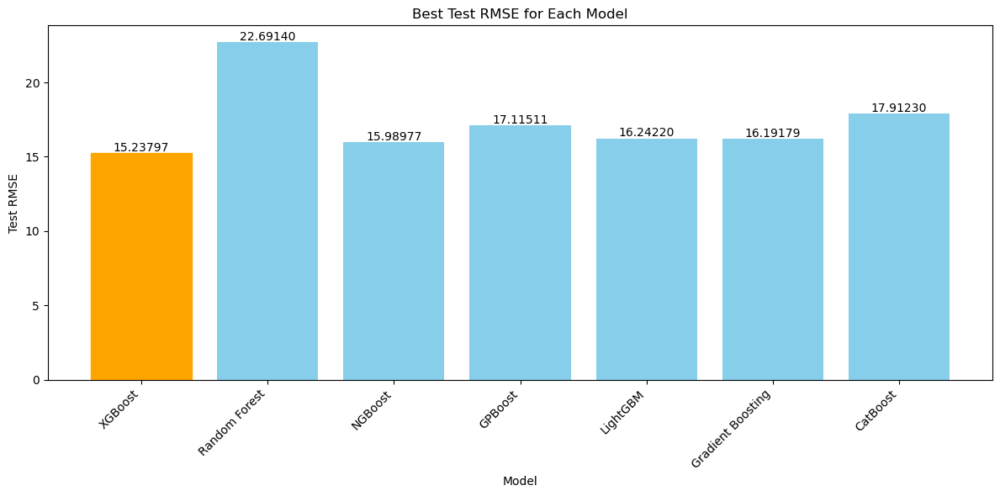

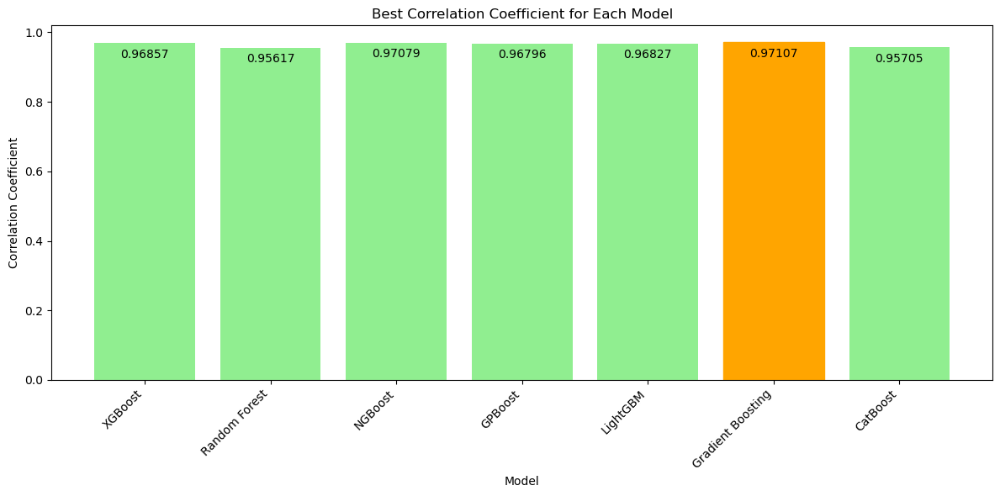

In [134]:
plot_best_scores_without_pruners(best_scores_nsga_ii_sampler)

  0%|          | 0/47 [00:00<?, ?it/s]

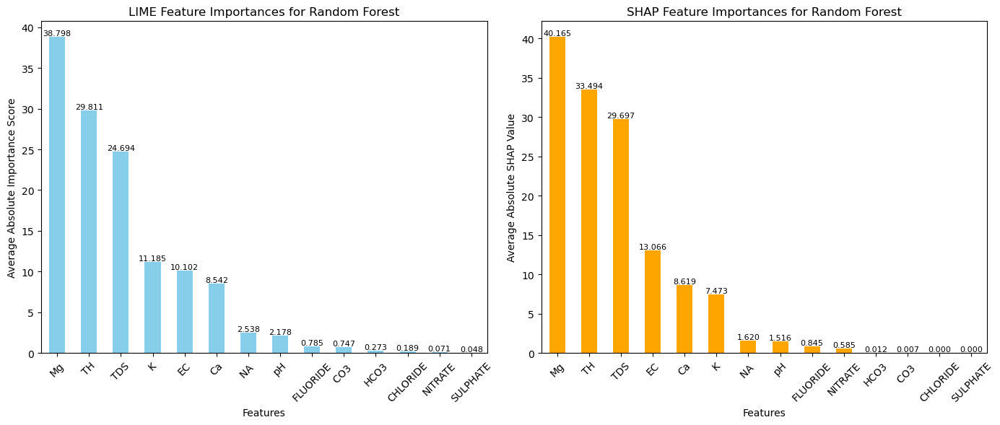

  0%|          | 0/47 [00:00<?, ?it/s]

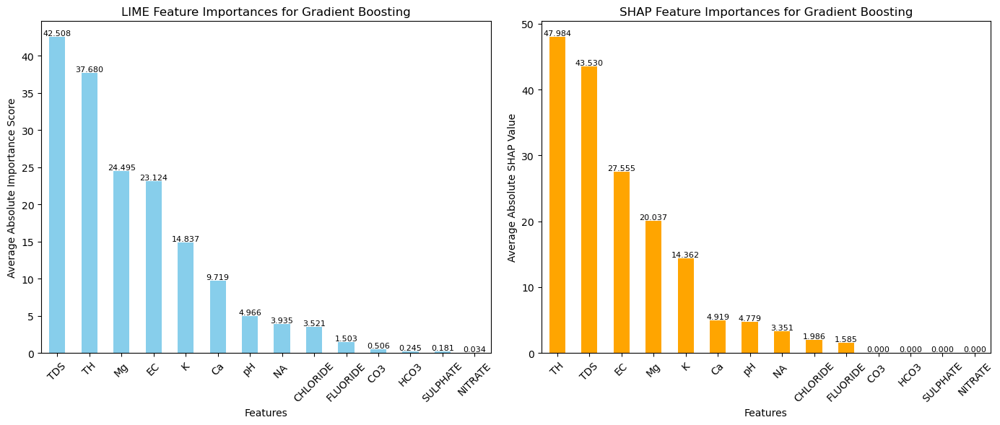

  0%|          | 0/47 [00:00<?, ?it/s]

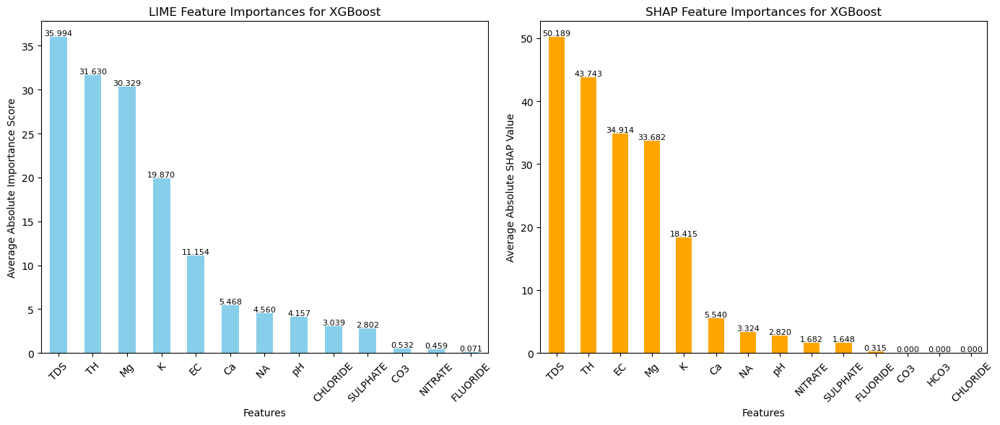

  0%|          | 0/47 [00:00<?, ?it/s]

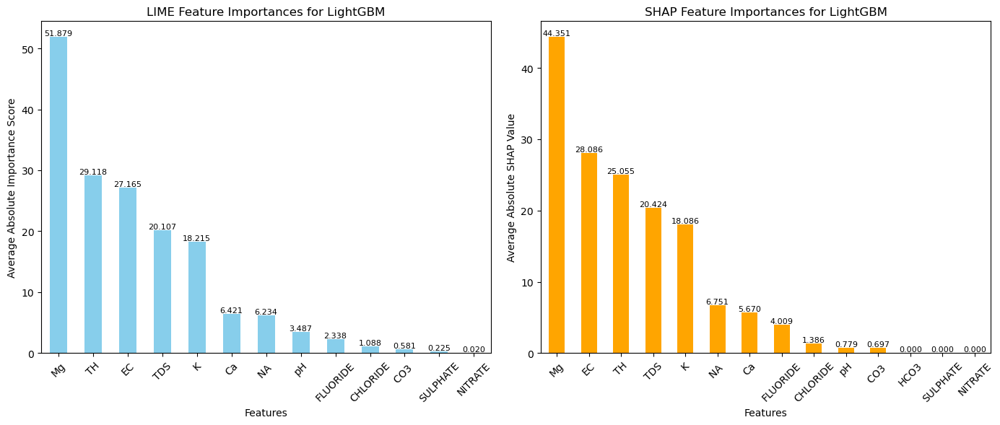

[GPBoost] [Warning] lambda_l2 is set with reg_lambda=0.0, will be overridden by lambda=0.5. Current value: lambda_l2=0.5


  0%|          | 0/47 [00:00<?, ?it/s]

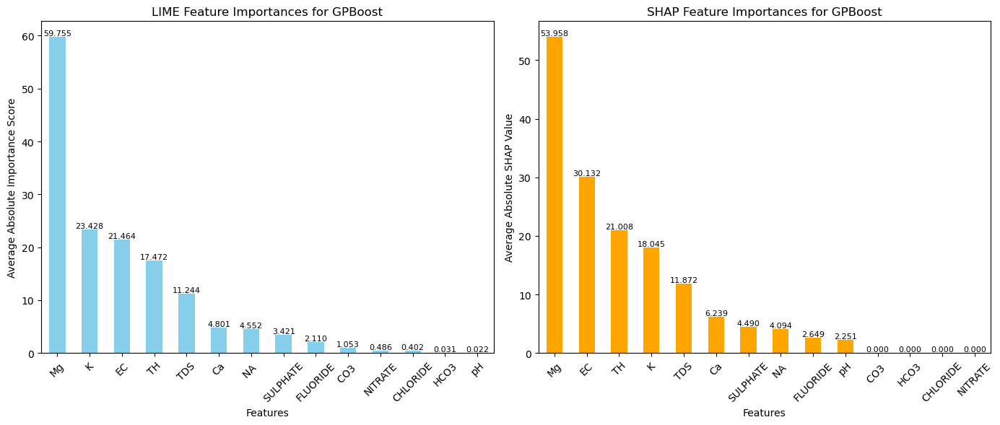

  0%|          | 0/47 [00:00<?, ?it/s]

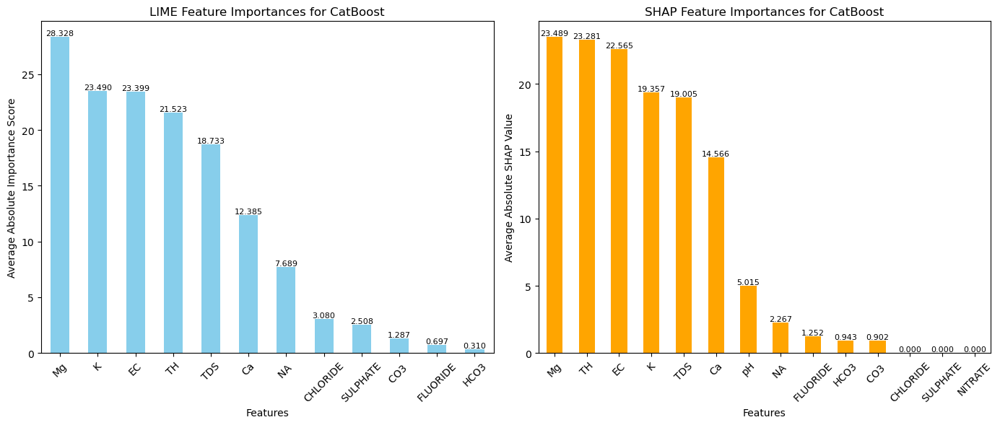

  0%|          | 0/47 [00:00<?, ?it/s]

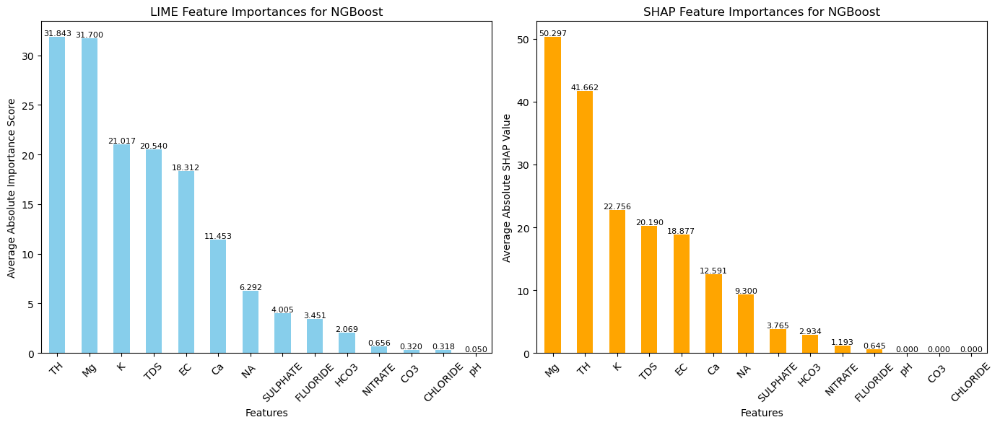

In [135]:
generate_interpretml_explanations_summary(best_scores_nsga_ii_sampler, X_train, y_train, x_test, feature_names)

# **NSGAIIISampler using optuna**

In [ ]:
# Suppress Optuna's verbose output
optuna.logging.set_verbosity(optuna.logging.WARNING)

def hyperparameter_tuning_nsga(X_train, y_train, X_test, y_test):
    def objective(trial, model_name, model_class, param_space):
        # Suggest hyperparameters
        params = {}
        for key, values in param_space.items():
            if isinstance(values, list):
                params[key] = trial.suggest_categorical(key, values)
            else:
                params[key] = trial.suggest_float(key, *values)

        # Create a new instance of the model
        model = model_class()
        model.set_params(**params)

        # Ensure the input arrays are writable
        X_train_copy = np.array(X_train, copy=True)
        y_train_copy = np.array(y_train, copy=True)
        X_test_copy = np.array(X_test, copy=True)
        y_test_copy = np.array(y_test, copy=True)

        # Train model
        start_time = time.time()
        model.fit(X_train_copy, y_train_copy)
        training_time = time.time() - start_time

        # Predict
        y_pred = model.predict(X_test_copy)

        # Calculate MSE
        mse = mean_squared_error(y_test_copy, y_pred)

        # Return both objectives: MSE and training time
        return mse, training_time

    models = {
        'Random Forest': (RandomForestRegressor, {
            'n_estimators': [100, 200, 500],
            'max_depth': [None, 5, 10, 15],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'max_features': ['sqrt', 'log2', None]
        }),
        'Gradient Boosting': (GradientBoostingRegressor, {
            'n_estimators': [100, 200, 500],
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 10],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'max_features': ['sqrt', 'log2']
        }),
        'XGBoost': (XGBRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'min_child_weight': [1, 3, 5],
            'gamma': [0, 0.1, 0.5, 1],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9]
        }),
        'LightGBM': (LGBMRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'num_leaves': [15, 31, 63],
            'min_child_samples': [1, 5, 10],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9],
            'verbose': [-1]
        }),
        'GPBoost': (GPBoostRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'num_leaves': [15, 31, 63],
            'min_child_samples': [1, 5, 10],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9],
            'alpha': [0.1, 0.5, 1.0],
            'lambda': [0.1, 0.5, 1.0],
            'verbose': [-1]
        }),
        'CatBoost': (CatBoostRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'iterations': [100, 200, 300, 500],
            'depth': [3, 5, 7],
            'l2_leaf_reg': [1, 3, 5],
            'border_count': [32, 64, 128],
            'verbose': [0]
        }),
        'NGBoost': (NGBRegressor, {
            'n_estimators': [100, 200],
            'learning_rate': [0.01, 0.1],
            'natural_gradient': [True, False],
            'minibatch_frac': [0.5, 0.7],
            'verbose': [0]
        })
    }

    best_scores = {}
    for model_name, (model_class, param_space) in models.items():
        print(f"Running Optuna for {model_name} with NSGAIIISampler...")
        try:
            # Use the NSGAIIISampler in the study creation
            sampler = NSGAIIISampler()
            study = optuna.create_study(directions=['minimize', 'minimize'], sampler=sampler)
            study.optimize(lambda trial: objective(trial, model_name, model_class, param_space), n_trials=50)
            
            best_trial = study.best_trials[0]
            best_params = best_trial.params
            best_model = model_class().set_params(**best_params)
            best_model.fit(X_train, y_train)
            y_pred = best_model.predict(X_test)

            # Calculate MSE and RMSE
            mse = mean_squared_error(y_test, y_pred)
            rmse = np.sqrt(mse)

            # Calculate Correlation Coefficient
            numerator = np.sum((y_test - np.mean(y_test)) * (y_pred - np.mean(y_pred)))
            denominator = np.sqrt(np.sum((y_test - np.mean(y_test))**2) * np.sum((y_pred - np.mean(y_pred))**2))
            corr_coef = numerator / denominator if denominator != 0 else 0.0

            best_scores[model_name] = {
                'best_score': mse,
                'best_params': best_params,
                'test_mse': mse,
                'test_rmse': rmse,
                'test_corr_coef': corr_coef
            }
            print(f"Best MSE for {model_name}: {mse} with params: {best_params}")
            print(f"Best RMSE for {model_name}: {rmse}")
            print(f"Correlation Coefficient for {model_name}: {corr_coef}")
        except Exception as e:
            print(f"Failed to run Optuna for {model_name}. Error: {e}")

    # Find the model with the best MSE on test data
    if best_scores:
        best_model_name = min(best_scores, key=lambda k: best_scores[k]['test_mse'])
        best_model_info = best_scores[best_model_name]
        print(f"\nBest model on test data: {best_model_name}")
        print(f"Test MSE: {best_model_info['test_mse']}")
        print(f"Test RMSE: {best_model_info['test_rmse']}")
        print(f"Correlation Coefficient: {best_model_info['test_corr_coef']}")
        print(f"Best Parameters: {best_model_info['best_params']}")
    else:
        print("No valid model configurations found.")

    return best_scores

best_scores_nsga_iii_sampler = hyperparameter_tuning_nsga(X_train, y_train, X_test, y_test)

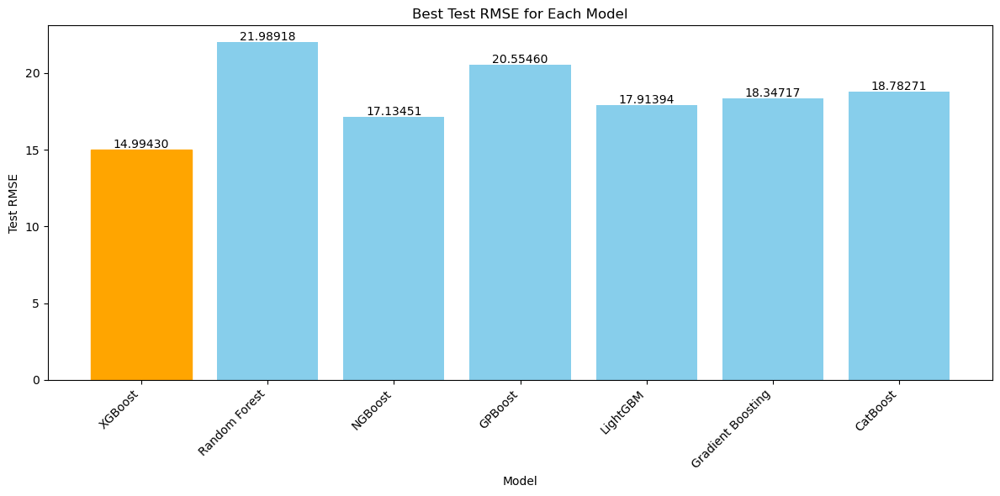

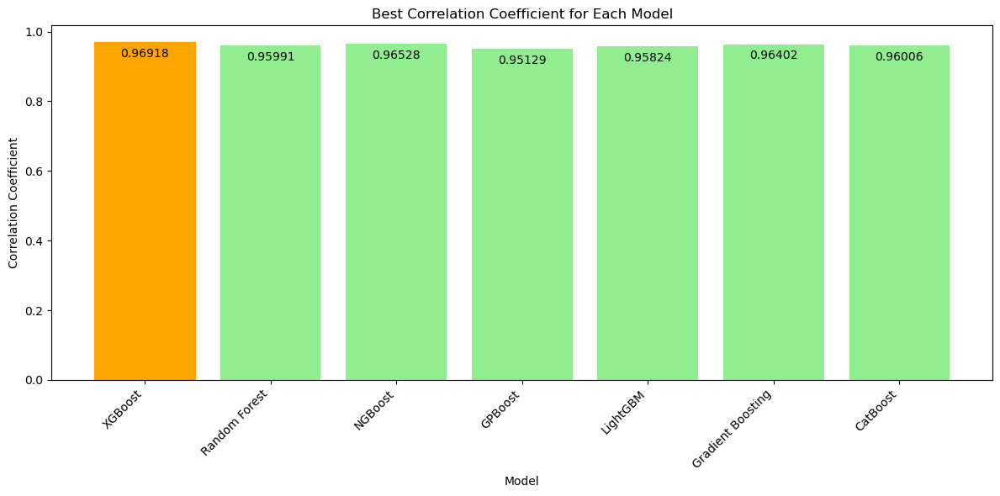

In [142]:
plot_best_scores_without_pruners(best_scores_nsga_iii_sampler)

  0%|          | 0/47 [00:00<?, ?it/s]

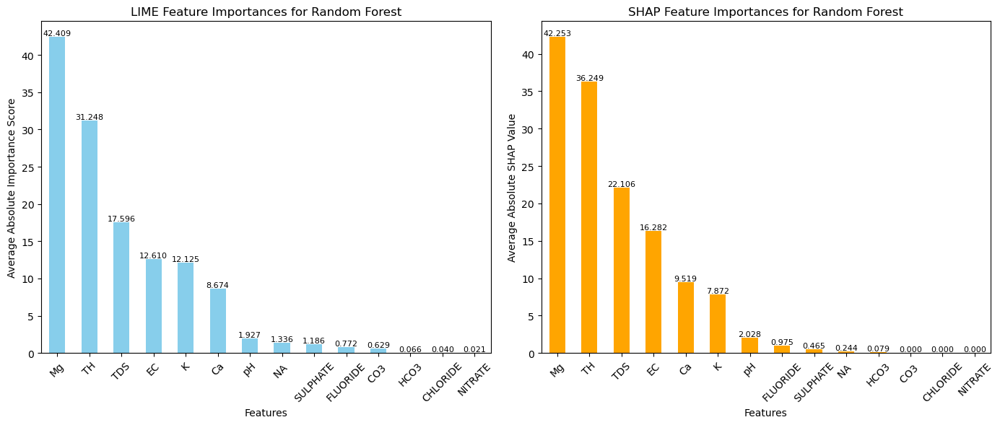

  0%|          | 0/47 [00:00<?, ?it/s]

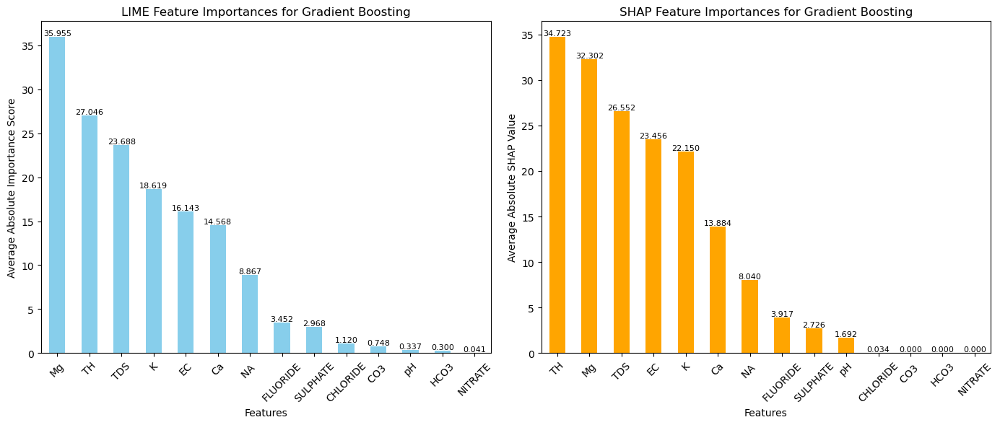

  0%|          | 0/47 [00:00<?, ?it/s]

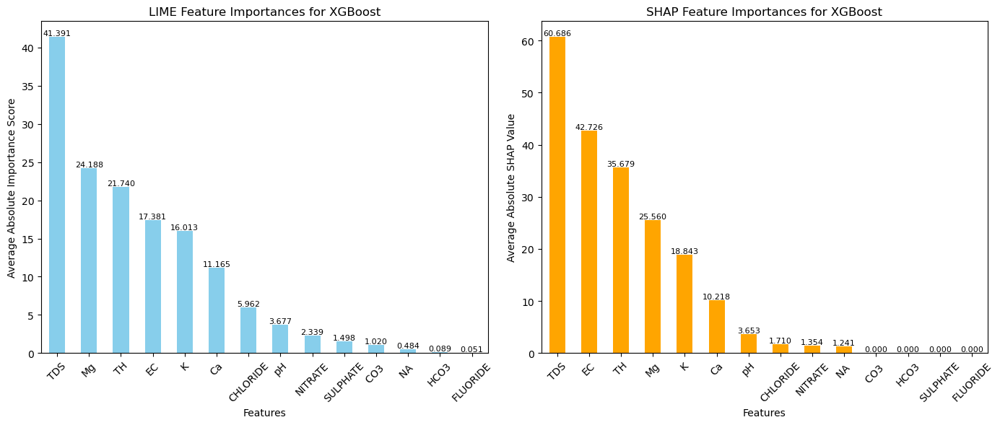

  0%|          | 0/47 [00:00<?, ?it/s]

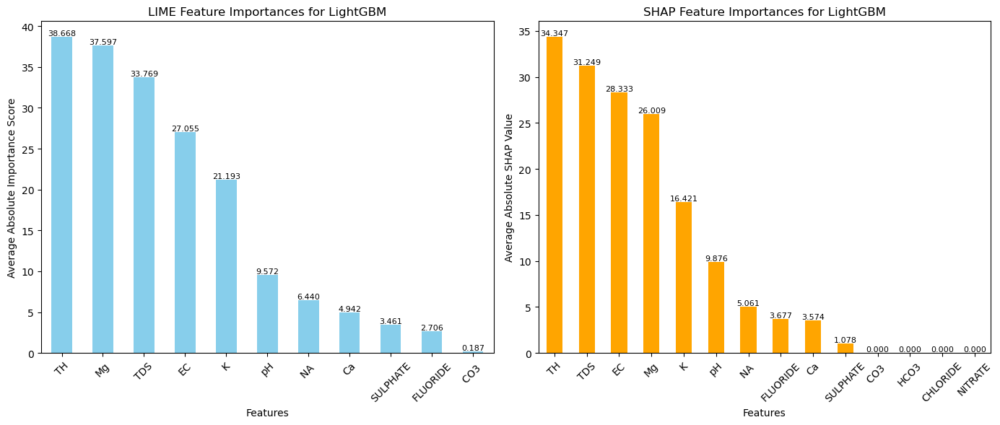

[GPBoost] [Warning] lambda_l2 is set with reg_lambda=0.0, will be overridden by lambda=1.0. Current value: lambda_l2=1.0


  0%|          | 0/47 [00:00<?, ?it/s]

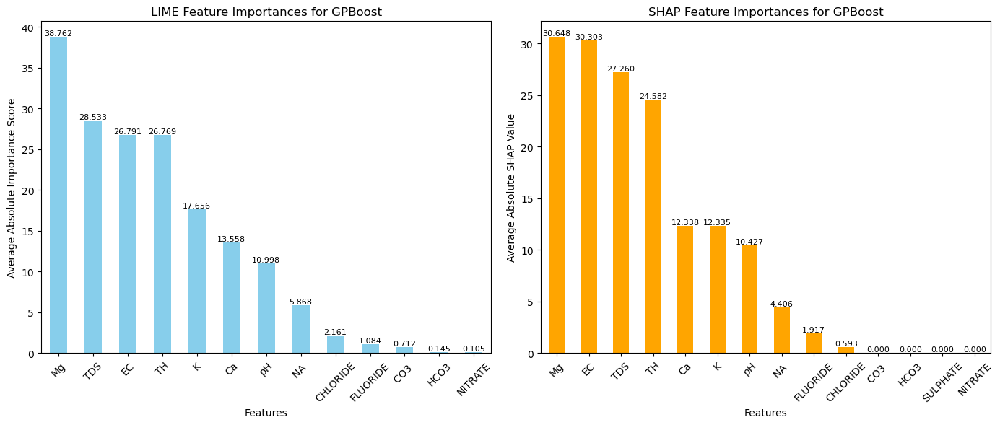

  0%|          | 0/47 [00:00<?, ?it/s]

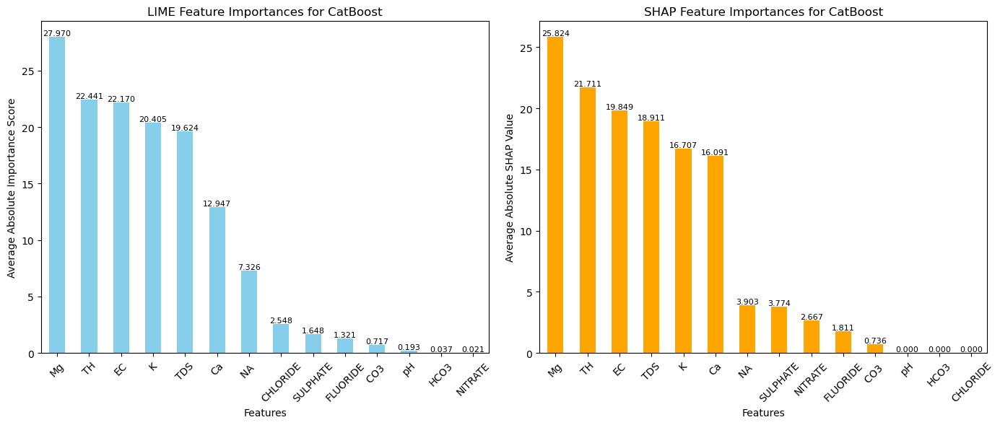

  0%|          | 0/47 [00:00<?, ?it/s]

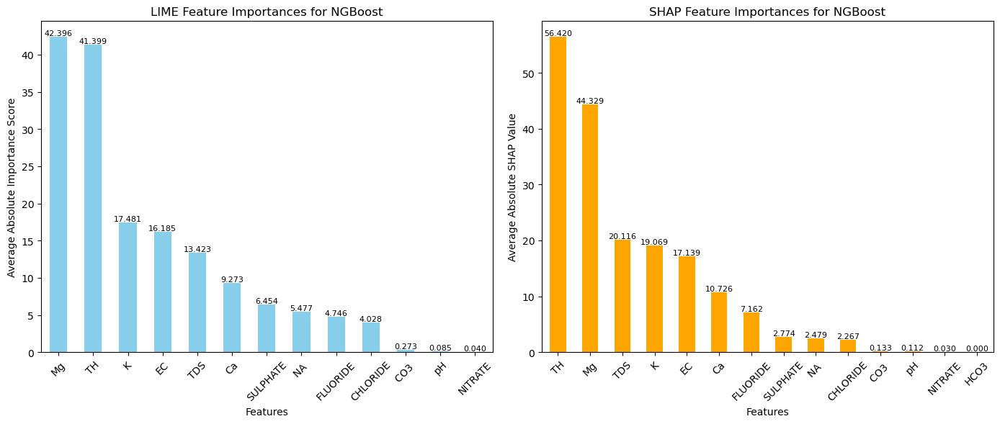

In [143]:
generate_interpretml_explanations_summary(best_scores_nsga_iii_sampler, X_train, y_train, x_test, feature_names)

# **QMCSampler using optuna**

In [ ]:
# Suppress Optuna's verbose output
optuna.logging.set_verbosity(optuna.logging.ERROR)

def hyperparameter_tuning_qmc(X_train, y_train, X_test, y_test):
    def objective(trial, model_name, model_class, param_space):
        # Suggest hyperparameters
        params = {}
        for key, values in param_space.items():
            if isinstance(values, list):
                # Use suggest_categorical for categorical choices
                params[key] = trial.suggest_categorical(key, values)
            elif isinstance(values, tuple) and all(isinstance(v, int) for v in values):
                # Use suggest_int for integer ranges
                params[key] = trial.suggest_int(key, *values)
            else:
                # Use suggest_float for float ranges
                params[key] = trial.suggest_float(key, *values)

        # Create a new instance of the model
        model = model_class()
        model.set_params(**params)

        # Ensure the input arrays are writable
        X_train_copy = np.array(X_train, copy=True)
        y_train_copy = np.array(y_train, copy=True)
        X_test_copy = np.array(X_test, copy=True)
        y_test_copy = np.array(y_test, copy=True)

        # Train model
        start_time = time.time()
        model.fit(X_train_copy, y_train_copy)
        training_time = time.time() - start_time

        # Predict
        y_pred = model.predict(X_test_copy)

        # Calculate MSE
        mse = mean_squared_error(y_test_copy, y_pred)

        # Return both objectives: MSE and training time
        return mse, training_time

    models = {
        'Random Forest': (RandomForestRegressor, {
            'n_estimators': [100, 200, 500],
            'max_depth': [None, 5, 10, 15],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'max_features': ['sqrt', 'log2', None]
        }),
        'Gradient Boosting': (GradientBoostingRegressor, {
            'n_estimators': [100, 200, 500],
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 10],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'max_features': ['sqrt', 'log2']
        }),
        'XGBoost': (XGBRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'min_child_weight': [1, 3, 5],
            'gamma': [0, 0.1, 0.5, 1],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9]
        }),
        'LightGBM': (LGBMRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'num_leaves': [15, 31, 63],
            'min_child_samples': [1, 5, 10],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9],
            'verbose': [-1]
        }),
        'GPBoost': (GPBoostRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'num_leaves': [15, 31, 63],
            'min_child_samples': [1, 5, 10],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9],
            'alpha': [0.1, 0.5, 1.0],
            'lambda': [0.1, 0.5, 1.0],
            'verbose': [-1]
        }),
        'CatBoost': (CatBoostRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'iterations': [100, 200, 300, 500],
            'depth': [3, 5, 7],
            'l2_leaf_reg': [1, 3, 5],
            'border_count': [32, 64, 128],
            'verbose': [0]
        }),
        'NGBoost': (NGBRegressor, {
            'n_estimators': [100, 200],
            'learning_rate': [0.01, 0.1],
            'natural_gradient': [True, False],
            'minibatch_frac': [0.5, 0.7],
            'verbose': [0]
        })
    }

    best_scores = {}
    for model_name, (model_class, param_space) in models.items():
        print(f"Running Optuna for {model_name} with QMCSampler...")
        try:
            # Use the QMCSampler in the study creation
            sampler = QMCSampler()
            study = optuna.create_study(directions=['minimize', 'minimize'], sampler=sampler)
            study.optimize(lambda trial: objective(trial, model_name, model_class, param_space), n_trials=50)
            
            best_trial = study.best_trials[0]
            best_params = best_trial.params
            best_model = model_class().set_params(**best_params)
            best_model.fit(X_train, y_train)
            y_pred = best_model.predict(X_test)

            # Calculate MSE and RMSE
            mse = mean_squared_error(y_test, y_pred)
            rmse = np.sqrt(mse)

            # Calculate Correlation Coefficient
            numerator = np.sum((y_test - np.mean(y_test)) * (y_pred - np.mean(y_pred)))
            denominator = np.sqrt(np.sum((y_test - np.mean(y_test))**2) * np.sum((y_pred - np.mean(y_pred))**2))
            corr_coef = numerator / denominator if denominator != 0 else 0.0

            best_scores[model_name] = {
                'best_score': mse,
                'best_params': best_params,
                'test_mse': mse,
                'test_rmse': rmse,
                'test_corr_coef': corr_coef
            }
            print(f"Best MSE for {model_name}: {mse} with params: {best_params}")
            print(f"Best RMSE for {model_name}: {rmse}")
            print(f"Correlation Coefficient for {model_name}: {corr_coef}")
        except Exception as e:
            print(f"Failed to run Optuna for {model_name}. Error: {e}")

    # Find the model with the best MSE on test data
    if best_scores:
        best_model_name = min(best_scores, key=lambda k: best_scores[k]['test_mse'])
        best_model_info = best_scores[best_model_name]
        print(f"\nBest model on test data: {best_model_name}")
        print(f"Test MSE: {best_model_info['test_mse']}")
        print(f"Test RMSE: {best_model_info['test_rmse']}")
        print(f"Correlation Coefficient: {best_model_info['test_corr_coef']}")
        print(f"Best Parameters: {best_model_info['best_params']}")
    else:
        print("No valid model configurations found.")

    return best_scores

best_scores_qmc_sampler = hyperparameter_tuning_qmc(X_train, y_train, X_test, y_test)

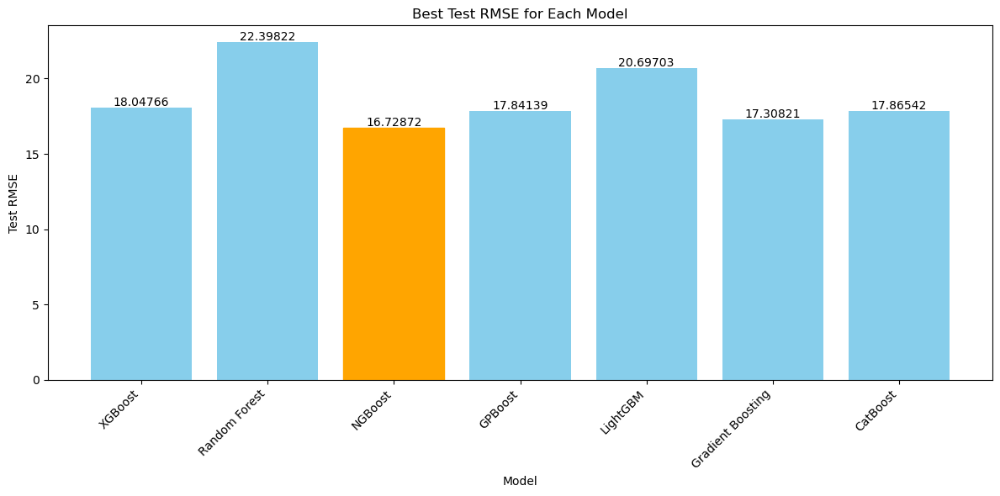

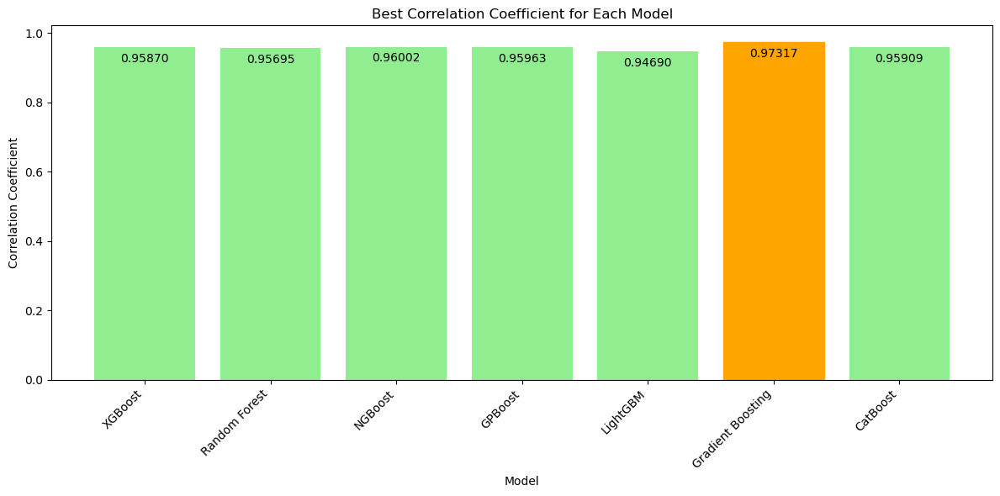

In [148]:
plot_best_scores_without_pruners(best_scores_qmc_sampler)

  0%|          | 0/47 [00:00<?, ?it/s]

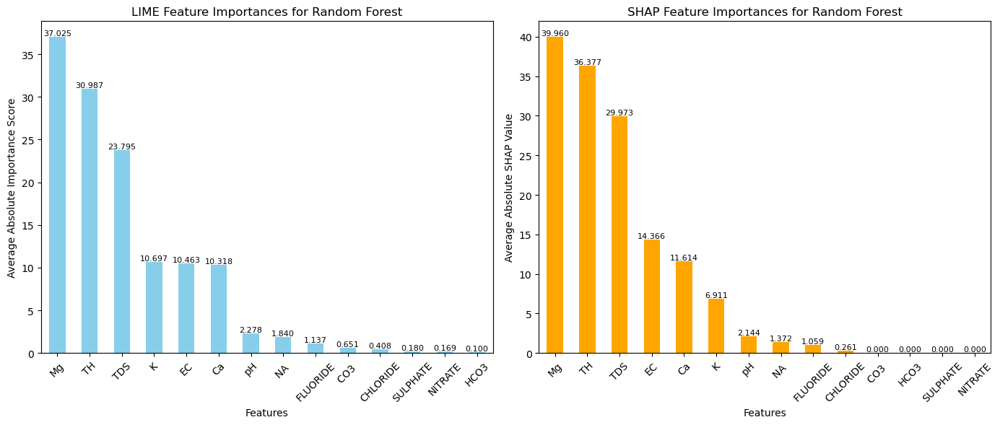

  0%|          | 0/47 [00:00<?, ?it/s]

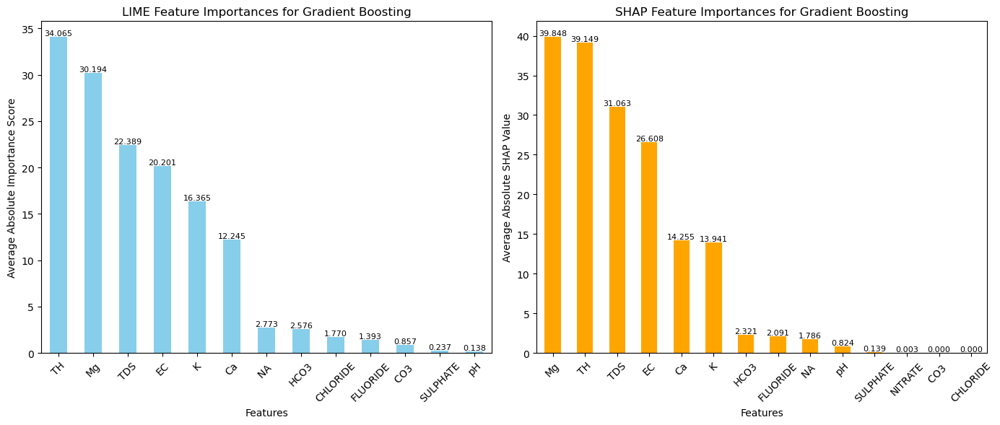

  0%|          | 0/47 [00:00<?, ?it/s]

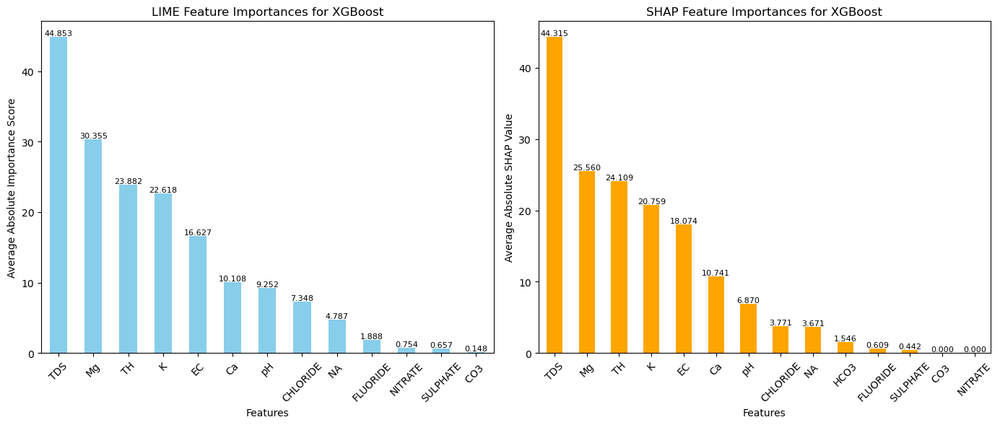

  0%|          | 0/47 [00:00<?, ?it/s]

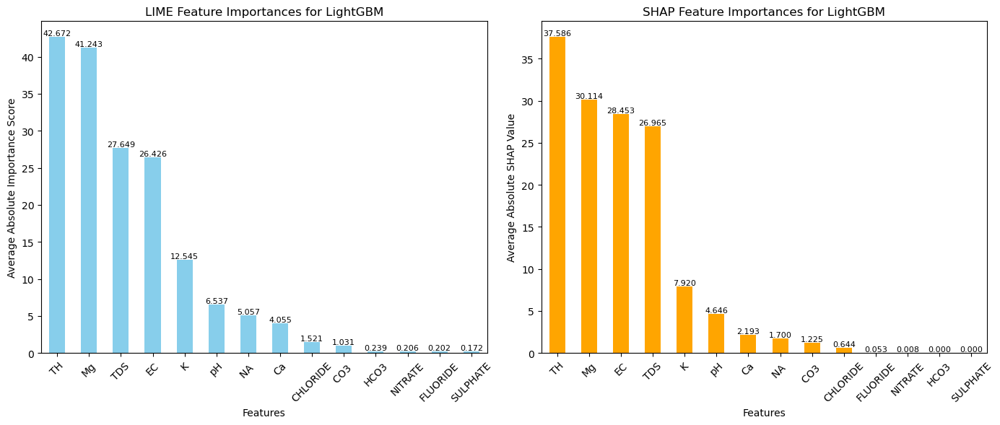

[GPBoost] [Warning] lambda_l2 is set with reg_lambda=0.0, will be overridden by lambda=1.0. Current value: lambda_l2=1.0


  0%|          | 0/47 [00:00<?, ?it/s]

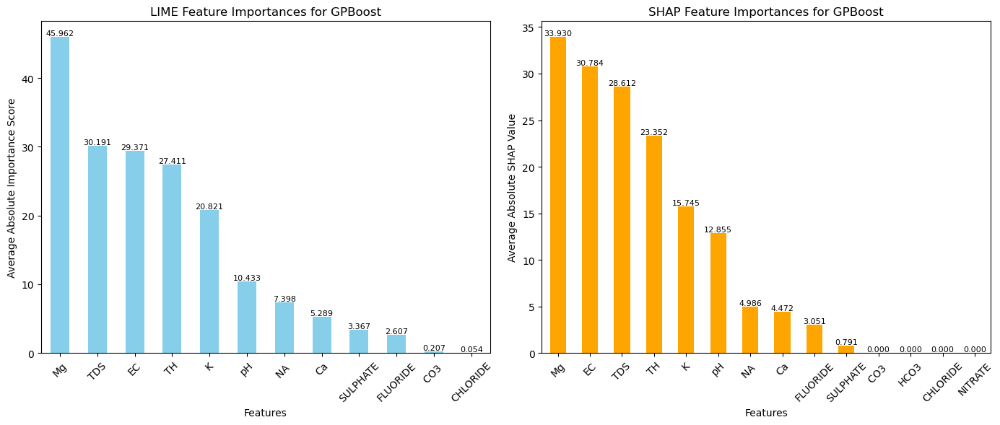

  0%|          | 0/47 [00:00<?, ?it/s]

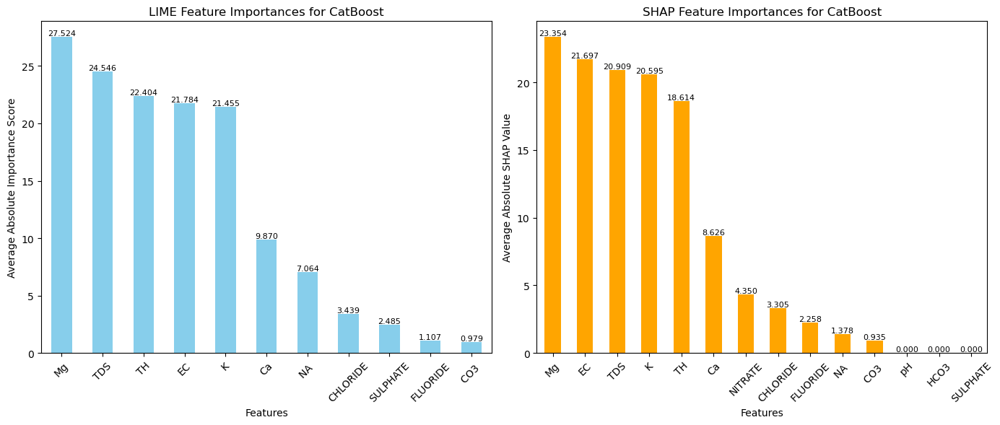

  0%|          | 0/47 [00:00<?, ?it/s]

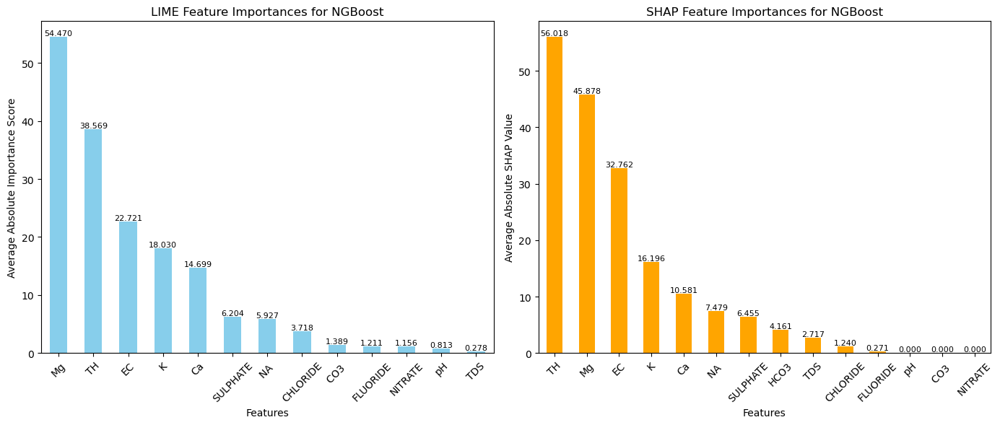

In [151]:
generate_interpretml_explanations_summary(best_scores_qmc_sampler, X_train, y_train, x_test, feature_names)

# **BruteForceSampler using optuna**

In [ ]:
# Suppress Optuna's verbose output
optuna.logging.set_verbosity(optuna.logging.WARNING)

def hyperparameter_tuning_brute_force(X_train, y_train, X_test, y_test):
    def objective(trial, model_name, model_class, param_space):
        # Suggest hyperparameters with finite search space
        params = {}
        for key, values in param_space.items():
            if isinstance(values, list):
                params[key] = trial.suggest_categorical(key, values)
            else:
                # Ensure a finite search space by specifying a step
                params[key] = trial.suggest_float(key, *values, step=0.1)

        # Create a new instance of the model
        model = model_class()
        model.set_params(**params)

        # Train model
        model.fit(X_train, y_train)

        # Predict
        y_pred = model.predict(X_test)

        # Calculate MSE
        mse = mean_squared_error(y_test, y_pred)

        return mse

    models = {
        'Random Forest': (RandomForestRegressor, {
            'n_estimators': [100, 200, 500],
            'max_depth': [5, 10, 15],  # Removed None for finite search space
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'max_features': ['sqrt', 'log2']
        }),
        'Gradient Boosting': (GradientBoostingRegressor, {
            'n_estimators': [100, 200, 500],
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 10],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'max_features': ['sqrt', 'log2']
        }),
        'XGBoost': (XGBRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'min_child_weight': [1, 3, 5],
            'gamma': [0, 0.1, 0.5, 1],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9]
        }),
        'LightGBM': (LGBMRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'num_leaves': [15, 31, 63],
            'min_child_samples': [1, 5, 10],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9],
            'verbose': [-1]
        }),
        'GPBoost': (GPBoostRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'num_leaves': [15, 31, 63],
            'min_child_samples': [1, 5, 10],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9],
            'alpha': [0.1, 0.5, 1.0],
            'lambda': [0.1, 0.5, 1.0],
            'verbose': [-1]
        }),
        'CatBoost': (CatBoostRegressor, {
            'learning_rate': [0.01, 0.05, 0.1],
            'iterations': [100, 200, 300, 500],
            'depth': [3, 5, 7],
            'l2_leaf_reg': [1, 3, 5],
            'border_count': [32, 64, 128],
            'verbose': [0]
        }),
        'NGBoost': (NGBRegressor, {
            'n_estimators': [100, 200],
            'learning_rate': [0.01, 0.1],
            'natural_gradient': [True, False],
            'minibatch_frac': [0.5, 0.7],
            'verbose': [0]
        })
    }

    pruners = [
        optuna.pruners.MedianPruner(),
        optuna.pruners.NopPruner(),
        optuna.pruners.PatientPruner(optuna.pruners.MedianPruner(), patience=3),
        optuna.pruners.PercentilePruner(25.0),
        optuna.pruners.SuccessiveHalvingPruner(),
        optuna.pruners.HyperbandPruner(),
        optuna.pruners.ThresholdPruner(lower=0.1),
        optuna.pruners.WilcoxonPruner()
    ]

    best_scores = {}
    for model_name, (model_class, param_space) in models.items():
        for pruner in pruners:
            pruner_name = pruner.__class__.__name__
            print(f"Running Optuna for {model_name} with {pruner_name} and BruteForceSampler...")
            try:
                # Use the BruteForceSampler and pruner in the study creation
                sampler = BruteForceSampler()
                study = optuna.create_study(direction='minimize', sampler=sampler, pruner=pruner)
                study.optimize(lambda trial: objective(trial, model_name, model_class, param_space), n_trials=50)
                
                best_trial = study.best_trial
                best_params = best_trial.params
                best_model = model_class().set_params(**best_params)
                best_model.fit(X_train, y_train)
                y_pred = best_model.predict(X_test)

                # Calculate MSE and RMSE
                mse = mean_squared_error(y_test, y_pred)
                rmse = np.sqrt(mse)

                # Calculate Correlation Coefficient
                numerator = np.sum((y_test - np.mean(y_test)) * (y_pred - np.mean(y_pred)))
                denominator = np.sqrt(np.sum((y_test - np.mean(y_test))**2) * np.sum((y_pred - np.mean(y_pred))**2))
                corr_coef = numerator / denominator if denominator != 0 else 0.0

                best_scores[(model_name, pruner_name)] = {
                    'best_score': mse,
                    'best_params': best_params,
                    'test_mse': mse,
                    'test_rmse': rmse,
                    'test_corr_coef': corr_coef,
                    'pruner': pruner_name
                }
                print(f"Best MSE for {model_name} with {pruner_name}: {mse} with params: {best_params}")
                print(f"Best RMSE for {model_name} with {pruner_name}: {rmse}")
                print(f"Correlation Coefficient for {model_name} with {pruner_name}: {corr_coef}")
            except Exception as e:
                print(f"Failed to run Optuna for {model_name} with {pruner_name}. Error: {e}")

    # Find the model with the best test score
    if best_scores:
        best_model_name, best_pruner_name = min(best_scores, key=lambda k: best_scores[k]['test_mse'])
        best_model_info = best_scores[(best_model_name, best_pruner_name)]
        print(f"\nBest model on test data: {best_model_name} with {best_pruner_name}")
        print(f"Test MSE: {best_model_info['test_mse']}")
        print(f"Test RMSE: {best_model_info['test_rmse']}")
        print(f"Correlation Coefficient: {best_model_info['test_corr_coef']}")
        print(f"Best Parameters: {best_model_info['best_params']}")
        print(f"Pruner Used: {best_model_info['pruner']}")
    else:
        print("No valid model configurations found.")

    return best_scores

best_scores_brute_force = hyperparameter_tuning_brute_force(X_train, y_train, X_test, y_test)

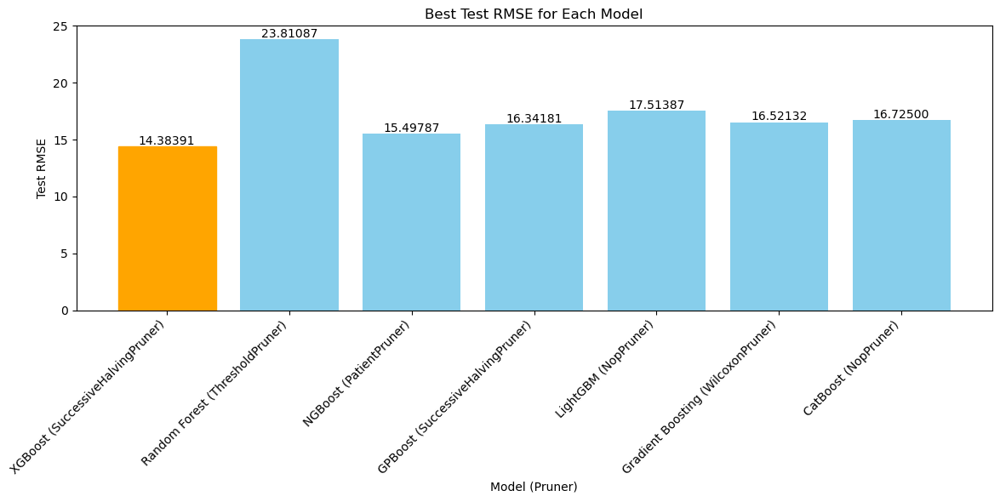

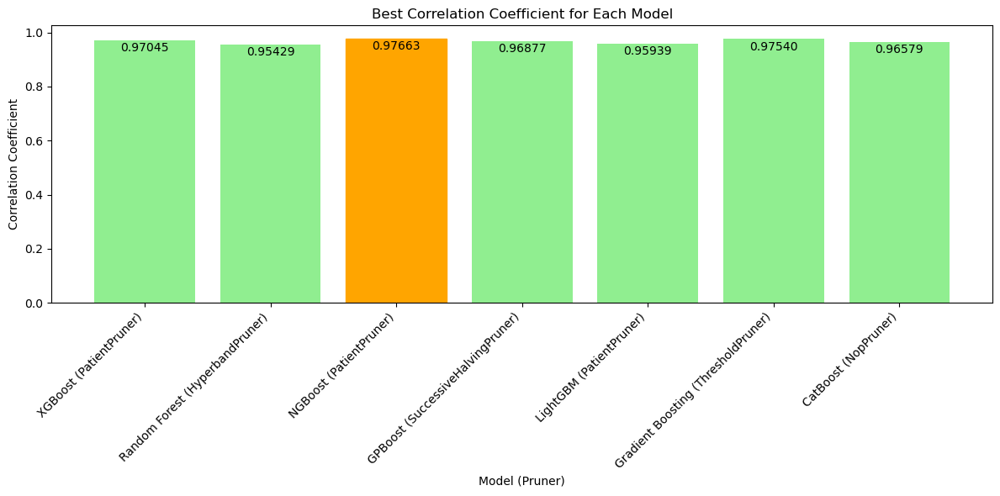

In [154]:
plot_best_scores(best_scores_brute_force)

  0%|          | 0/47 [00:00<?, ?it/s]

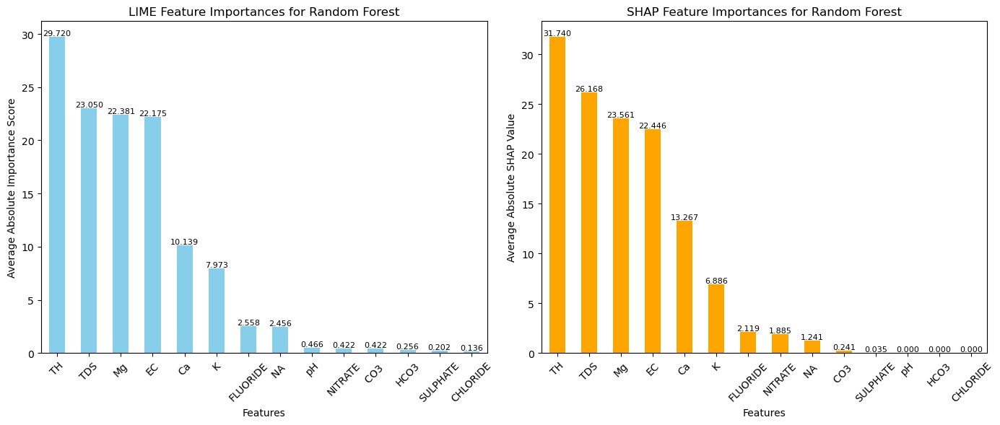

  0%|          | 0/47 [00:00<?, ?it/s]

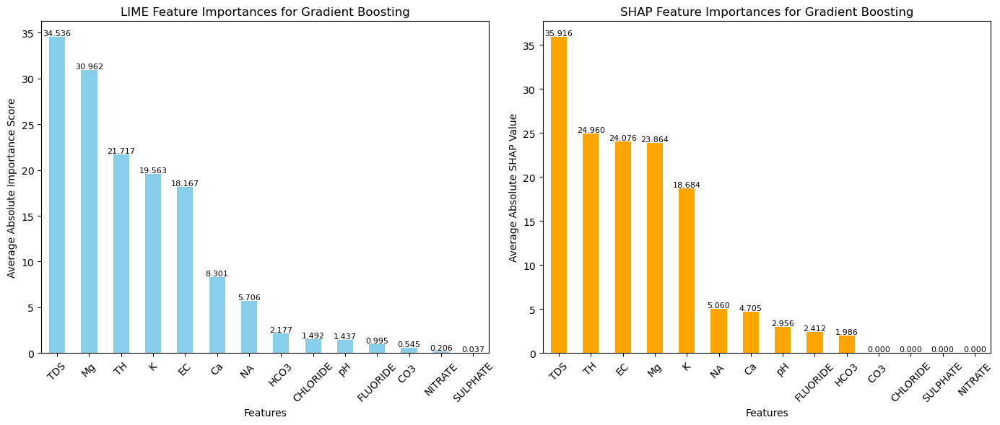

  0%|          | 0/47 [00:00<?, ?it/s]

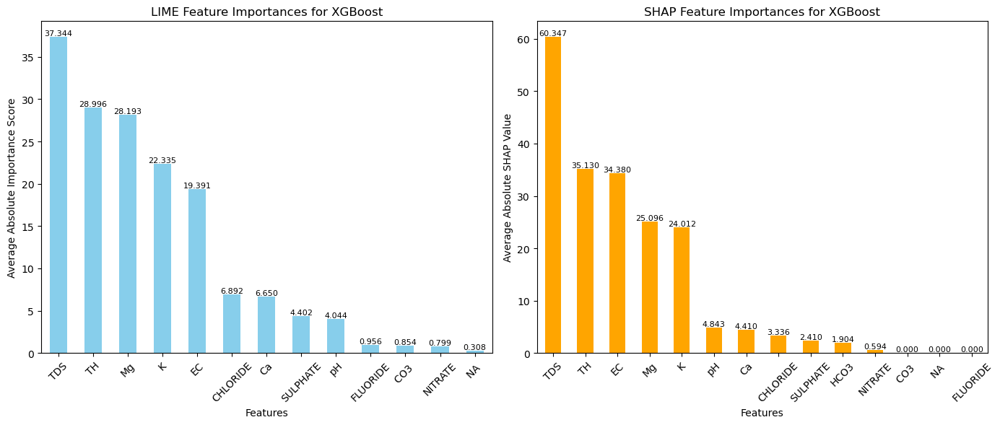

  0%|          | 0/47 [00:00<?, ?it/s]

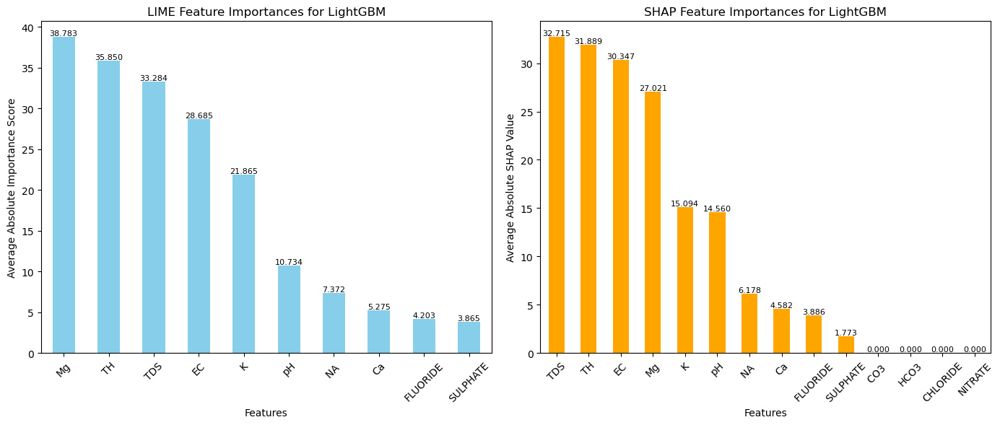

[GPBoost] [Warning] lambda_l2 is set with reg_lambda=0.0, will be overridden by lambda=1.0. Current value: lambda_l2=1.0


  0%|          | 0/47 [00:00<?, ?it/s]

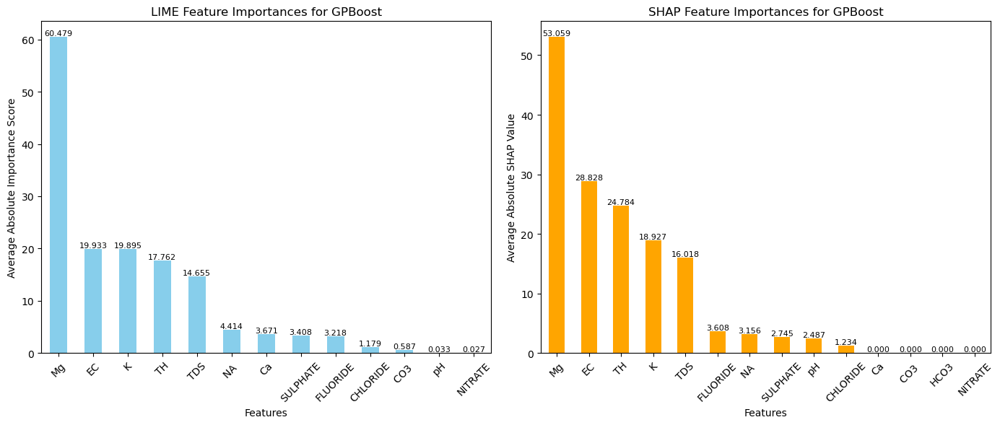

  0%|          | 0/47 [00:00<?, ?it/s]

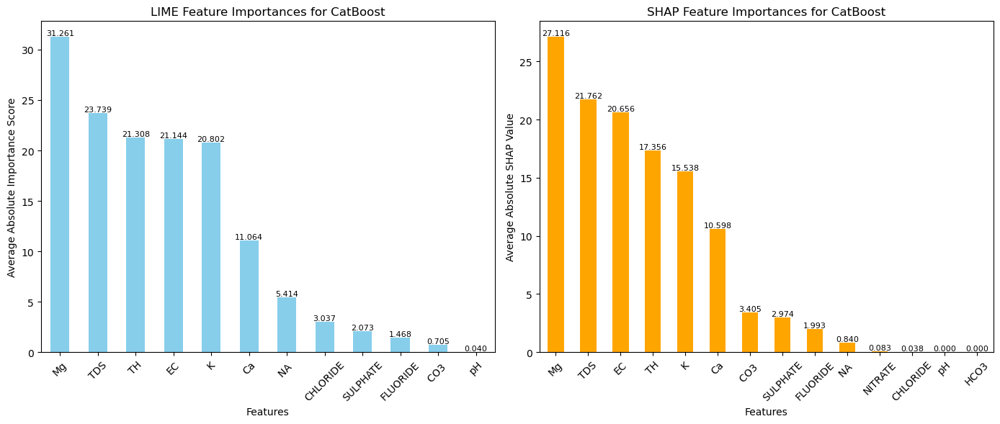

  0%|          | 0/47 [00:00<?, ?it/s]

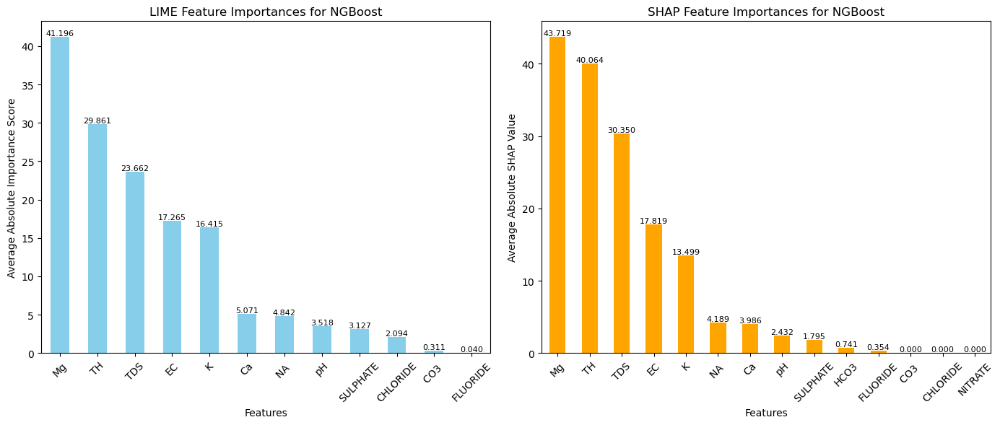

In [155]:
generate_interpretml_explanations_summary_pruners(best_scores_brute_force, X_train, y_train, x_test, feature_names)

# **Halving GridSearchCV**

In [ ]:
def hyperparameter_tuning_halving_grid(X_train, y_train, X_test, y_test):
    models = {
        'Random Forest': (RandomForestRegressor(), {
            'n_estimators': [100, 200, 500],
            'max_depth': [None, 5, 10, 15],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'max_features': ['sqrt', 'log2', None]
        }),
        'Gradient Boosting': (GradientBoostingRegressor(), {
            'n_estimators': [100, 200, 500],
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 10],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'max_features': ['sqrt', 'log2']
        }),
        'XGBoost': (XGBRegressor(), {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'min_child_weight': [1, 3, 5],
            'gamma': [0, 0.1, 0.5, 1],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9]
        }),
        'LightGBM': (LGBMRegressor(verbosity=-1), {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'num_leaves': [15, 31, 63],
            'min_child_samples': [1, 5, 10],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9]
        }),
        'GPBoost': (GPBoostRegressor(), {
            'learning_rate': [0.01, 0.05, 0.1],
            'max_depth': [3, 5, 7],
            'n_estimators': [100, 200, 300, 500],
            'num_leaves': [15, 31, 63],
            'min_data_in_leaf': [1, 5, 10],
            'subsample': [0.5, 0.7, 0.9],
            'colsample_bytree': [0.5, 0.7, 0.9],
            'lambda_l1': [0.0, 0.1, 0.5],
            'lambda_l2': [0.0, 0.1, 0.5]
        }),
        'CatBoost': (CatBoostRegressor(verbose=0), {
            'learning_rate': [0.01, 0.05, 0.1],
            'iterations': [100, 200, 300, 500],
            'depth': [3, 5, 7],
            'l2_leaf_reg': [1, 3, 5],
            'border_count': [32, 64, 128]
        }),
        'NGBoost': (NGBRegressor(verbose=0), {
            'n_estimators': [100, 200],
            'learning_rate': [0.01, 0.1],
            'natural_gradient': [True, False],
            'minibatch_frac': [0.5, 0.7]
        })
    }

    best_scores = {}
    for model_name, (model, param_grid) in models.items():
        print(f"Running HalvingGridSearchCV for {model_name}...")
        try:
            search = HalvingGridSearchCV(
                estimator=model,
                param_grid=param_grid,
                cv=3,
                factor=2,  # Reduction factor at each iteration
                scoring='neg_mean_squared_error',
                n_jobs=-1,
                verbose=0
            )

            search.fit(X_train, y_train)
            best_model = search.best_estimator_
            y_pred = best_model.predict(X_test)

            # Calculate MSE
            mse = mean_squared_error(y_test, y_pred)

            # Calculate RMSE
            rmse = np.sqrt(mse)

            # Calculate correlation coefficient
            corr_coef = np.corrcoef(y_test, y_pred)[0, 1]

            best_scores[model_name] = {
                'best_score': -search.best_score_,
                'best_params': search.best_params_,
                'test_mse': mse,
                'test_rmse': rmse,
                'test_corr_coef': corr_coef
            }
            print(f"Best MSE for {model_name}: {mse} with params: {search.best_params_}")
            print(f"Best RMSE for {model_name}: {rmse}")
            print(f"Correlation Coefficient for {model_name}: {corr_coef}")
        except Exception as e:
            print(f"Failed to run HalvingGridSearchCV for {model_name}. Error: {e}")

    # Find the model with the best test score
    if best_scores:
        best_model_name = min(best_scores, key=lambda k: best_scores[k]['test_mse'])
        best_model_info = best_scores[best_model_name]
        print(f"\nBest model on test data: {best_model_name}")
        print(f"Test MSE: {best_model_info['test_mse']}")
        print(f"Test RMSE: {best_model_info['test_rmse']}")
        print(f"Correlation Coefficient: {best_model_info['test_corr_coef']}")
        print(f"Best Parameters: {best_model_info['best_params']}")
    else:
        print("No valid model configurations found.")

    return best_scores

# Example usage
best_scores_halving_grid = hyperparameter_tuning_halving_grid(X_train, y_train, X_test, y_test)

# Removing Warnings
warnings.filterwarnings('ignore', message='.*lambda_l2 is set with lambda.*')
warnings.filterwarnings('ignore', message='.*min_data_in_leaf is set.*')

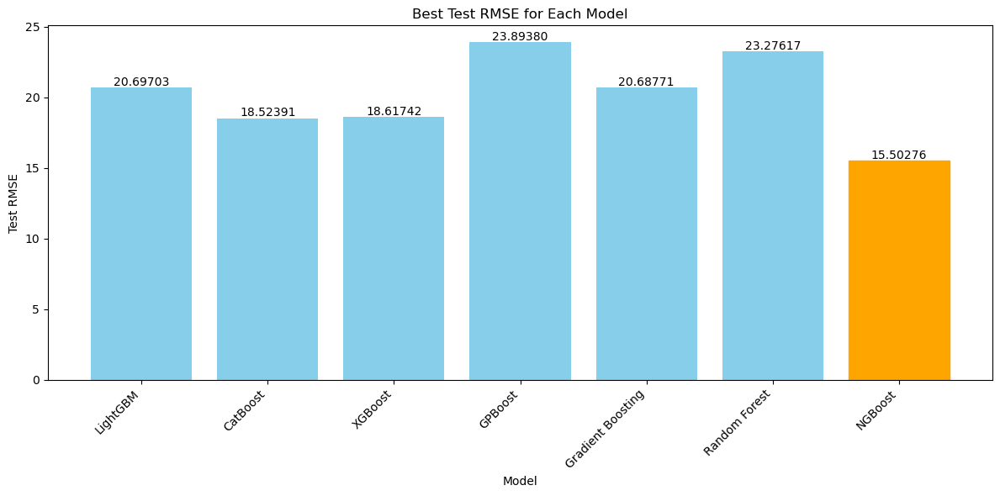

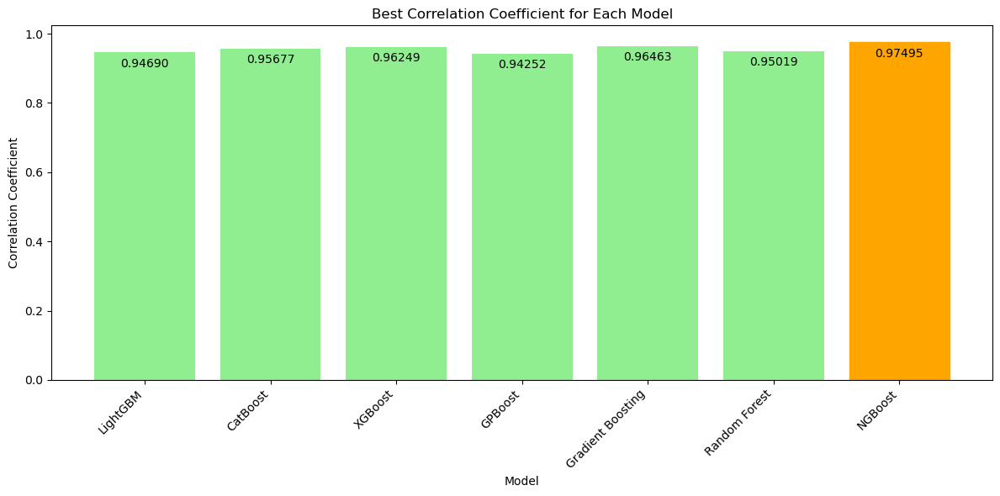

In [29]:
plot_best_scores_without_pruners(best_scores_halving_grid)

  0%|          | 0/47 [00:00<?, ?it/s]

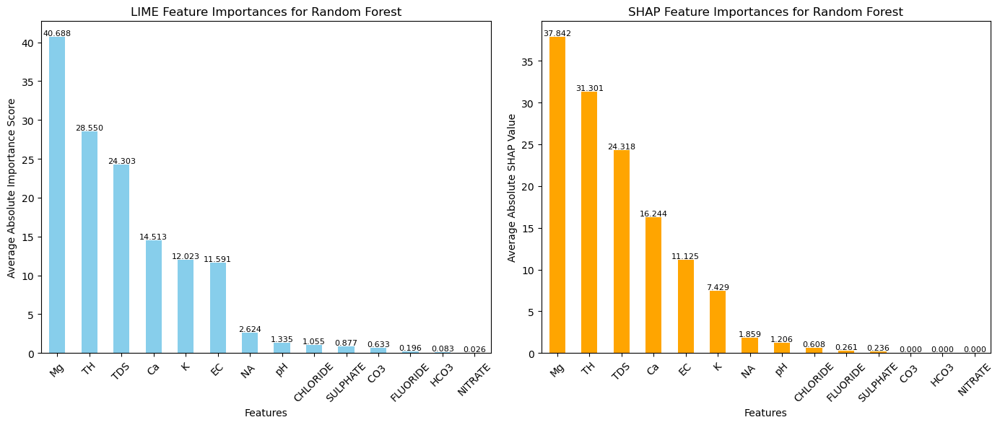

  0%|          | 0/47 [00:00<?, ?it/s]

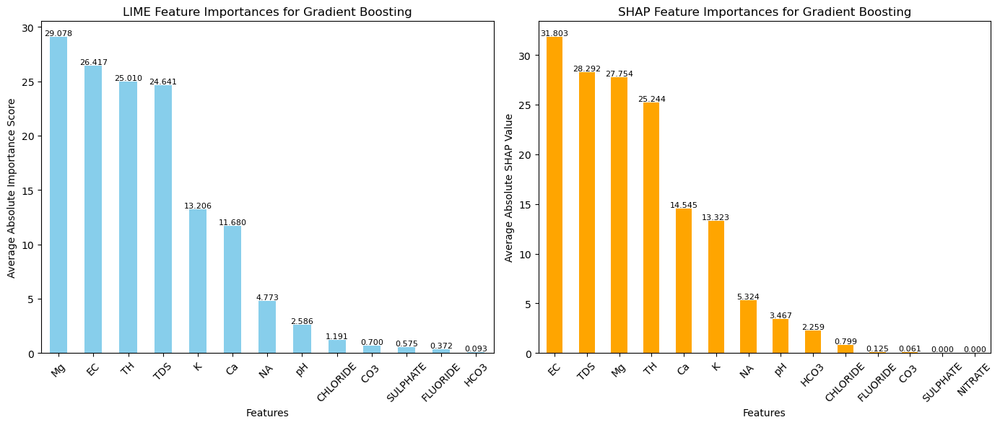

  0%|          | 0/47 [00:00<?, ?it/s]

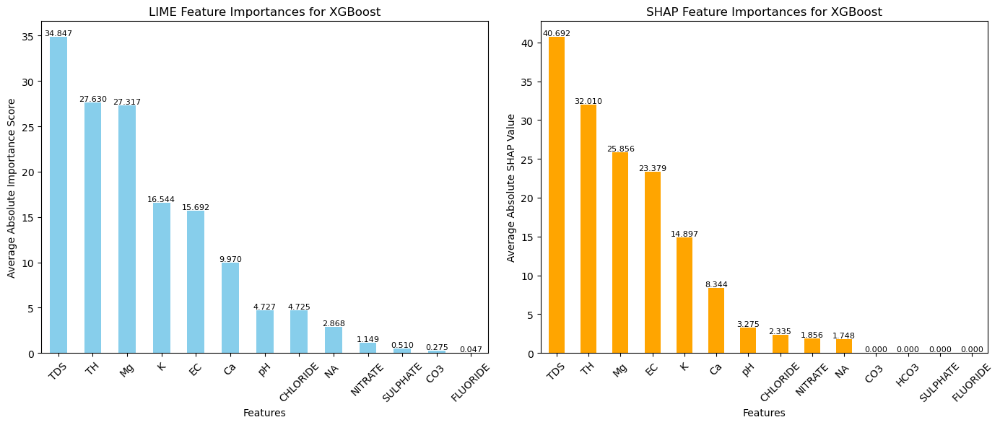

  0%|          | 0/47 [00:00<?, ?it/s]

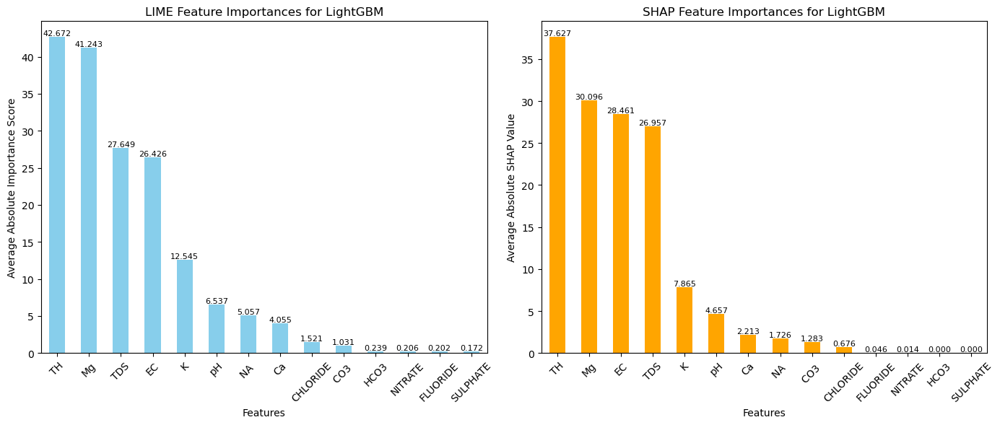

[GPBoost] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[GPBoost] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[GPBoost] [Warning] lambda_l2 is set=0.5, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5


  0%|          | 0/47 [00:00<?, ?it/s]

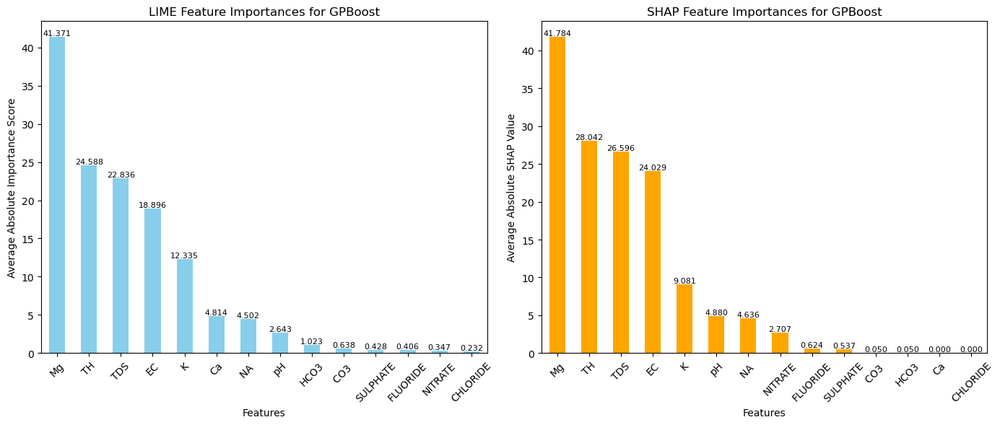

  0%|          | 0/47 [00:00<?, ?it/s]

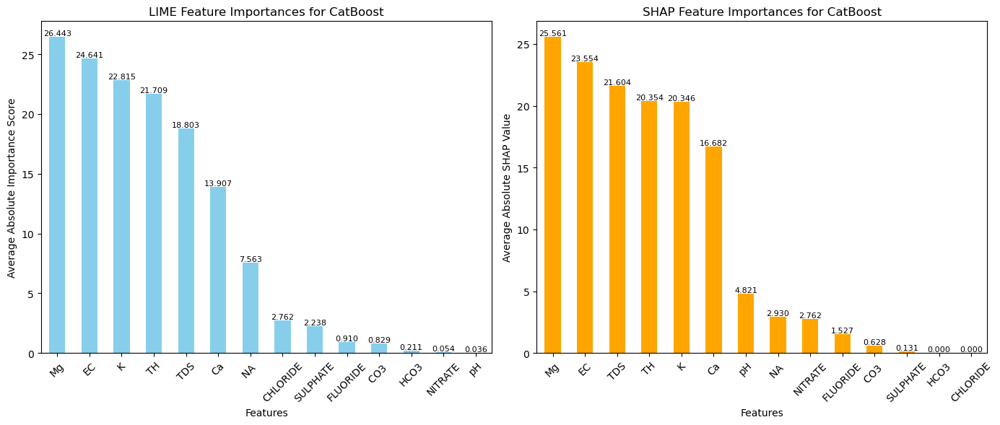

[iter 0] loss=5.5699 val_loss=0.0000 scale=1.0000 norm=45.7691
[iter 100] loss=4.3941 val_loss=0.0000 scale=2.0000 norm=23.9952


  0%|          | 0/47 [00:00<?, ?it/s]

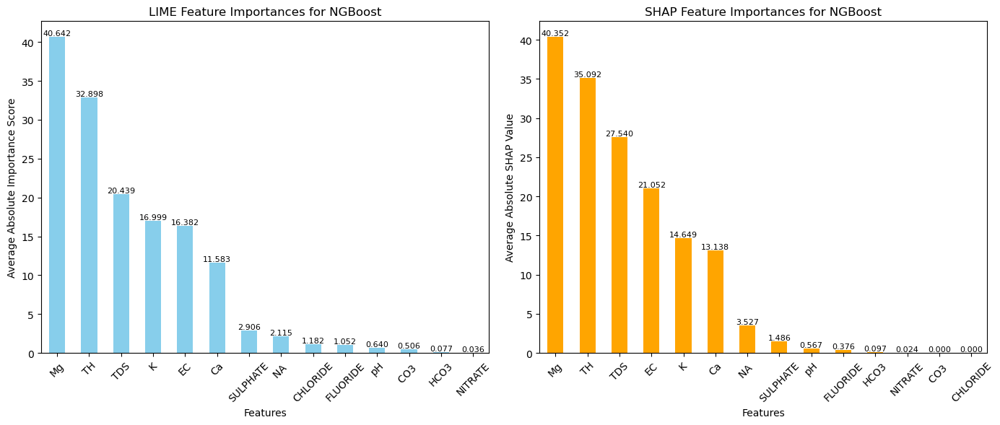

In [30]:
generate_interpretml_explanations_summary(best_scores_halving_grid, X_train, y_train, x_test, feature_names)

# **EBM**

# **Best model analysis**

Explainable Boosting Regressor
  MSE: 32668.382
  RMSE: 180.744
  Correlation Coefficient: 0.070


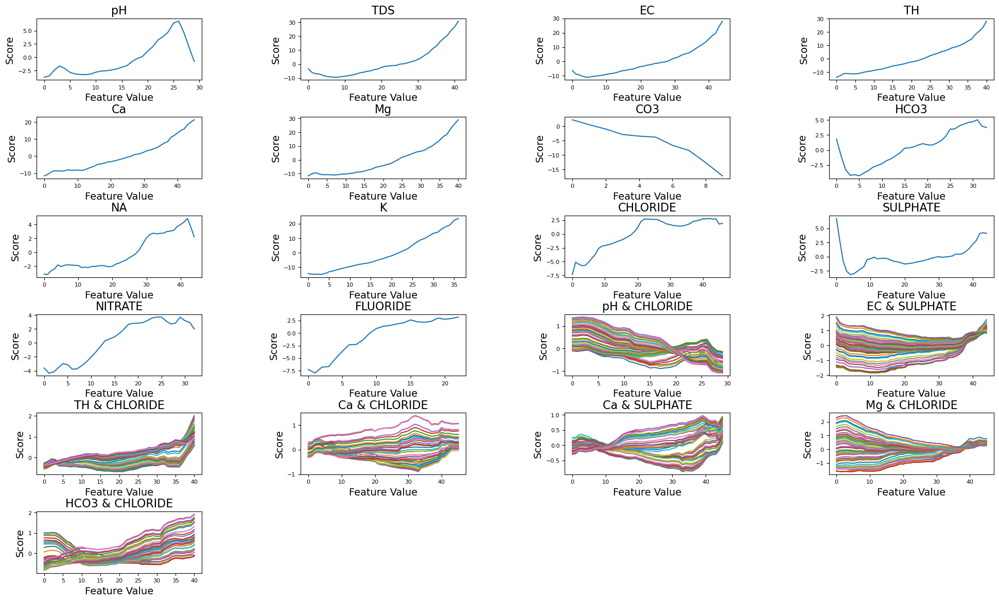

In [86]:
# Set visualization provider
set_visualize_provider(InlineProvider())

# Define feature names
feature_names = ['pH', 'TDS', 'EC', 'TH', 'Ca', 'Mg', 'CO3', 'HCO3', 'NA', 'K', 'CHLORIDE', 'SULPHATE', 'NITRATE', 'FLUORIDE']

# Train and evaluate the ExplainableBoostingRegressor
ebm = ExplainableBoostingRegressor(feature_names=feature_names)
ebm.fit(X_train, y_train)

# Evaluate the EBM model
ebm_mse = mean_squared_error(y_test, ebm.predict(x_test))
ebm_rmse = np.sqrt(ebm_mse)
ebm_correlation = np.corrcoef(y_test, ebm.predict(x_test))[0, 1]

print("Explainable Boosting Regressor")
print(f"  MSE: {ebm_mse:.3f}")
print(f"  RMSE: {ebm_rmse:.3f}")
print(f"  Correlation Coefficient: {ebm_correlation:.3f}")

# Visualize global explanations for EBM
show(ebm.explain_global())

# Get global explanations
global_explanation = ebm.explain_global()

# Filter features to include only individual ones, excluding combinations
filtered_features = [f for f in global_explanation.data()['names'] if f in ['K', 'NITRATE'] or ('K' not in f and 'NITRATE' not in f)]

# Plot all feature explanations in a grid
num_features = len(filtered_features)
fig, axes = plt.subplots((num_features + 3) // 4, 4, figsize=(24, 14))  # Adjusted grid size
axes = axes.flatten()

for i, feature in enumerate(filtered_features):
    # Get the specific feature explanation
    feature_explanation = global_explanation.data(i)
    
    # Plot the feature explanation
    axes[i].plot(feature_explanation['scores'])
    axes[i].set_title(feature, fontsize=16)
    axes[i].set_xlabel('Feature Value', fontsize=14)
    axes[i].set_ylabel('Score', fontsize=14)
    axes[i].tick_params(axis='x', labelsize=8)
    axes[i].tick_params(axis='y', labelsize=8)

# Hide any unused subplots
for j in range(num_features, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout to add space between plots
plt.subplots_adjust(hspace=0.6, wspace=0.6)

plt.show()

In [ ]:
def evaluate_best_model(
    best_scores_basesampler,
    best_scores_grid_sampler,
    best_scores_random_sampler,
    best_scores_tpe_sampler,
    best_scores_cmaes_sampler,
    best_scores_gp_sampler,
    best_scores_partial_fixed_sampler,
    best_scores_brute_force,
    best_scores_nsga_ii_sampler,
    best_scores_nsga_iii_sampler,
    best_scores_qmc_sampler,
    best_scores_halving_grid,
    model_classes,
    X_train,
    y_train,
    X_test,
    y_test,
    csv_file_path):
    """
    Evaluates the best model among the given models with and without pruner,
    fits it on the training data, predicts on test data, and plots actual vs. predicted values.
    Also appends the predicted values to a CSV file as a new column.

    Parameters:
    - best_scores_*: Dictionaries containing performance metrics and best_params.
                     Some may include pruner information in the keys.
    - model_classes: Dictionary mapping model names to model classes.
    - X_train, y_train: Training data.
    - X_test, y_test: Test data.
    - csv_file_path: Path to the CSV file where predictions will be appended.

    Returns:
    - None
    """

    # Combine dictionaries into lists
    best_scores_with_pruner_list = [
        best_scores_basesampler,
        best_scores_grid_sampler,
        best_scores_random_sampler,
        best_scores_tpe_sampler,
        best_scores_cmaes_sampler,
        best_scores_gp_sampler,
        best_scores_partial_fixed_sampler,
        best_scores_brute_force,
    ]
    best_scores_without_pruner_list = [
        best_scores_nsga_ii_sampler,
        best_scores_nsga_iii_sampler,
        best_scores_qmc_sampler,
        best_scores_halving_grid
    ]

    # Combine all entries into a list
    combined_scores = []

    # Extract entries from dictionaries with pruner information
    for sampler_name, best_scores_dict in zip(
        ['BaseSampler', 'GridSampler', 'RandomSampler', 'TPESampler', 'CMAESSampler', 'GPSampler', 'PartialFixedSampler', 'BruteForce'],
        best_scores_with_pruner_list):
        for key, value in best_scores_dict.items():
            model_name = key[0] if isinstance(key, tuple) else key
            mse = value['test_mse']
            combined_scores.append({
                'model_name': model_name,
                'sampler_name': sampler_name,
                'test_mse': mse,
                'best_params': value['best_params']
            })

    # Extract entries from dictionaries without pruner information
    for sampler_name, best_scores_dict in zip(
        ['NSGAIISampler', 'NSGAIIISampler', 'QMCSampler', 'HalvingGrid'],
        best_scores_without_pruner_list):
        for key, value in best_scores_dict.items():
            model_name = key[0] if isinstance(key, tuple) else key
            mse = value['test_mse']
            combined_scores.append({
                'model_name': model_name,
                'sampler_name': sampler_name,
                'test_mse': mse,
                'best_params': value['best_params']
            })

    # Find the entry with the lowest test MSE
    best_entry = min(combined_scores, key=lambda x: x['test_mse'])

    best_model_name = best_entry['model_name']
    best_sampler_name = best_entry['sampler_name']
    best_params = best_entry['best_params']

    print(f"Best Model: {best_model_name}")
    print(f"Sampler Used: {best_sampler_name}")
    print(f"Best Test MSE: {best_entry['test_mse']:.4f}")
    print(f"Best Parameters: {best_params}")

    # Get the model class
    model_class = model_classes.get(best_model_name)

    if model_class is None:
        print(f"Model class for {best_model_name} not found in model_classes dictionary.")
        return

    # Instantiate and fit the model with best parameters
    model = model_class(**best_params)
    model.fit(X_train, y_train)

    # Predict on test data
    y_pred = model.predict(X_test)

    # Round the predicted values to 2 decimal places
    y_pred_rounded = np.round(y_pred, 2)

    # Calculate RMSE and correlation coefficient
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    correlation_coefficient = np.corrcoef(y_test, y_pred)[0, 1]

    print(f"RMSE: {rmse:.4f}")
    print(f"Correlation Coefficient: {correlation_coefficient:.4f}")

    # Plot actual vs. predicted values
    plt.figure(figsize=(12, 8))

    # Scatter plot of actual vs. predicted values
    plt.subplot(1, 2, 1)
    plt.scatter(y_test, y_pred_rounded, color='green', label='Predicted vs Actual')
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Ideal Fit')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.title('Scatter Plot')
    plt.legend()

    # Line plot of actual and predicted values
    plt.subplot(1, 2, 2)
    plt.plot(range(len(y_test)), y_test, marker='o', linestyle='-', color='blue', label='Actual Values')
    plt.plot(range(len(y_pred_rounded)), y_pred_rounded, marker='s', linestyle='--', color='green', label='Predicted Values')
    plt.xlabel('Data Point Index')
    plt.ylabel('Target Value')
    plt.title('Line Plot')
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Load the existing CSV file
    df = pd.read_csv(csv_file_path)

    # Add the rounded predicted values as a new column
    df['Predicted_Values'] = y_pred_rounded

    # Save the updated DataFrame back to the CSV file
    df.to_csv(csv_file_path, index=False)



file = r"C:\Users\dell\Desktop\datascience\projects\results\test.csv"
# Call the function with your dictionaries and data
evaluate_best_model(
    best_scores_basesampler,
    best_scores_grid_sampler,
    best_scores_random_sampler,
    best_scores_tpe_sampler,
    best_scores_cmaes_sampler,
    best_scores_gp_sampler,
    best_scores_partial_fixed_sampler,
    best_scores_brute_force,
    best_scores_nsga_ii_sampler,
    best_scores_nsga_iii_sampler,
    best_scores_qmc_sampler,
    best_scores_halving_grid,
    model_classes,
    X_train,
    y_train,
    X_test,
    y_test,
    file  
)